<a href="https://colab.research.google.com/github/Ebatallas/Machine-Learning-for-Oilfield-Optimization/blob/main/Tesis_EstefiBatallas.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# <span style="color:blue">**Machine Learning for Oilfield Optimization: Identifying Intervention Opportunities and Forecasting Production in Ecuadorian Mature Reservoirs**</span>
### **Por:** Estefi Batallas
### **Tutor:** Ricardo Flores
## **Definicion del Problema:**
Las intervenciones en pozos, como los redisparos, la estimulación matricial, ampliacion de intervalos y PURE, son esenciales para maximizar la producción de un pozo de petroleo. Sin embargo, seleccionar el tipo adecuado de intervención para cada pozo representa un desafío complejo, debido a la gran cantidad de variables involucradas y los costos asociados con cada operación.

Este proceso de decisión se realiza manualmente la selección entre un total de 400 pozos anualmente lo cual consume más de 2,400 horas-hombre anuales y dejando margen para errores humanos en la selección.
## **Solucion**
Se propone desarrollar un sistema basado en aprendizaje automático que recomiende el tipo de intervención óptima para cada pozo, y que también prediga el caudal de fluido (BFPD), la producción de petróleo (BOPD) y el porcentaje de corte de agua (BSW) posterior a la intervención.

**Nota**: Para el proyecto de la Materia machine Learning vamos a presentar el desarrollo de un sistema de recomendacion que pueda predecir el tipo de intervencion optima para cada pozo



## **Descripcion del Data Set:**
Son 4 bases de datos que contienen  
1) **Coordenadas de Pozo:** contiene 963 registros con 4 variables.

    •La arena a la que pertenecen ("Sand")

    •Su identificador único ("Wellbore")
    
    •Las coordenadas geográficas que definen su ubicación, como la longitud ("Longitude") y la latitud ("Latitude").

2) **Historico de Actividades:** contiene 248 registros con 14 variables.  Desde las fechas 1977 hasta 2022

    •	Wellbore: Identificación única de cada pozo.

    •	Sand: Tipo de arena presente en el pozo

    •	Zone: Ubicación del pozo en el campo (norte, sur, centro)

    •	Date: Fecha en la que finalización de la ejecucion de la actividad.

    •	Activity: Tipo de actividad de intervención realizada (re-perforación, estimulacion, ampliacion de intervalos y PURE).

    •	BFPD_Before y BOPD_Before: Tasas de flujo de fluido y producción de petróleo antes de la intervención (en barriles por día).

    •	BSW_Before: Porcentaje de corte de agua antes de la intervención.

    •	Pr (psi): Presión del reservorio en libras por pulgada cuadrada, que puede influir en la producción de fluidos.

    •	Performance: Resultado de la intervención (éxito o fracaso), una información que puede ser relevante para evaluar la efectividad de futuras intervenciones.

    •	Kabs (md): Permeabilidad del pozo medida en milidarcies, indicando la facilidad con la que los fluidos pueden fluir a través de la roca.
    
    •	H (ft): Espesor de la sección del pozo en pies.

3) **Historico de Presiones:** contiene 3145 registros con 8 variables.
    •   Patron de Inyeccion: Hace referencia a si el pozo esta afectado por un proyecto que me permita incrementar la presion de reservorio

    •   Wellbore: Identificación única de cada pozo.

    •	Sand: Tipo de arena presente en el pozo

    •   Date: Fecha en la que se toma el registro de presion

    •   Type of Test: Tipo de prueba realizada para adquirir el dato de presion (BUP,Drawdown,Echometer,FOT,Multirate Test, Sensor Estatico, XPT)

    •   Pr (psi): Presion del reservorio en libras por pulgada cuadrada

    •	Zone: Ubicación del pozo en el campo (norte, sur, centro)

4) **Historico de Pruebas de Produccion** contiene 70935 registros con 13 variables

    •Wellbore: Identificador único del pozo. Puede incluir un código alfanumérico que distingue el pozo y su localización específica.

    •Date: Fecha en la que se tomaron los datos. Indica el período de tiempo relevante para los valores registrados.

    •Field: Campo petrolero al que pertenece el pozo. Es un indicador geográfico o de la región productora.

    •BFPD (Barrels of Fluid Per Day): Barriles de fluido producidos por día. Incluye tanto petróleo como agua.

    •BOPD (Barrels of Oil Per Day): Barriles de petróleo producidos por día. Representa la producción de petróleo crudo.

    •BWPD (Barrels of Water Per Day): Barriles de agua producidos por día. Muestra la cantidad de agua que acompaña la producción.

    •MSCF (Thousand Standard Cubic Feet): Producción de gas en miles de pies cúbicos estándar por día.

    •BSW (Basic Sediment and Water): Porcentaje de sedimentos y agua en la producción total.

    •GOR (Gas-Oil Ratio): Relación gas-petróleo expresada como volumen de gas producido por volumen de petróleo.

    •API: Gravedad API, que mide la densidad del petróleo crudo. Valores más altos indican petróleo más ligero.

    •WHP (Wellhead Pressure): Presión en la cabeza del pozo, medida en unidades de presión (probablemente psi).

    •PIP (Pressure in Pipe): Presión dentro del sistema de tuberías del pozo.

    •SALIN. (Salinity): Concentración de salinidad del agua producida, probablemente expresada en ppm o mg/L.




In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!ls "/content/drive/MyDrive/TESIS"

Coordenadas_Pozos.xlsx	       Historico_de_Pruebas_de_Produccion.xlsx
Historico_de_Actividades.xlsx  Tesis_EstefiBatallas.ipynb
Historico_de_Presiones.xlsx


# ANALIS EXPLORATORIO DE DATOS

In [ ]:
import pandas as pd

# Leer los archivos Excel
coordenadas_pozos_path = "/content/drive/MyDrive/TESIS/Coordenadas_Pozos.xlsx"
historico_actividades_path = "/content/drive/MyDrive/TESIS/Historico_de_Actividades.xlsx"
historico_presiones_path = "/content/drive/MyDrive/TESIS/Historico_de_Presiones.xlsx"
historico_pruebas_produccion_path = "/content/drive/MyDrive/TESIS/Historico_de_Pruebas_de_Produccion.xlsx"

# Cargar los datos
coordenadas_pozos = pd.read_excel(coordenadas_pozos_path)
historico_actividades = pd.read_excel(historico_actividades_path)
historico_presiones = pd.read_excel(historico_presiones_path)
historico_pruebas_produccion = pd.read_excel(historico_pruebas_produccion_path)

# Resumen rápido de cada conjunto de datos
datasets = {
    "Coordenadas Pozos": coordenadas_pozos,
    "Historico Actividades": historico_actividades,
    "Historico Presiones": historico_presiones,
    "Historico Pruebas Producción": historico_pruebas_produccion,
}

# Mostrar los primeros registros y resúmenes de los datos
for name, df in datasets.items():
    print(f"\n=== {name} ===")
    print(df.info())
    print(df.head())




=== Coordenadas Pozos ===
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 963 entries, 0 to 962
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Sand       963 non-null    object 
 1   Wellbore   963 non-null    object 
 2   Longitude  963 non-null    float64
 3   Latitude   963 non-null    float64
dtypes: float64(2), object(2)
memory usage: 30.2+ KB
None
  Sand   Wellbore  Longitude  Latitude
0   BT  ACA-001BT -76.877792 -0.675272
1   TS  ACA-001TS -76.877792 -0.675272
2   TI  ACA-001TI -76.877792 -0.675272
3   HS  ACA-001HS -76.877792 -0.675272
4   HI  ACA-001HI -76.877792 -0.675272

=== Historico Actividades ===
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 248 entries, 0 to 247
Data columns (total 17 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Well         248 non-null    object        
 1   WO           22 non-null     float64       
 2   

In [ ]:
# Función para identificar tipos de variables en un DataFrame
def identificar_tipos_variables(df):
    tipos_columnas = {
        "Entero": [],
        "Decimal": [],
        "Fecha": [],
        "Texto": [],
        "Otro": []
    }

    for column in df.columns:
        if pd.api.types.is_integer_dtype(df[column]):
            tipos_columnas["Entero"].append(column)
        elif pd.api.types.is_float_dtype(df[column]):
            tipos_columnas["Decimal"].append(column)
        elif pd.api.types.is_datetime64_any_dtype(df[column]):
            tipos_columnas["Fecha"].append(column)
        elif pd.api.types.is_string_dtype(df[column]):
            tipos_columnas["Texto"].append(column)
        else:
            tipos_columnas["Otro"].append(column)

    return tipos_columnas

# Aplicar la función a cada dataset
datasets = {
    "Coordenadas Pozos": coordenadas_pozos,
    "Historico de Actividades Corregido": historico_actividades,
    "Historico de Presiones": historico_presiones,
    "Historico de Pruebas de Producción": historico_pruebas_produccion
}

# Mostrar el tipo de variables para cada dataset
for name, df in datasets.items():
    print(f"\n=== Tipos de Variables en: {name} ===")
    tipos = identificar_tipos_variables(df)
    for tipo, columnas in tipos.items():
        print(f"{tipo}: {columnas}")



=== Tipos de Variables en: Coordenadas Pozos ===
Entero: []
Decimal: ['Longitude', 'Latitude']
Fecha: []
Texto: ['Sand', 'Wellbore']
Otro: []

=== Tipos de Variables en: Historico de Actividades Corregido ===
Entero: ['BFPD_Before', 'BOPD_Before', 'BSW_Before', 'BFPD_After', 'BOPD_After', 'BSW_After', 'Pr (psi)', 'Kabs (md)', 'H (ft)']
Decimal: ['WO']
Fecha: ['Date']
Texto: ['Well', 'Sand', 'Wellbore', 'Zone', 'Activity', 'Performance']
Otro: []

=== Tipos de Variables en: Historico de Presiones ===
Entero: []
Decimal: ['Pr (psi)']
Fecha: ['Date']
Texto: []
Otro: ['INJECTION_PATTERN', 'Wellbore', 'FIELD', 'Sand', 'TYPE OF TEST', 'Zone']

=== Tipos de Variables en: Historico de Pruebas de Producción ===
Entero: []
Decimal: ['BOPD', 'BWPD', 'MSCF', 'BSW', 'GOR', 'API', ' WHP', 'PIP', 'SALIN.']
Fecha: ['Date']
Texto: ['Wellbore']
Otro: ['Field', 'BFPD']


In [ ]:
import pandas as pd

# Función para corregir las columnas según el formato deseado
def corregir_columnas(df, columnas_enteras=None, columnas_decimales=None, columnas_texto=None, columnas_fecha=None):
    if columnas_enteras:
        for col in columnas_enteras:
            if col in df.columns:
                df[col] = pd.to_numeric(df[col], errors='coerce', downcast='integer')  # Convertir a entero
    if columnas_decimales:
        for col in columnas_decimales:
            if col in df.columns:
                df[col] = pd.to_numeric(df[col], errors='coerce')  # Convertir a decimal
    if columnas_texto:
        for col in columnas_texto:
            if col in df.columns:
                df[col] = df[col].astype(str)  # Convertir a texto
    if columnas_fecha:
        for col in columnas_fecha:
            if col in df.columns:
                df[col] = pd.to_datetime(df[col], errors='coerce')  # Convertir a fecha
    return df

# Corrección de las variables de cada dataset
historico_actividades = corregir_columnas(
    historico_actividades,
    columnas_enteras=['WO'],
    columnas_decimales=['BFPD_Before', 'BOPD_Before', 'BSW_Before',
                        'BFPD_After', 'BOPD_After', 'BSW_After',
                        'Pr (psi)', 'Kabs (md)', 'H (ft)'],
    columnas_texto=['Well', 'Sand', 'Wellbore', 'Zone', 'Activity', 'Performance'],
    columnas_fecha=['Date']
)

historico_presiones = corregir_columnas(
    historico_presiones,
    columnas_decimales=['Pr (psi)'],
    columnas_texto=['INJECTION_PATTERN', 'Wellbore', 'FIELD', 'Sand', 'TYPE OF TEST', 'Zone'],
    columnas_fecha=['Date']
)

historico_pruebas_produccion = corregir_columnas(
    historico_pruebas_produccion,
    columnas_decimales=['BFPD', 'BOPD', 'BWPD', 'MSCF', 'BSW', 'GOR', 'API', 'WHP', 'PIP', 'SALIN.'],
    columnas_texto=['Wellbore', 'Field'],
    columnas_fecha=['Date']
)

# Almacenar los datasets corregidos en un diccionario para facilitar su uso
datasets_corrigidos = {
    "Historico de Actividades": historico_actividades,
    "Historico de Presiones": historico_presiones,
    "Historico de Pruebas de Producción": historico_pruebas_produccion
}

# Mostrar información de cada dataset corregido
for nombre, df in datasets_corrigidos.items():
    print(f"\n=== Resumen del dataset: {nombre} ===")
    print(df.info())

# Ahora, los DataFrames corregidos están listos para ser usados en análisis, visualización y entrenamiento de modelos



=== Resumen del dataset: Historico de Actividades ===
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 248 entries, 0 to 247
Data columns (total 17 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Well         248 non-null    object        
 1   WO           22 non-null     float64       
 2   Sand         248 non-null    object        
 3   Wellbore     248 non-null    object        
 4   Zone         248 non-null    object        
 5   Date         248 non-null    datetime64[ns]
 6   Activity     248 non-null    object        
 7   BFPD_Before  248 non-null    int64         
 8   BOPD_Before  248 non-null    int64         
 9   BSW_Before   248 non-null    int64         
 10  BFPD_After   248 non-null    int64         
 11  BOPD_After   248 non-null    int64         
 12  BSW_After    248 non-null    int64         
 13  Pr (psi)     248 non-null    int64         
 14  Performance  248 non-null    object        
 15  Ka

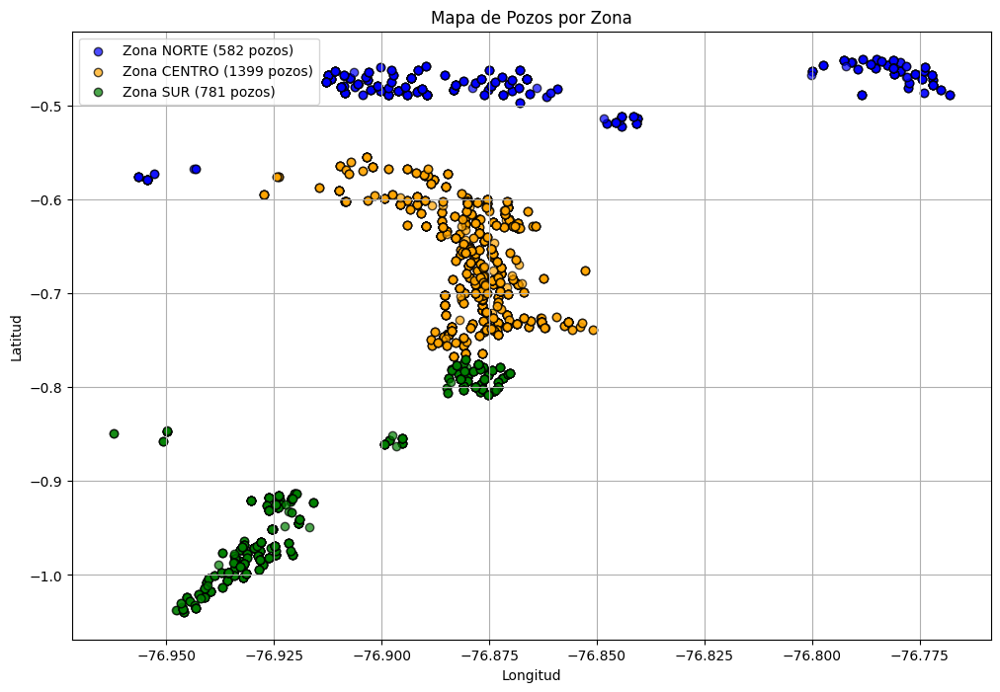

Cantidad de pozos por zona:
Zone
CENTRO    1399
SUR        781
NORTE      582
Name: count, dtype: int64


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Realizar el merge para obtener las zonas de los pozos
merged_data = pd.merge(coordenadas_pozos, historico_presiones[['Wellbore', 'Zone']], on='Wellbore', how='left')

# Asignar colores a cada zona
color_mapping = {
    "NORTE": "blue",
    "CENTRO": "orange",
    "SUR": "green"
}

merged_data['Color'] = merged_data['Zone'].map(color_mapping)

# Contar la cantidad de pozos por zona
pozos_por_zona = merged_data['Zone'].value_counts()

# Graficar el mapa de pozos por zona
plt.figure(figsize=(12, 8))

# Graficar cada zona con su color asignado
for zone, color in color_mapping.items():
    zone_data = merged_data[merged_data['Zone'] == zone]
    plt.scatter(
        zone_data['Longitude'],
        zone_data['Latitude'],
        c=color,
        label=f"Zona {zone} ({pozos_por_zona.get(zone, 0)} pozos)",  # Mostrar la cantidad de pozos en la leyenda
        alpha=0.7,
        edgecolor='k'
    )

# Personalizar el gráfico
plt.title("Mapa de Pozos por Zona")
plt.xlabel("Longitud")
plt.ylabel("Latitud")
plt.legend()
plt.grid(True)
plt.show()

# Mostrar la cantidad de pozos por zona
print("Cantidad de pozos por zona:")
print(pozos_por_zona)


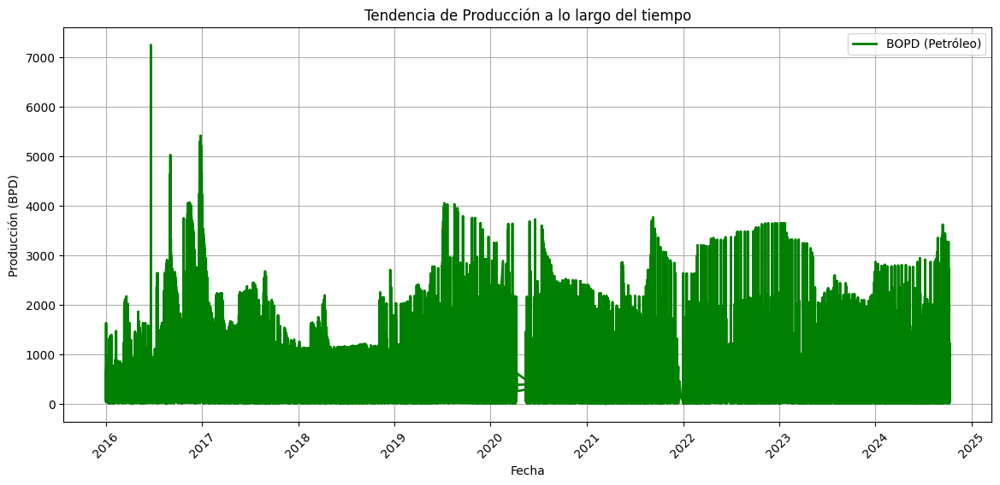

In [ ]:
import matplotlib.pyplot as plt

# Crear la figura y el gráfico de línea
plt.figure(figsize=(14, 6))

# Graficar la producción de petróleo (BOPD) encima del BFPD con un color más visible
plt.plot(historico_pruebas_produccion['Date'], historico_pruebas_produccion['BOPD'],
         label='BOPD (Petróleo)', color='green', linestyle='-', linewidth=2)

# Personalizar el gráfico
plt.title("Tendencia de Producción a lo largo del tiempo")
plt.xlabel("Fecha")
plt.ylabel("Producción (BPD)")
plt.xticks(rotation=45)  # Rotar etiquetas del eje X para mejor visualización
plt.legend()
plt.grid(True)
plt.show()


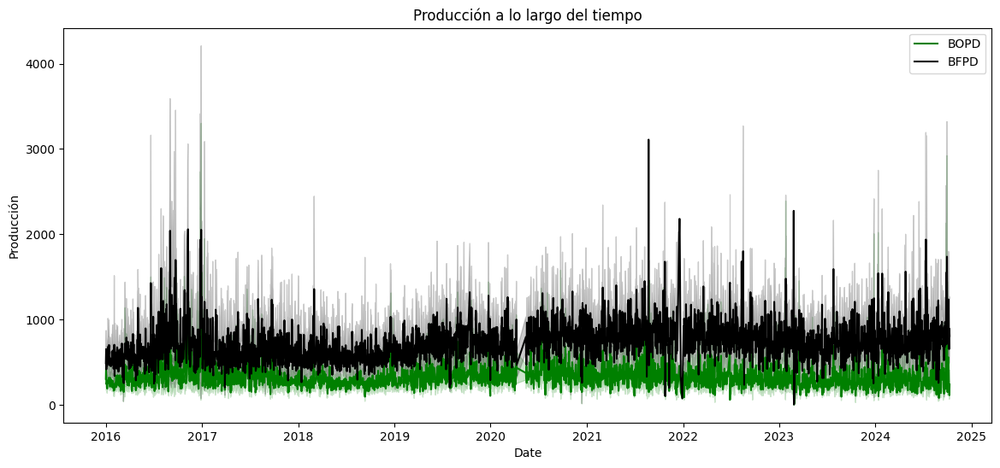

In [ ]:
# Tendencia temporal de producción
import seaborn as sns
plt.figure(figsize=(14, 6))
sns.lineplot(data=historico_pruebas_produccion, x='Date', y='BOPD', label='BOPD', color='green')
sns.lineplot(data=historico_pruebas_produccion, x='Date', y='BFPD', label='BFPD', color='black')
plt.title("Producción a lo largo del tiempo")
plt.ylabel("Producción")
plt.legend()
plt.show()


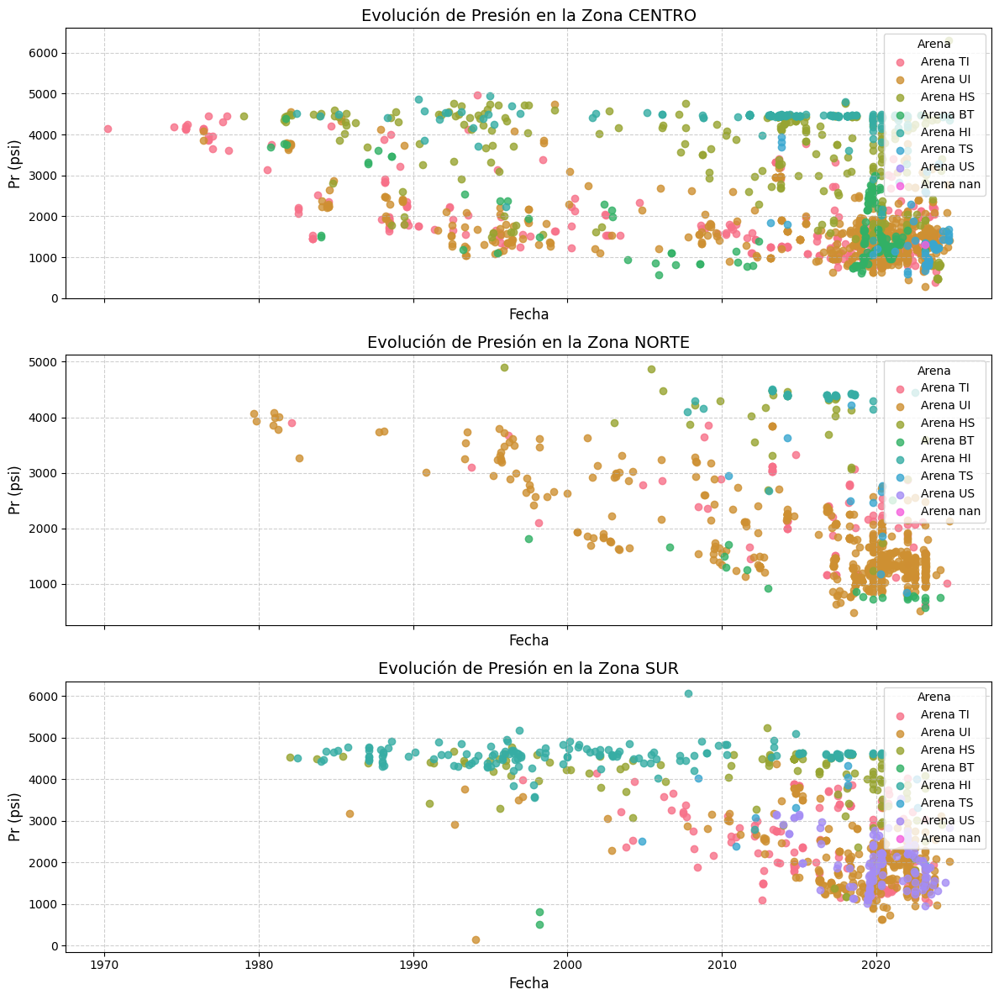

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Extraer el DataFrame de presiones desde el diccionario de datasets corregidos
historico_presiones = datasets_corrigidos["Historico de Presiones"]

# Filtrar datos válidos
historico_presiones_validas = historico_presiones.dropna(subset=['Date', 'Pr (psi)', 'Sand', 'Zone'])

# Obtener las arenas únicas
arenas_unicas = historico_presiones_validas['Sand'].unique()

# Crear una paleta de colores para las arenas (excluyendo azul, naranja, y verde)
arena_palette = sns.color_palette("husl", len(arenas_unicas))
excluded_colors = ['blue', 'orange', 'green']
arena_palette = [color for color in arena_palette if color not in excluded_colors]

# Asignar colores específicos a cada arena
arena_color_mapping = {arena: color for arena, color in zip(arenas_unicas, arena_palette)}

# Crear un gráfico por cada zona
zonas_unicas = historico_presiones_validas['Zone'].unique()
fig, axes = plt.subplots(len(zonas_unicas), 1, figsize=(12, len(zonas_unicas) * 4), sharex=True)

for ax, zona in zip(axes, zonas_unicas):
    # Filtrar datos de la zona
    data_zona = historico_presiones_validas[historico_presiones_validas['Zone'] == zona]

    # Gráfico de puntos por arena
    for arena, color in arena_color_mapping.items():
        data_arena = data_zona[data_zona['Sand'] == arena]
        ax.scatter(
            data_arena['Date'],
            data_arena['Pr (psi)'],
            label=f"Arena {arena}",
            color=color,
            alpha=0.8
        )

    # Configuración del subgráfico
    ax.set_title(f"Evolución de Presión en la Zona {zona}", fontsize=14)
    ax.set_xlabel("Fecha", fontsize=12)
    ax.set_ylabel("Pr (psi)", fontsize=12)
    ax.grid(True, linestyle='--', alpha=0.6)
    ax.legend(title="Arena", loc='upper right')

# Configuración general
plt.tight_layout()
plt.show()


<ipython-input-10-64fc0404ecaf>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  historico_presiones['Date'] = pd.to_datetime(historico_presiones['Date'])


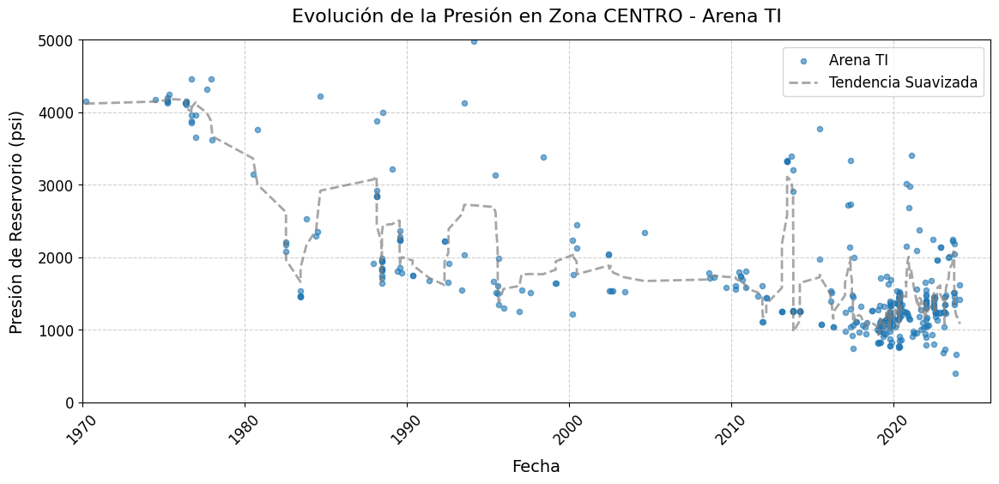

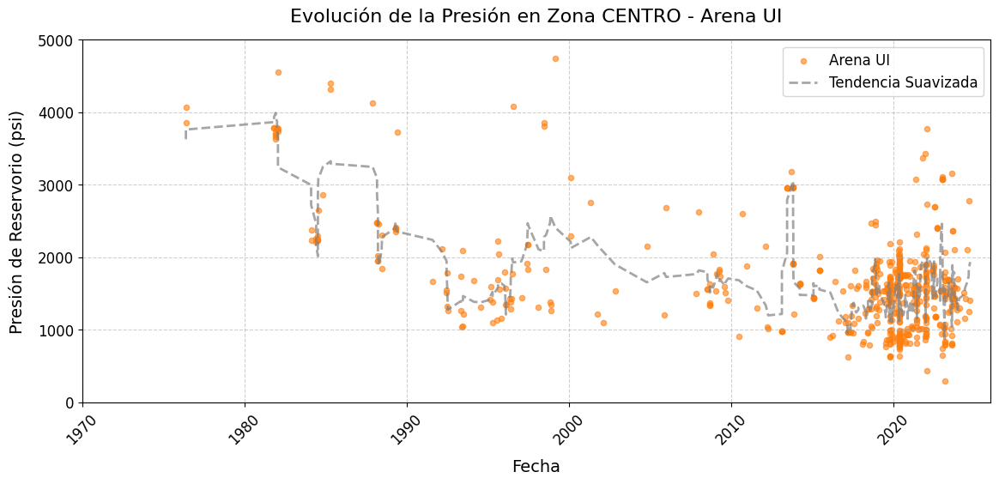

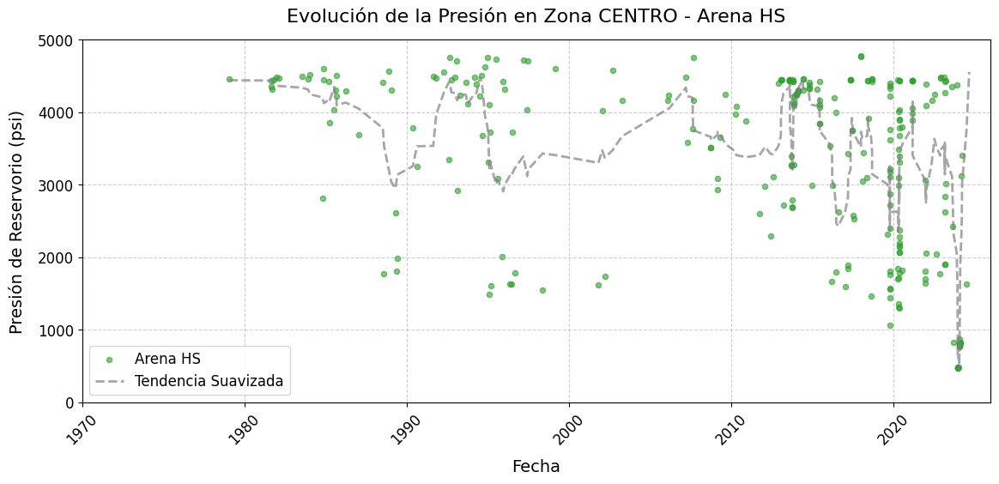

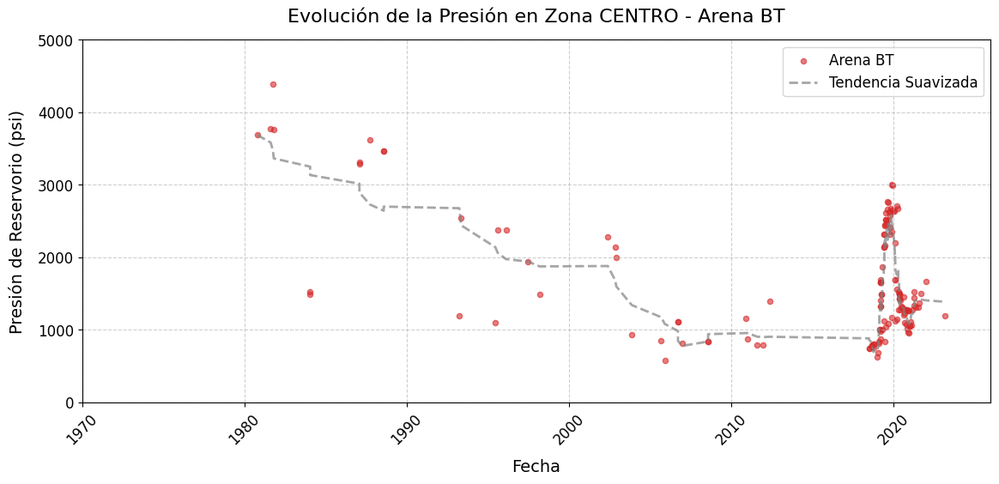

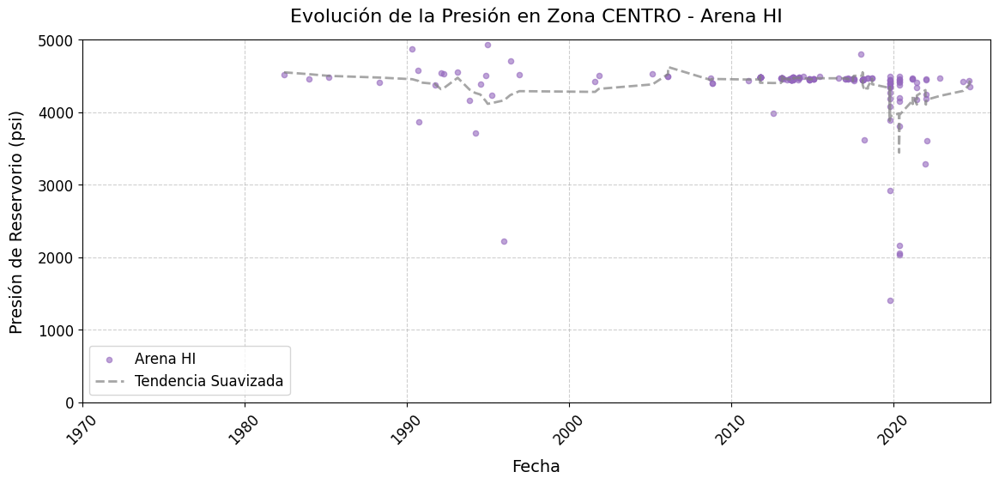

...

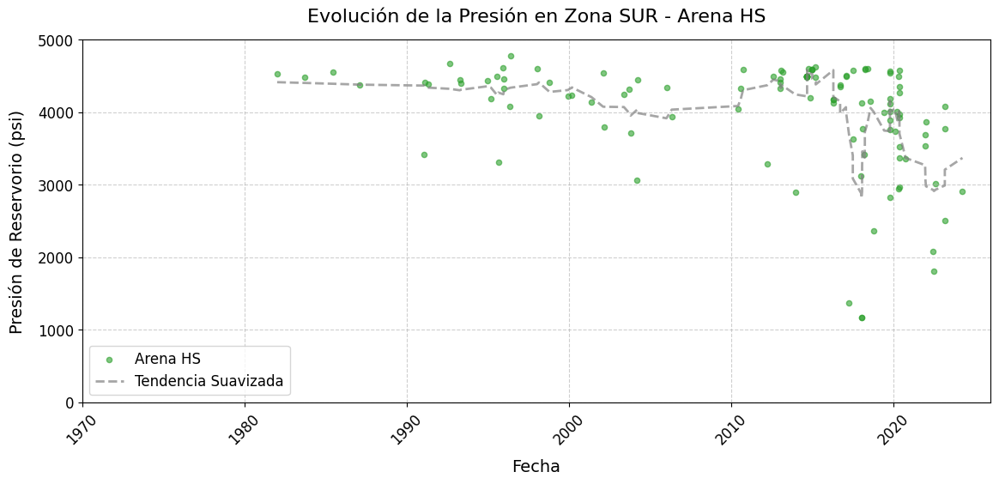

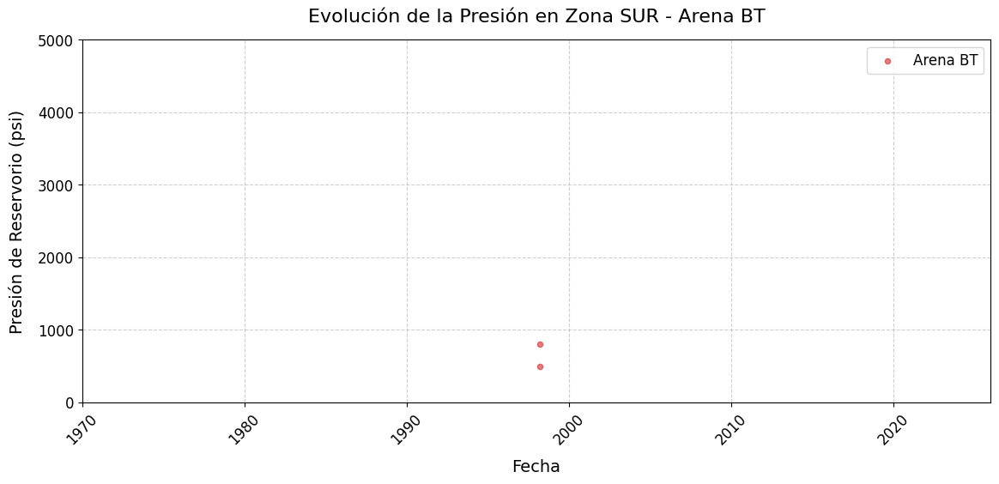

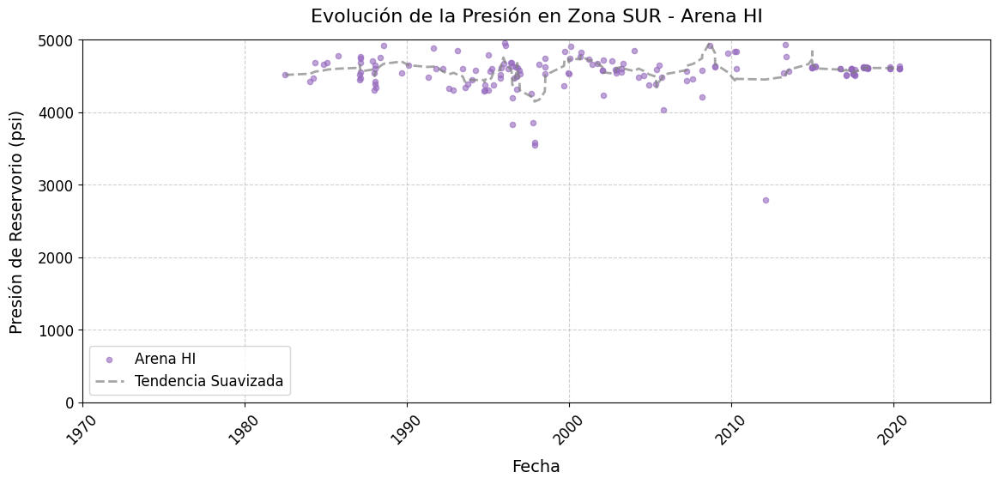

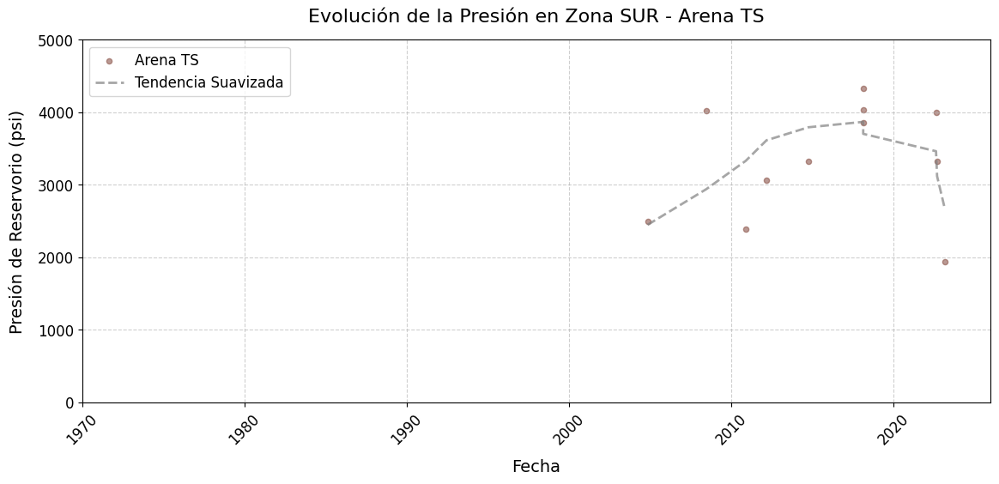

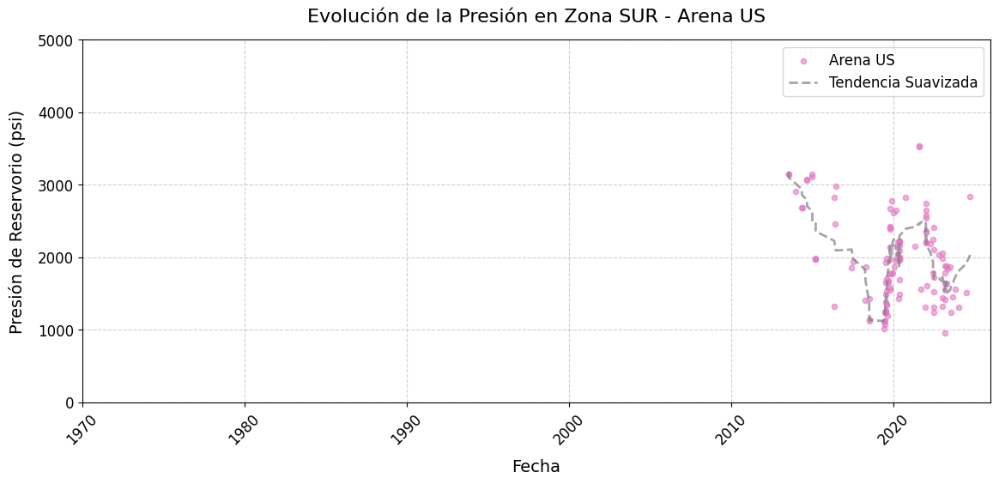

In [ ]:
# Volver a cargar el dataset
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal
import seaborn as sns
# Extraer el DataFrame de presiones desde el diccionario de datasets corregidos
historico_presiones = datasets_corrigidos["Historico de Presiones"]

# Eliminar valores NaN en las columnas clave
historico_presiones = historico_presiones.dropna(subset=['Date', 'Pr (psi)', 'Sand', 'Zone'])

# Convertir la columna de fechas a formato datetime
historico_presiones['Date'] = pd.to_datetime(historico_presiones['Date'])

# Definir colores para cada arena
arenas = historico_presiones["Sand"].unique()
arena_colores = sns.color_palette("tab10", n_colors=len(arenas))
arena_color_mapping = dict(zip(arenas, arena_colores))

# Definir el rango de fechas fijo
fecha_inicio = pd.Timestamp("1970-01-01")
fecha_final = pd.Timestamp("2025-12-31")

# Crear gráficos individuales para cada combinación de Zona y Arena con márgenes ajustados
zonas = historico_presiones["Zone"].unique()

for zona in zonas:
    for arena in arenas:
        # Filtrar los datos
        data = historico_presiones[(historico_presiones["Zone"] == zona) & (historico_presiones["Sand"] == arena)]

        if not data.empty:  # Verificar que haya datos
            fig, ax = plt.subplots(figsize=(12, 6))

            # Graficar los puntos de presión con color asignado a la arena
            ax.scatter(data["Date"], data["Pr (psi)"], color=arena_color_mapping[arena], alpha=0.6, s=20, label=f"Arena {arena}")

            # Suavizar la tendencia si hay suficientes datos
            if len(data) > 10:
                x = data["Date"].map(pd.Timestamp.toordinal)  # Convertir fechas a números
                y = data["Pr (psi)"]
                sorted_indices = np.argsort(x)
                x_sorted = x.iloc[sorted_indices]
                y_sorted = y.iloc[sorted_indices]

                # Ajustar la ventana para evitar errores en datos escasos
                window_size = min(15, len(y_sorted)//2*2+1)
                if window_size > 2:
                    y_smooth = scipy.signal.savgol_filter(y_sorted, window_length=window_size, polyorder=2)
                    ax.plot(data["Date"].iloc[sorted_indices], y_smooth, linestyle="--", linewidth=2, color="gray", alpha=0.7, label="Tendencia Suavizada")

            # Configurar el gráfico con márgenes adecuados
            ax.set_xlabel("Fecha", fontsize=14, labelpad=10)
            ax.set_ylabel("Presión de Reservorio (psi)", fontsize=14, labelpad=10)
            ax.set_title(f"Evolución de la Presión en Zona {zona} - Arena {arena}", fontsize=16, pad=15)
            ax.set_ylim(0, 5000)
            ax.set_xlim(fecha_inicio, fecha_final)
            ax.tick_params(axis='x', rotation=45, labelsize=12)
            ax.tick_params(axis='y', labelsize=12)
            ax.legend(fontsize=12)
            ax.grid(True, linestyle="--", alpha=0.6)

            # Ajustar layout para evitar cortes en los ejes
            plt.tight_layout(pad=2.0)

            # Mostrar gráfico
            plt.show()


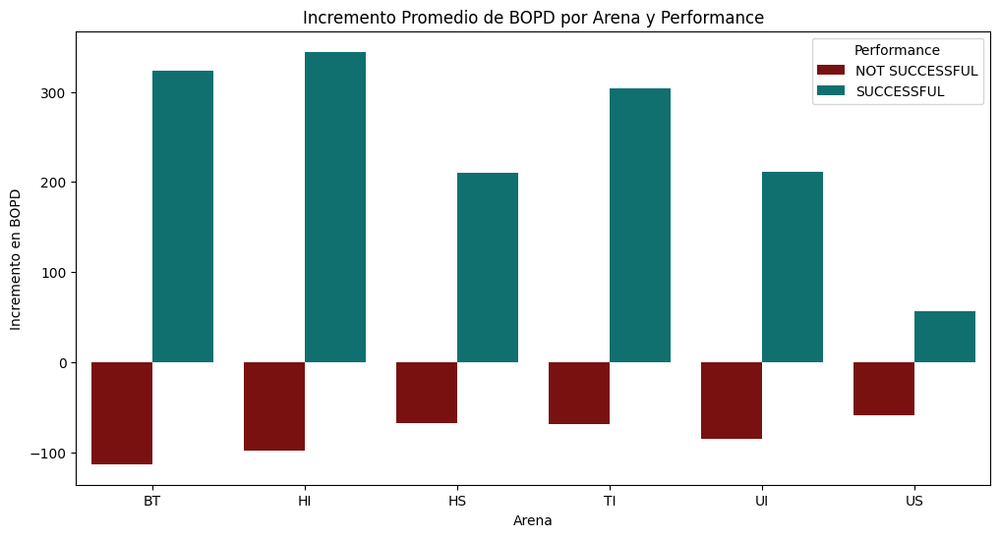

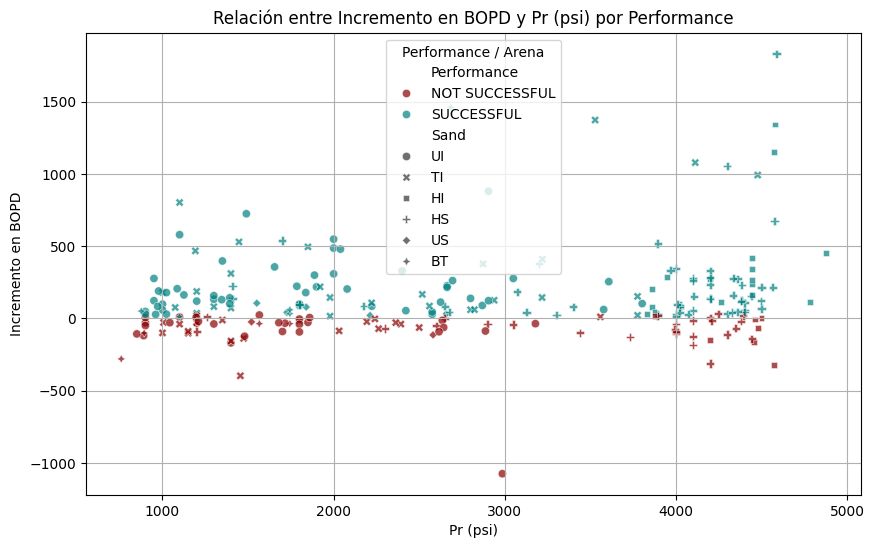

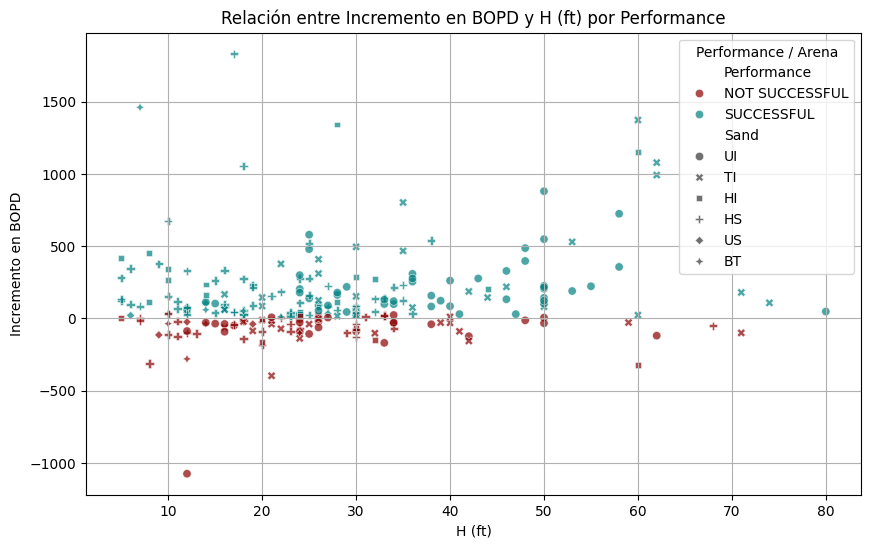

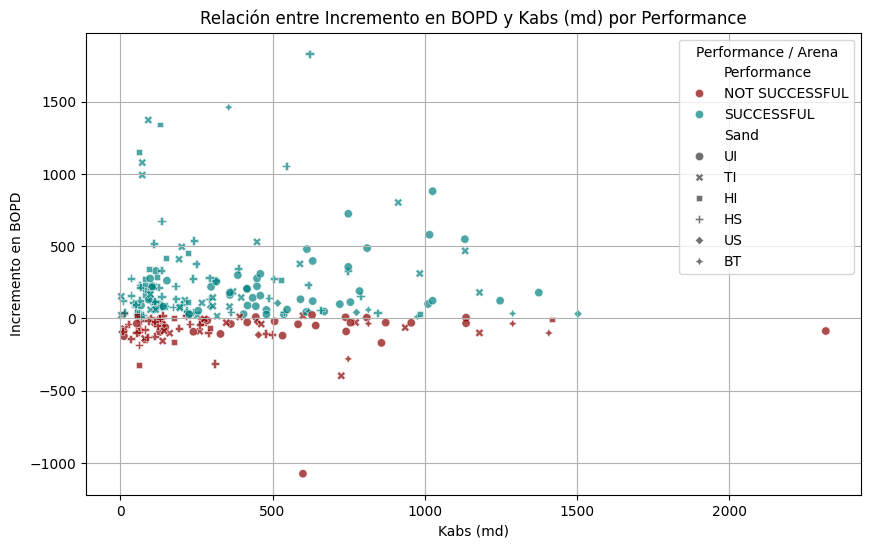

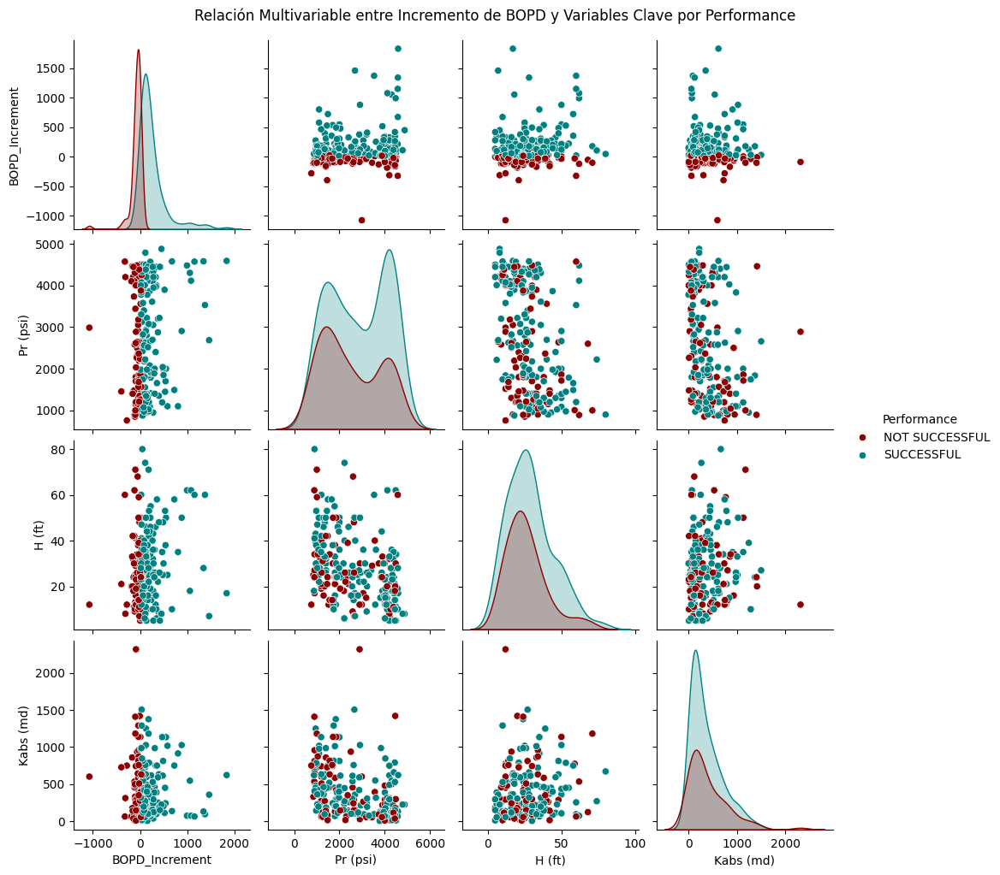

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Extraer el DataFrame de actividades desde el diccionario de datasets corregidos
historico_actividades = datasets_corrigidos["Historico de Actividades"]

# Asegurar que los valores en 'Performance' sean consistentes
historico_actividades['Performance'] = historico_actividades['Performance'].str.strip().str.upper()

# Calcular el incremento en BOPD para todas las actividades
historico_actividades['BOPD_Increment'] = historico_actividades['BOPD_After'] - historico_actividades['BOPD_Before']

# Definir el mapeo de colores corregido para Performance
performance_colors = {
    "SUCCESSFUL": "teal",
    "NOT SUCCESSFUL": "darkred"  # Rojo oscuro
}

# Resumen por arena y éxito/fracaso
arena_performance_summary = historico_actividades.groupby(['Sand', 'Performance'])['BOPD_Increment'].mean().reset_index()

# Visualización del incremento promedio por arena y éxito/fracaso con colores corregidos
plt.figure(figsize=(12, 6))
sns.barplot(
    data=arena_performance_summary,
    x='Sand',
    y='BOPD_Increment',
    hue='Performance',
    palette=performance_colors
)
plt.title("Incremento Promedio de BOPD por Arena y Performance")
plt.xlabel("Arena")
plt.ylabel("Incremento en BOPD")
plt.legend(title="Performance")
plt.show()

# Relación entre BOPD_Increment y otras variables con los colores corregidos
variables_to_plot = ['Pr (psi)', 'H (ft)', 'Kabs (md)']
for var in variables_to_plot:
    plt.figure(figsize=(10, 6))
    sns.scatterplot(
        data=historico_actividades,
        x=var,
        y='BOPD_Increment',
        hue='Performance',
        style='Sand',
        palette=performance_colors,
        alpha=0.7
    )
    plt.title(f"Relación entre Incremento en BOPD y {var} por Performance")
    plt.xlabel(var)
    plt.ylabel("Incremento en BOPD")
    plt.legend(title="Performance / Arena")
    plt.grid(True)
    plt.show()

# Relación multivariable usando Pairplot con colores corregidos
sns.pairplot(
    historico_actividades,
    vars=['BOPD_Increment', 'Pr (psi)', 'H (ft)', 'Kabs (md)'],
    hue='Performance',
    palette=performance_colors,
    diag_kind='kde',
    height=2.5
)
plt.suptitle("Relación Multivariable entre Incremento de BOPD y Variables Clave por Performance", y=1.02)
plt.show()


## Análisis del Gráfico Multivariable

## 1. Distribuciones univariadas (diagonal)

### **BOPD_Increment:**
- Hay una mayor densidad de incrementos cercanos a cero, lo que indica que muchas actividades tienen un impacto limitado en el incremento de producción.
- Las actividades exitosas (verde) tienden a generar incrementos positivos más grandes en comparación con las no exitosas (azul), aunque también hay casos con decrementos.

### **Pr (psi):**
- La presión parece estar distribuida en dos grupos principales, posiblemente por condiciones del reservorio o diferencias en las arenas.

### **H (ft) y Kabs (md):**
- La mayoría de los datos se concentran en valores bajos, pero hay una distribución más dispersa para actividades exitosas.

## 2. Relaciones bivariadas (gráficos fuera de la diagonal)

### **BOPD_Increment vs Pr (psi):**
- Se observa que un mayor incremento de producción (**BOPD_Increment**) tiende a asociarse con presiones iniciales más altas.
- Las actividades exitosas parecen estar más dispersas en la presión.

### **BOPD_Increment vs H (ft):**
- El incremento de **BOPD** parece ser más pronunciado para valores específicos de altura del reservorio (**H (ft)**), aunque no se ve una tendencia clara.

### **BOPD_Increment vs Kabs (md):**
- Los incrementos positivos de producción parecen estar más distribuidos para actividades con mayor permeabilidad (**Kabs (md)**), especialmente para actividades exitosas.

### **Relaciones entre otras variables (Pr (psi) vs Kabs (md)):**
- No se aprecia una relación fuerte entre estas variables, lo que sugiere que pueden ser independientes o que no tienen un efecto directo entre sí.

## 3. Impacto del Performance
- Las actividades **SUCCESSFUL** (verde) tienden a mostrar patrones más dispersos, lo que podría indicar mayor variabilidad en los resultados.
- Las actividades **NOT SUCCESSFUL** (rojo) parecen estar más agrupadas alrededor de valores específicos (presiones más bajas o permeabilidades más bajas), sugiriendo limitaciones en las condiciones iniciales que podrían afectar su éxito.


# **PROBLEMA DE CLASIFICACION**







# FEATURE SELECCTION

Activity Distribution
Activity
REPERF                121
MATRIX STIMULATION     83
ADD INTERVALS          31
PURE                   13
Name: count, dtype: int64


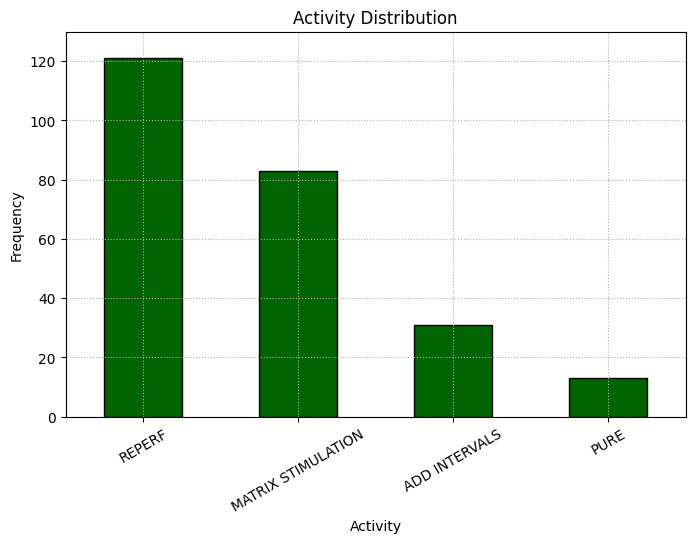


Ratio entre la clase mayoritaria y la clase minoritaria: 9.31

Porcentaje de ejemplos por clase:
Activity
REPERF                48.790323
MATRIX STIMULATION    33.467742
ADD INTERVALS         12.500000
PURE                   5.241935
Name: count, dtype: float64
Columnas categóricas: Index(['Sand', 'Wellbore', 'Zone', 'Performance'], dtype='object')


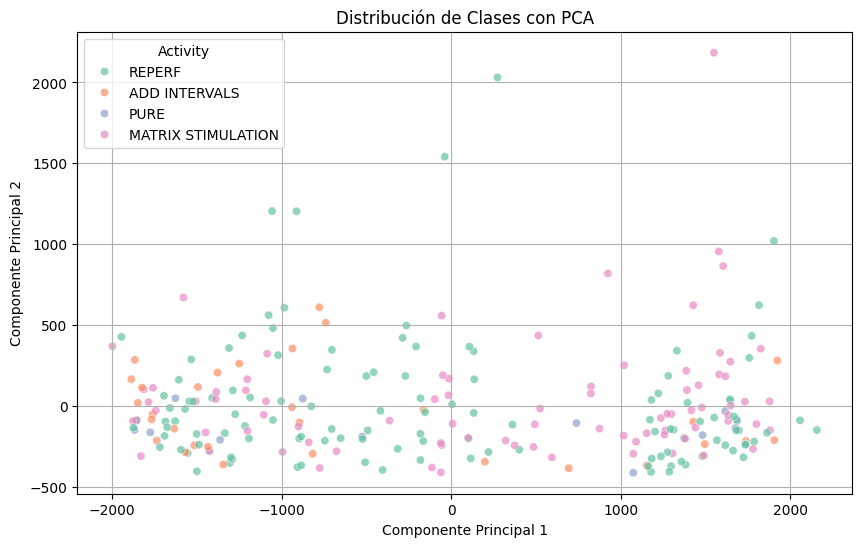

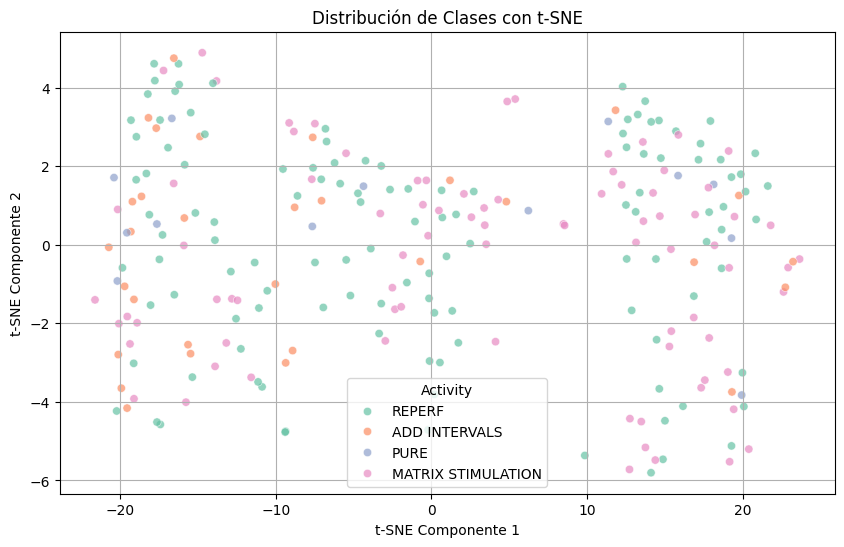

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import LabelEncoder

# Extraer el DataFrame de actividades desde el diccionario de datasets corregidos
historico_actividades = datasets_corrigidos["Historico de Actividades"]

# Evaluar el balance de clases
def evaluate_class_balance(y):
    # Verificar la distribución de clases
    class_counts = y.value_counts()

    print("Activity Distribution")
    print(class_counts)

    # Visualizar la distribución de clases
    plt.figure(figsize=(8, 5))
    class_counts.plot(kind='bar', color='darkgreen', edgecolor='black')
    plt.title("Activity Distribution")
    plt.xlabel("Activity")
    plt.ylabel("Frequency")
    plt.ylim(0, 130)  # Ajustar el límite del eje Y
    plt.xticks(rotation=30)
    plt.grid(True, linestyle="dotted", alpha=1.0)
    plt.show()

    # Calcular el ratio entre la clase mayoritaria y la clase minoritaria
    majority_class = class_counts.max()
    minority_class = class_counts.min()
    ratio = majority_class / minority_class
    print(f"\nRatio entre la clase mayoritaria y la clase minoritaria: {ratio:.2f}")

    # Calcular el porcentaje de cada clase
    class_percentage = class_counts / len(y) * 100
    print("\nPorcentaje de ejemplos por clase:")
    print(class_percentage)

# Preparar la variable objetivo (y)
y = historico_actividades['Activity']  # Variable objetivo

# Evaluar el balance de clases en la variable objetivo
evaluate_class_balance(y)

# Preparar los datos eliminando columnas irrelevantes
X = historico_actividades.drop(columns=['Well', 'WO', 'Date', 'Activity', 'BFPD_After', 'BOPD_After', 'BSW_After'])

# Revisar qué columnas no son numéricas
non_numeric_cols = X.select_dtypes(include=['object']).columns
print("Columnas categóricas:", non_numeric_cols)

# Aplicar Label Encoding a las columnas categóricas
for col in non_numeric_cols:
    le = LabelEncoder()
    X[col] = le.fit_transform(X[col].astype(str))

# Aplicar PCA para reducir la dimensionalidad a 2 componentes
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

# Convertir a DataFrame
pca_df = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
pca_df['Activity'] = y.values

# Visualizar PCA
plt.figure(figsize=(10, 6))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='Activity', palette='Set2', alpha=0.7)
plt.title("Distribución de Clases con PCA")
plt.xlabel("Componente Principal 1")
plt.ylabel("Componente Principal 2")
plt.legend(title="Activity")
plt.grid(True)
plt.show()

# Aplicar t-SNE para reducir la dimensionalidad a 2 componentes
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
X_tsne = tsne.fit_transform(X)

# Convertir a DataFrame
tsne_df = pd.DataFrame(X_tsne, columns=['TSNE1', 'TSNE2'])
tsne_df['Activity'] = y.values

# Visualizar t-SNE
plt.figure(figsize=(10, 6))
sns.scatterplot(data=tsne_df, x='TSNE1', y='TSNE2', hue='Activity', palette='Set2', alpha=0.7)
plt.title("Distribución de Clases con t-SNE")
plt.xlabel("t-SNE Componente 1")
plt.ylabel("t-SNE Componente 2")
plt.legend(title="Activity")
plt.grid(True)
plt.show()



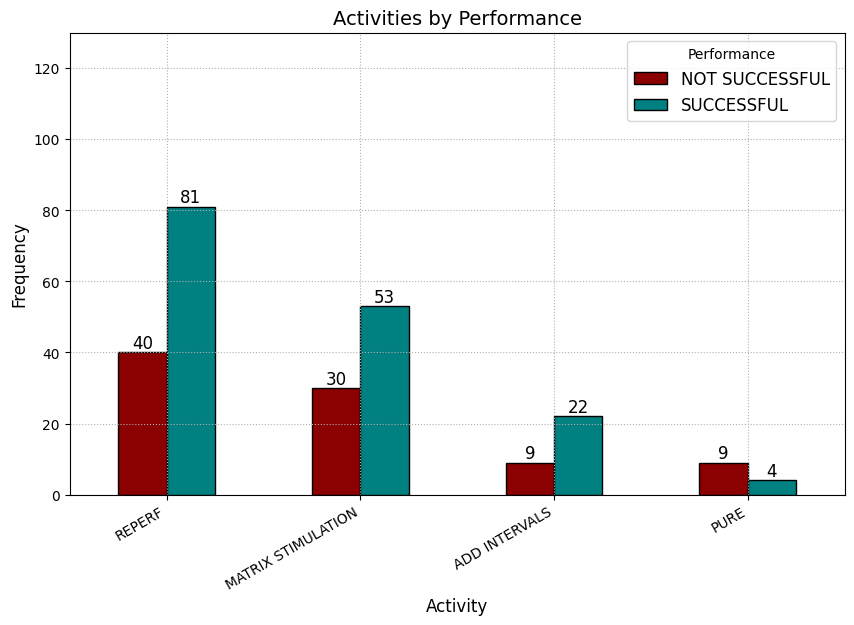

In [ ]:
# Extraer el DataFrame de actividades desde el diccionario de datasets corregidos
historico_actividades = datasets_corrigidos["Historico de Actividades"]

# Crear una tabla de frecuencia de actividades por rendimiento
activity_performance = historico_actividades.groupby(["Activity", "Performance"]).size().unstack(fill_value=0)

# Ordenar las actividades en el orden deseado
order = ["REPERF", "MATRIX STIMULATION", "ADD INTERVALS", "PURE"]
activity_performance = activity_performance.reindex(order)

# Definir colores para cada tipo de rendimiento
colors = ["darkred", "teal"]

# Crear la gráfica de barras
ax = activity_performance.plot(kind="bar", stacked=False, figsize=(10, 6), color=colors, edgecolor="black")

# Etiquetas y título
plt.title("Activities by Performance", fontsize=14)
plt.xlabel("Activity", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.xticks(rotation=30, ha="right")  # Rotar etiquetas para mejor visualización
plt.ylim(0, 130)  # Ajustar el límite del eje Y

# Agregar etiquetas en las barras
for container in ax.containers:
    ax.bar_label(container, fmt="%d", fontsize=12)

# Agregar leyenda
plt.legend(title="Performance", labels=["NOT SUCCESSFUL", "SUCCESSFUL"], fontsize=12)

# Mostrar el gráfico
plt.grid(True, linestyle="dotted", alpha=1.0)
plt.show()


Distribución de clases:
Activity
REPERF                121
MATRIX STIMULATION     83
ADD INTERVALS          31
PURE                   13
Name: count, dtype: int64


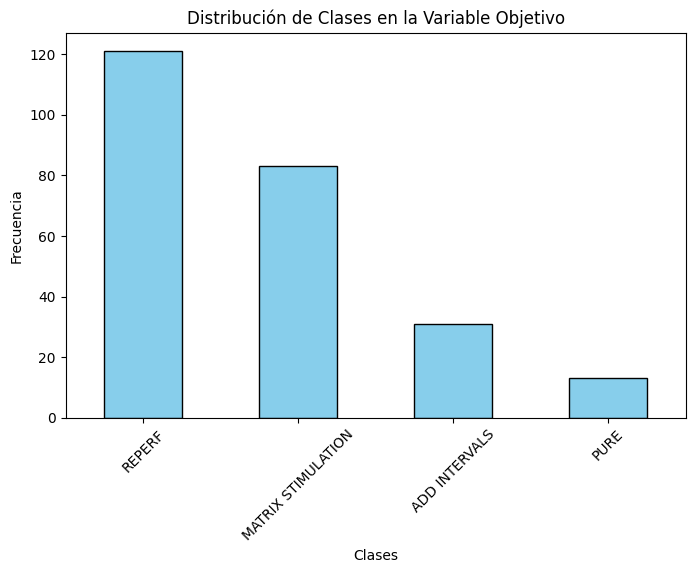


Ratio entre la clase mayoritaria y la clase minoritaria: 9.31

Porcentaje de ejemplos por clase:
Activity
REPERF                48.790323
MATRIX STIMULATION    33.467742
ADD INTERVALS         12.500000
PURE                   5.241935
Name: count, dtype: float64
Columnas categóricas: Index([], dtype='object')


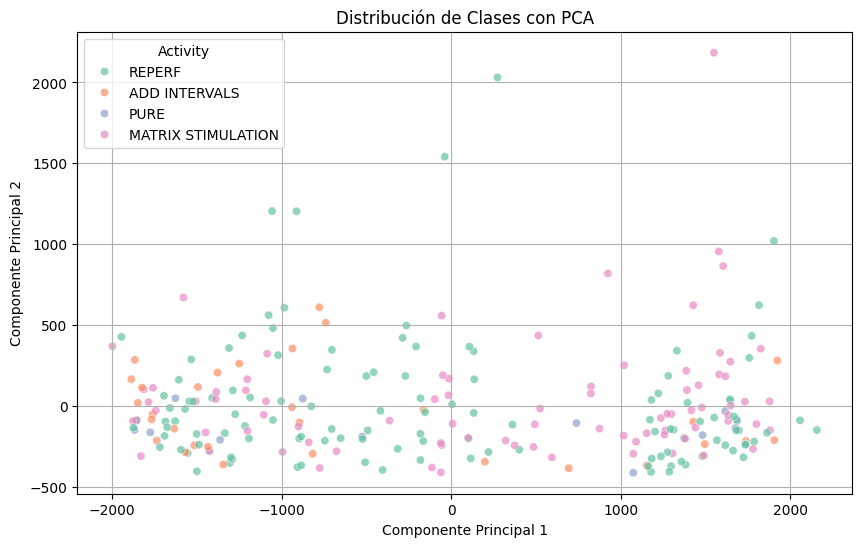

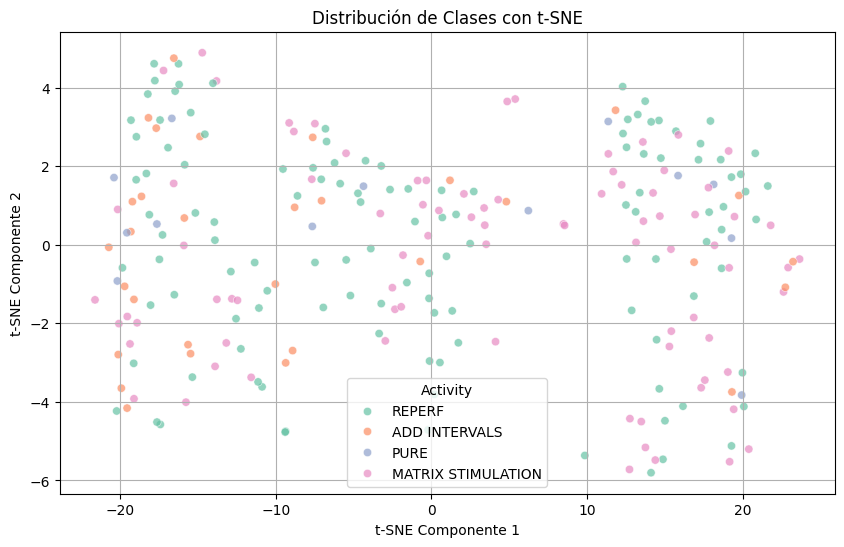

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import LabelEncoder

# Extraer el DataFrame de actividades desde el diccionario de datasets corregidos
historico_actividades = datasets_corrigidos["Historico de Actividades"]

# Evaluar el balance de clases
def evaluate_class_balance(y):
    # Verificar la distribución de clases
    class_counts = y.value_counts()

    print("Distribución de clases:")
    print(class_counts)

    # Visualizar la distribución de clases
    plt.figure(figsize=(8, 5))
    class_counts.plot(kind='bar', color='skyblue', edgecolor='black')
    plt.title("Distribución de Clases en la Variable Objetivo")
    plt.xlabel("Clases")
    plt.ylabel("Frecuencia")
    plt.xticks(rotation=45)
    plt.show()

    # Calcular el ratio entre la clase mayoritaria y la clase minoritaria
    majority_class = class_counts.max()
    minority_class = class_counts.min()
    ratio = majority_class / minority_class
    print(f"\nRatio entre la clase mayoritaria y la clase minoritaria: {ratio:.2f}")

    # Calcular el porcentaje de cada clase
    class_percentage = class_counts / len(y) * 100
    print("\nPorcentaje de ejemplos por clase:")
    print(class_percentage)

# Preparar la variable objetivo (y)
y = historico_actividades['Activity']  # Variable objetivo

# Evaluar el balance de clases en la variable objetivo
evaluate_class_balance(y)


# Revisar qué columnas no son numéricas
non_numeric_cols = X.select_dtypes(include=['object']).columns
print("Columnas categóricas:", non_numeric_cols)

# Aplicar Label Encoding a las columnas categóricas
for col in non_numeric_cols:
    le = LabelEncoder()
    X[col] = le.fit_transform(X[col].astype(str))

# Aplicar PCA para reducir la dimensionalidad a 2 componentes
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

# Convertir a DataFrame
pca_df = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
pca_df['Activity'] = y.values

# Visualizar PCA
plt.figure(figsize=(10, 6))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='Activity', palette='Set2', alpha=0.7)
plt.title("Distribución de Clases con PCA")
plt.xlabel("Componente Principal 1")
plt.ylabel("Componente Principal 2")
plt.legend(title="Activity")
plt.grid(True)
plt.show()

# Aplicar t-SNE para reducir la dimensionalidad a 2 componentes
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
X_tsne = tsne.fit_transform(X)

# Convertir a DataFrame
tsne_df = pd.DataFrame(X_tsne, columns=['TSNE1', 'TSNE2'])
tsne_df['Activity'] = y.values

# Visualizar t-SNE
plt.figure(figsize=(10, 6))
sns.scatterplot(data=tsne_df, x='TSNE1', y='TSNE2', hue='Activity', palette='Set2', alpha=0.7)
plt.title("Distribución de Clases con t-SNE")
plt.xlabel("t-SNE Componente 1")
plt.ylabel("t-SNE Componente 2")
plt.legend(title="Activity")
plt.grid(True)
plt.show()



Distribución de clases:
Performance
SUCCESSFUL        160
NOT SUCCESSFUL     88
Name: count, dtype: int64


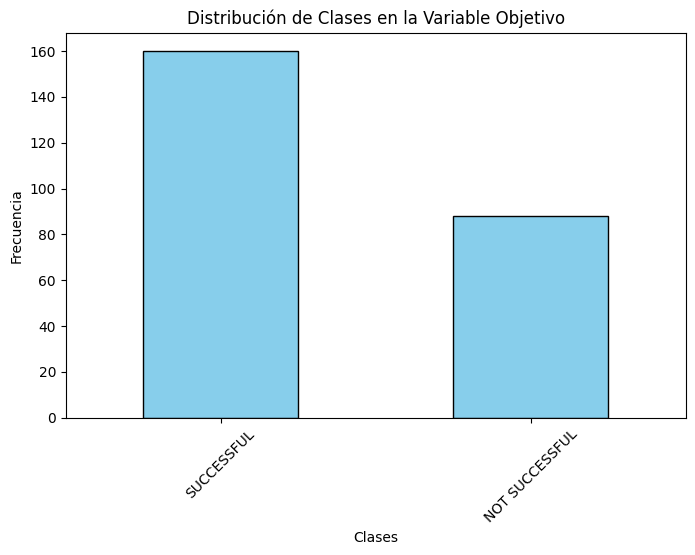


Ratio entre la clase mayoritaria y la clase minoritaria: 1.82

Porcentaje de ejemplos por clase:
Performance
SUCCESSFUL        64.516129
NOT SUCCESSFUL    35.483871
Name: count, dtype: float64
Columnas categóricas: Index(['Sand', 'Wellbore', 'Zone', 'Activity'], dtype='object')


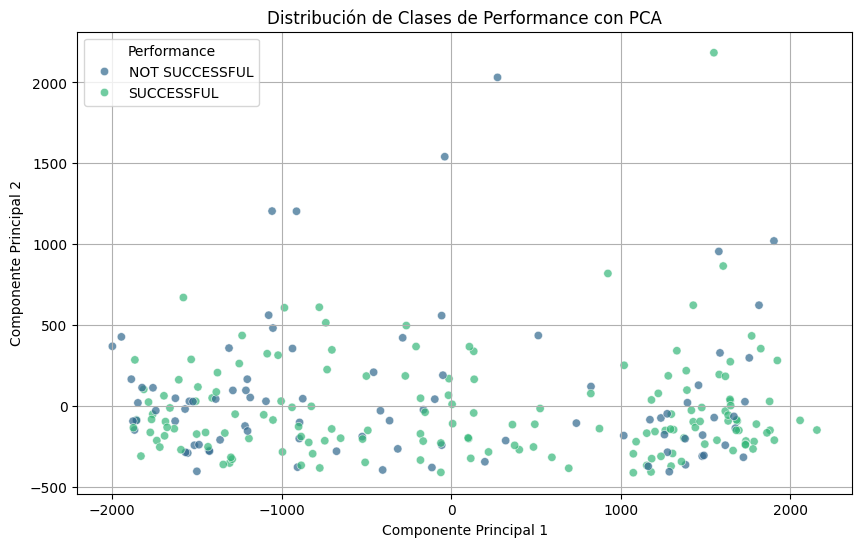

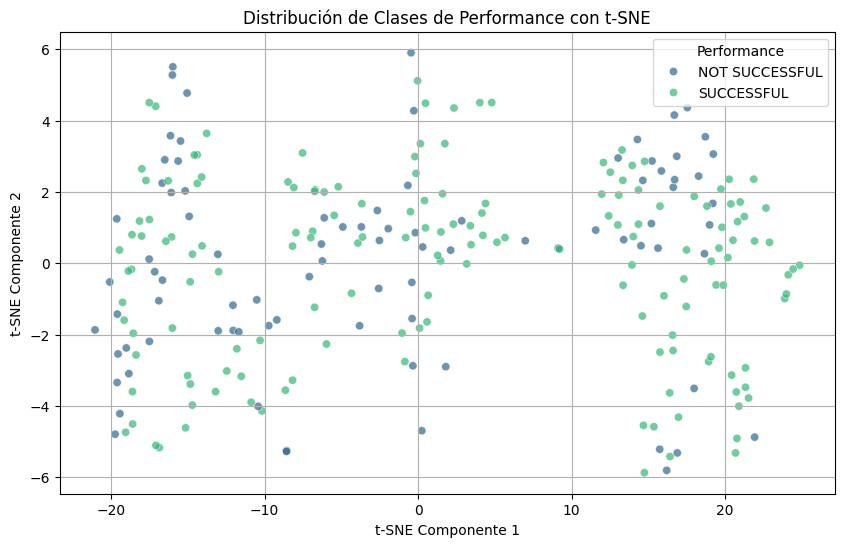

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import LabelEncoder

# Extraer el DataFrame de actividades desde el diccionario de datasets corregidos
historico_actividades = datasets_corrigidos["Historico de Actividades"]

# Evaluar el balance de clases
def evaluate_class_balance(y):
    # Verificar la distribución de clases
    class_counts = y.value_counts()

    print("Distribución de clases:")
    print(class_counts)

    # Visualizar la distribución de clases
    plt.figure(figsize=(8, 5))
    class_counts.plot(kind='bar', color='skyblue', edgecolor='black')
    plt.title("Distribución de Clases en la Variable Objetivo")
    plt.xlabel("Clases")
    plt.ylabel("Frecuencia")
    plt.xticks(rotation=45)
    plt.show()

    # Calcular el ratio entre la clase mayoritaria y la clase minoritaria
    majority_class = class_counts.max()
    minority_class = class_counts.min()
    ratio = majority_class / minority_class
    print(f"\nRatio entre la clase mayoritaria y la clase minoritaria: {ratio:.2f}")

    # Calcular el porcentaje de cada clase
    class_percentage = class_counts / len(y) * 100
    print("\nPorcentaje de ejemplos por clase:")
    print(class_percentage)

# Preparar la variable objetivo (y)
y = historico_actividades['Performance']  # Clasificación de éxito o no éxito

# Evaluar el balance de clases en la variable objetivo
evaluate_class_balance(y)

# Preparar los datos eliminando columnas irrelevantes
X = historico_actividades.drop(columns=['Well', 'WO', 'Date', 'Performance', 'BFPD_After', 'BOPD_After', 'BSW_After'])

# Revisar qué columnas no son numéricas
non_numeric_cols = X.select_dtypes(include=['object']).columns
print("Columnas categóricas:", non_numeric_cols)

# Aplicar Label Encoding a las columnas categóricas
for col in non_numeric_cols:
    le = LabelEncoder()
    X[col] = le.fit_transform(X[col].astype(str))

# Aplicar PCA para reducir la dimensionalidad a 2 componentes
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

# Convertir a DataFrame
pca_df = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
pca_df['Performance'] = y.values

# Visualizar PCA
plt.figure(figsize=(10, 6))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='Performance', palette='viridis', alpha=0.7)
plt.title("Distribución de Clases de Performance con PCA")
plt.xlabel("Componente Principal 1")
plt.ylabel("Componente Principal 2")
plt.legend(title="Performance")
plt.grid(True)
plt.show()

# Aplicar t-SNE para reducir la dimensionalidad a 2 componentes
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
X_tsne = tsne.fit_transform(X)

# Convertir a DataFrame
tsne_df = pd.DataFrame(X_tsne, columns=['TSNE1', 'TSNE2'])
tsne_df['Performance'] = y.values

# Visualizar t-SNE
plt.figure(figsize=(10, 6))
sns.scatterplot(data=tsne_df, x='TSNE1', y='TSNE2', hue='Performance', palette='viridis', alpha=0.7)
plt.title("Distribución de Clases de Performance con t-SNE")
plt.xlabel("t-SNE Componente 1")
plt.ylabel("t-SNE Componente 2")
plt.legend(title="Performance")
plt.grid(True)
plt.show()

# ***Sin rebalanceo*** de clases por tipo de actividad

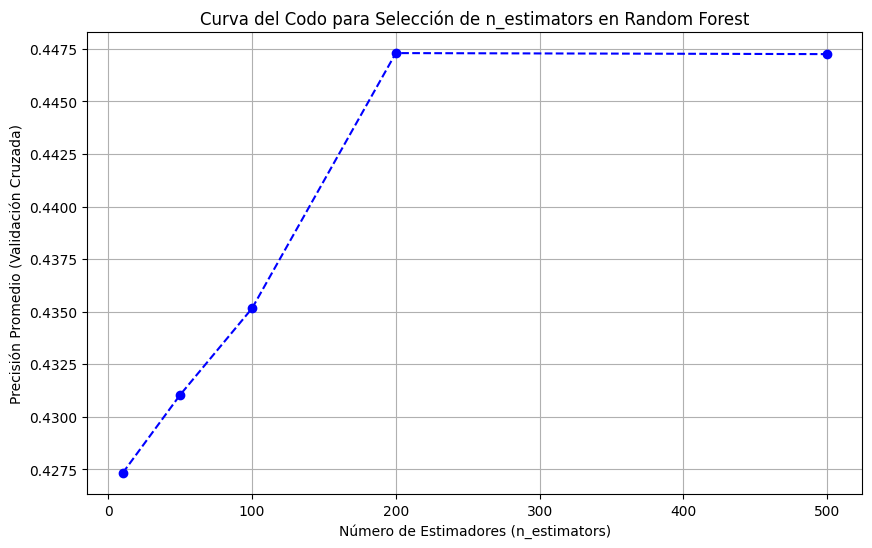

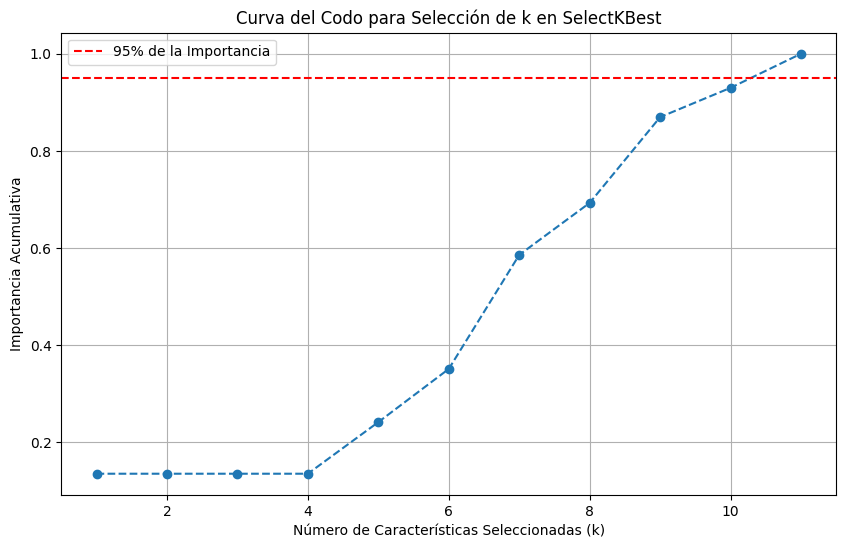

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectKBest, mutual_info_classif
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import LabelEncoder

# Extraer el DataFrame de actividades desde el diccionario de datasets corregidos
historico_actividades = datasets_corrigidos["Historico de Actividades"]

# Preparar los datos eliminando columnas irrelevantes
X = historico_actividades.drop(columns=['Well', 'WO', 'Date', 'Activity', 'BFPD_After', 'BOPD_After', 'BSW_After'])
y = historico_actividades['Activity']

# Identificar columnas categóricas
non_numeric_columns = X.select_dtypes(include=['object']).columns

# Aplicar LabelEncoder de manera consistente en todo el código
encoders = {}
for col in non_numeric_columns:
    encoders[col] = LabelEncoder()
    X[col] = encoders[col].fit_transform(X[col].astype(str))

# Asegurar que no haya valores nulos
X.fillna(0, inplace=True)

# Curva del Codo para Selección de n_estimators en Random Forest
n_estimators_range = [10, 50, 100, 200, 500]
cv_scores = []

for n in n_estimators_range:
    rf = RandomForestClassifier(n_estimators=n, random_state=42, n_jobs=-1)
    scores = cross_val_score(rf, X, y, cv=3, scoring='accuracy')
    cv_scores.append(scores.mean())

# Graficar la curva del codo para n_estimators
plt.figure(figsize=(10, 6))
plt.plot(n_estimators_range, cv_scores, marker='o', linestyle='--', color='blue')
plt.xlabel('Número de Estimadores (n_estimators)')
plt.ylabel('Precisión Promedio (Validación Cruzada)')
plt.title('Curva del Codo para Selección de n_estimators en Random Forest')
plt.grid(True)
plt.show()

# Evaluar la importancia de características con SelectKBest
selector = SelectKBest(score_func=mutual_info_classif, k=6)
selector.fit(X, y)

cumulative_importance = np.cumsum(selector.scores_) / np.sum(selector.scores_)

# Graficar la curva del codo para selección de k
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(cumulative_importance) + 1), cumulative_importance, marker='o', linestyle='--')
plt.xlabel('Número de Características Seleccionadas (k)')
plt.ylabel('Importancia Acumulativa')
plt.title('Curva del Codo para Selección de k en SelectKBest')
plt.axhline(y=0.95, color='r', linestyle='--', label='95% de la Importancia')
plt.legend()
plt.grid(True)
plt.show()




###comentarios tutor

revisar si se esta aplicando el escalamiento , ya que el rango debe tener escalas comparables y que el algoritmo no haga una diferenciacion significativa

Para Random forest vamos a usar N= 200  y para Select Kbest vamos a usar K = 10

<ipython-input-17-a5e2e3f99179>:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance', y='Feature', data=rf_feature_importances, ax=axes[0], palette="viridis")
<ipython-input-17-a5e2e3f99179>:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance', y='Feature', data=kbest_feature_importances, ax=axes[1], palette="magma")


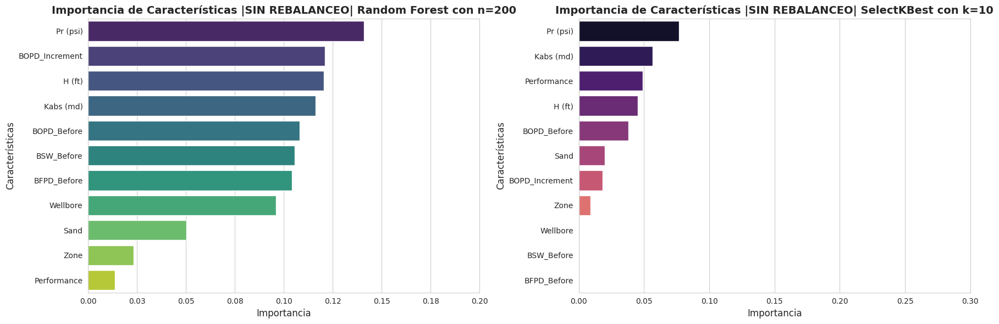

In [ ]:

# Evaluar la importancia de características con Random Forest
rf = RandomForestClassifier(n_estimators=200, random_state=42)
rf.fit(X, y)

rf_feature_importances = pd.DataFrame({
    'Feature': X.columns,
    'Importance': rf.feature_importances_
}).sort_values(by='Importance', ascending=False)

# Evaluar la importancia de características con SelectKBest
selector = SelectKBest(score_func=mutual_info_classif, k=10)
selector.fit(X, y)

kbest_feature_importances = pd.DataFrame({
    'Feature': X.columns,
    'Importance': selector.scores_
}).sort_values(by='Importance', ascending=False).reset_index(drop=True)


# Configuración del estilo de los gráficos
sns.set_style("whitegrid")

# Crear la figura y los subgráficos
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Gráfico de Importancia de Características - Random Forest
sns.barplot(x='Importance', y='Feature', data=rf_feature_importances, ax=axes[0], palette="viridis")
axes[0].set_title("Importancia de Características |SIN REBALANCEO| Random Forest con n=200", fontsize=14, fontweight='bold')
axes[0].set_xlabel("Importancia", fontsize=12)
axes[0].set_ylabel("Características", fontsize=12)
axes[0].tick_params(axis='both', labelsize=10)
axes[0].set_xlim(0, 0.20)  # Establecer el límite del eje x
axes[0].xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.2f}'))  # Formato con 2 decimales

# Gráfico de Importancia de Características - SelectKBest
sns.barplot(x='Importance', y='Feature', data=kbest_feature_importances, ax=axes[1], palette="magma")
axes[1].set_title("Importancia de Características |SIN REBALANCEO| SelectKBest con k=10", fontsize=14, fontweight='bold')
axes[1].set_xlabel("Importancia", fontsize=12)
axes[1].set_ylabel("Características", fontsize=12)
axes[1].tick_params(axis='both', labelsize=10)
axes[1].set_xlim(0, 0.30)  # Establecer el límite del eje x
axes[1].xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.2f}'))  # Formato con 2 decimales
# Ajustar el diseño para evitar superposiciones
plt.tight_layout()

# Mostrar los gráficos
plt.show()


# **Con rebalance**o de clases por tipo de actividad

### *SMOTE*

Distribución antes de SMOTE:
Activity
REPERF                121
MATRIX STIMULATION     83
ADD INTERVALS          31
PURE                   13
Name: count, dtype: int64

Distribución después de SMOTE:
Activity
REPERF                121
ADD INTERVALS         121
PURE                  121
MATRIX STIMULATION    121
Name: count, dtype: int64


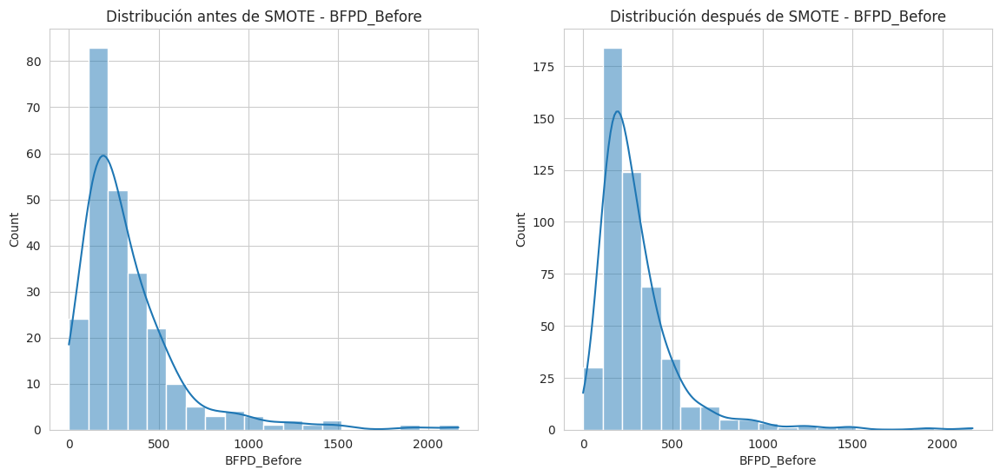

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectKBest, mutual_info_classif
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import LabelEncoder
from imblearn.over_sampling import SMOTE

# Cargar el dataset de histórico de actividades
historico_actividades = datasets_corrigidos["Historico de Actividades"]

# Preparar los datos eliminando columnas irrelevantes
X = historico_actividades.drop(columns=['Well', 'WO', 'Date', 'Activity', 'BFPD_After', 'BOPD_After', 'BSW_After'])
y = historico_actividades['Activity']

# Identificar columnas categóricas
non_numeric_columns = X.select_dtypes(include=['object']).columns

# Aplicar LabelEncoder de manera consistente en todo el código
encoders = {}
for col in non_numeric_columns:
    encoders[col] = LabelEncoder()
    X[col] = encoders[col].fit_transform(X[col].astype(str))

# Asegurar que no haya valores nulos
X.fillna(0, inplace=True)

# Aplicar SMOTE para rebalancear la variable objetivo 'Activity'
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

# Guardar los datos balanceados en un DataFrame
balanced_data_SMOTE = pd.DataFrame(X_resampled, columns=X.columns)
balanced_data_SMOTE['Activity'] = y_resampled

#OJO en como estoy generando el dato sintetico para el tema de sesgo. Revisar si existen valores duplicados o triplicados y a lo mejor no es la mas adecuada.
#No aplico en esta seccion las metricas de rendimiento sino despues

print("Distribución antes de SMOTE:")
print(y.value_counts())

print("\nDistribución después de SMOTE:")
print(pd.Series(y_resampled).value_counts())

feature = 'BFPD_Before'

# Crear gráficos antes y después de SMOTE
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

sns.histplot(X[feature], bins=20, kde=True, ax=axes[0])
axes[0].set_title(f'Distribución antes de SMOTE - {feature}')

sns.histplot(X_resampled[feature], bins=20, kde=True, ax=axes[1])
axes[1].set_title(f'Distribución después de SMOTE - {feature}')

plt.show()

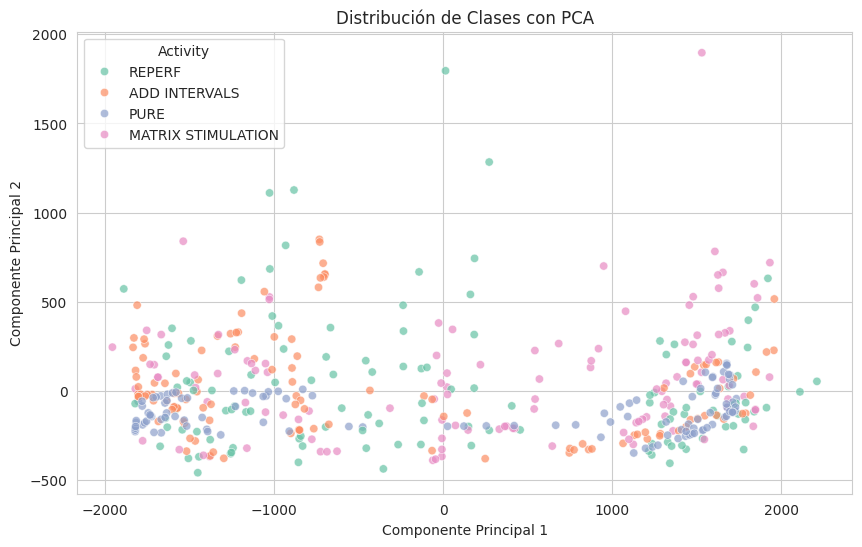

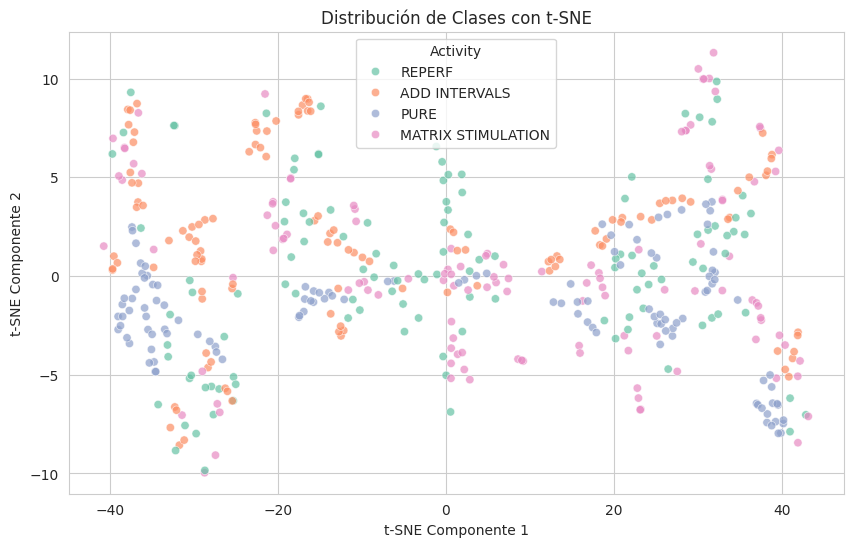

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# Aplicar PCA para reducir la dimensionalidad a 2 componentes
pca = PCA(n_components=2)
X_pca = pca.fit_transform(balanced_data_SMOTE.drop(columns=['Activity']))

# Convertir a DataFrame
pca_df = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
pca_df['Activity'] = balanced_data_SMOTE['Activity'].values

# Visualizar PCA
plt.figure(figsize=(10, 6))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='Activity', palette='Set2', alpha=0.7)
plt.title("Distribución de Clases con PCA")
plt.xlabel("Componente Principal 1")
plt.ylabel("Componente Principal 2")
plt.legend(title="Activity")
plt.grid(True)
plt.show()

# Aplicar t-SNE para reducir la dimensionalidad a 2 componentes
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
X_tsne = tsne.fit_transform(balanced_data_SMOTE.drop(columns=['Activity']))

# Convertir a DataFrame
tsne_df = pd.DataFrame(X_tsne, columns=['TSNE1', 'TSNE2'])
tsne_df['Activity'] = balanced_data_SMOTE['Activity'].values

# Visualizar t-SNE
plt.figure(figsize=(10, 6))
sns.scatterplot(data=tsne_df, x='TSNE1', y='TSNE2', hue='Activity', palette='Set2', alpha=0.7)
plt.title("Distribución de Clases con t-SNE")
plt.xlabel("t-SNE Componente 1")
plt.ylabel("t-SNE Componente 2")
plt.legend(title="Activity")
plt.grid(True)
plt.show()

##SMOTE +TOMELINK

Distribución antes de SMOTE + Tomek Links:
Activity
REPERF                121
MATRIX STIMULATION     83
ADD INTERVALS          31
PURE                   13
Name: count, dtype: int64

Distribución después de SMOTE + Tomek Links:
Activity
PURE                  119
ADD INTERVALS         116
REPERF                111
MATRIX STIMULATION    110
Name: count, dtype: int64


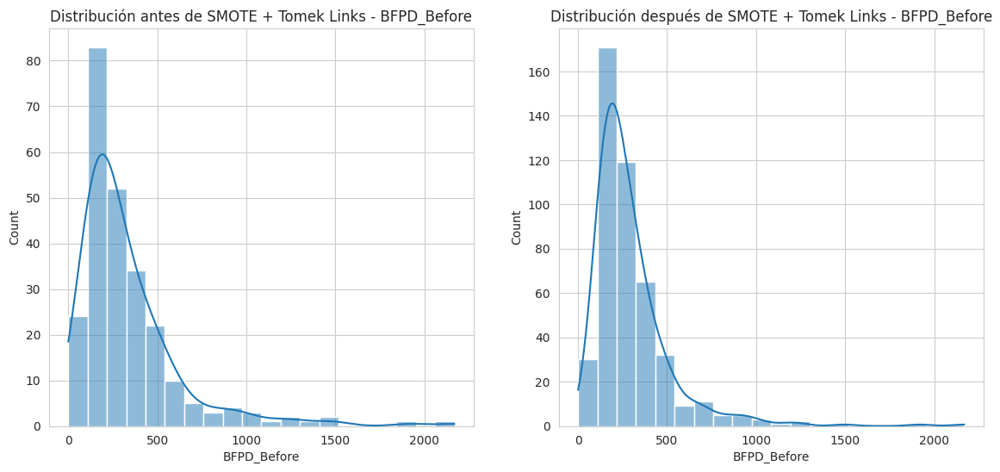

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectKBest, mutual_info_classif
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import LabelEncoder
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import TomekLinks
from imblearn.combine import SMOTETomek

# Cargar el dataset de histórico de actividades
historico_actividades = datasets_corrigidos["Historico de Actividades"]

# Preparar los datos eliminando columnas irrelevantes
X = historico_actividades.drop(columns=['Well', 'WO', 'Date', 'Activity', 'BFPD_After', 'BOPD_After', 'BSW_After'])
y = historico_actividades['Activity']

# Identificar columnas categóricas
non_numeric_columns = X.select_dtypes(include=['object']).columns

# Aplicar LabelEncoder de manera consistente en todo el código
encoders = {}
for col in non_numeric_columns:
    encoders[col] = LabelEncoder()
    X[col] = encoders[col].fit_transform(X[col].astype(str))

# Asegurar que no haya valores nulos
X.fillna(0, inplace=True)

# Aplicar SMOTE + Tomek Links para rebalancear la variable objetivo 'Activity'
smote_tomek = SMOTETomek(sampling_strategy='auto', random_state=42)
X_resampled, y_resampled = smote_tomek.fit_resample(X, y)

# Guardar los datos balanceados en un DataFrame
balanced_data_SMOTE_Tomek = pd.DataFrame(X_resampled, columns=X.columns)
balanced_data_SMOTE_Tomek['Activity'] = y_resampled

print("Distribución antes de SMOTE + Tomek Links:")
print(y.value_counts())

print("\nDistribución después de SMOTE + Tomek Links:")
print(pd.Series(y_resampled).value_counts())

feature = 'BFPD_Before'

# Crear gráficos antes y después de SMOTE + Tomek Links
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

sns.histplot(X[feature], bins=20, kde=True, ax=axes[0])
axes[0].set_title(f'Distribución antes de SMOTE + Tomek Links - {feature}')

sns.histplot(X_resampled[feature], bins=20, kde=True, ax=axes[1])
axes[1].set_title(f'Distribución después de SMOTE + Tomek Links - {feature}')

plt.show()


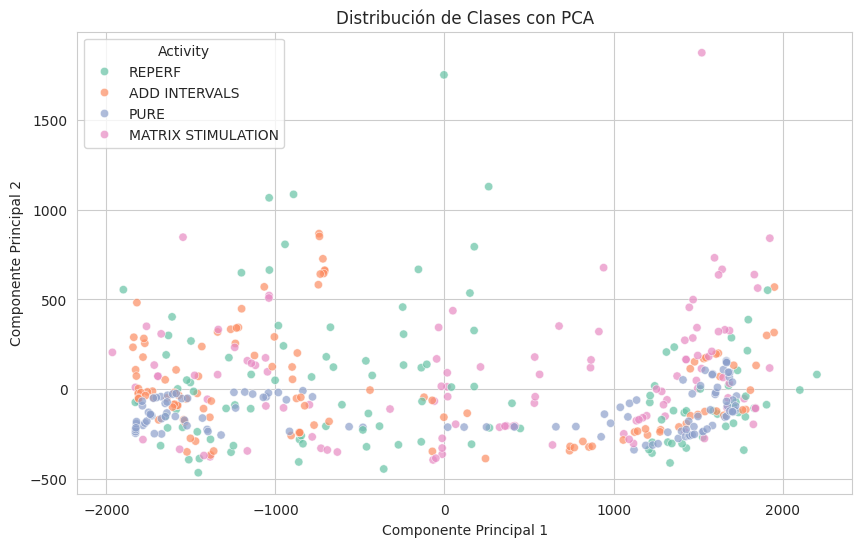

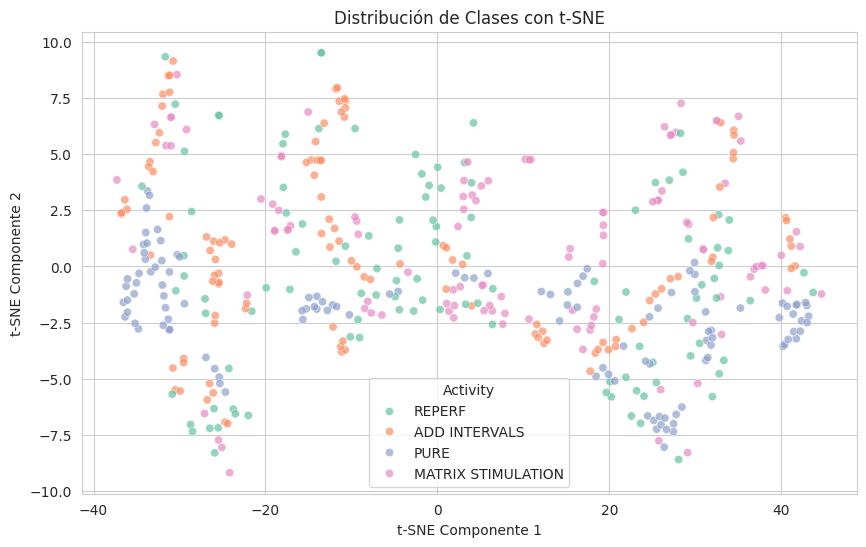

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# Aplicar PCA para reducir la dimensionalidad a 2 componentes
pca = PCA(n_components=2)
X_pca = pca.fit_transform(balanced_data_SMOTE_Tomek.drop(columns=['Activity']))

# Convertir a DataFrame
pca_df = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
pca_df['Activity'] = balanced_data_SMOTE_Tomek['Activity'].values

# Visualizar PCA
plt.figure(figsize=(10, 6))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='Activity', palette='Set2', alpha=0.7)
plt.title("Distribución de Clases con PCA")
plt.xlabel("Componente Principal 1")
plt.ylabel("Componente Principal 2")
plt.legend(title="Activity")
plt.grid(True)
plt.show()

# Aplicar t-SNE para reducir la dimensionalidad a 2 componentes
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
X_tsne = tsne.fit_transform(balanced_data_SMOTE_Tomek.drop(columns=['Activity']))

# Convertir a DataFrame
tsne_df = pd.DataFrame(X_tsne, columns=['TSNE1', 'TSNE2'])
tsne_df['Activity'] = balanced_data_SMOTE_Tomek['Activity'].values

# Visualizar t-SNE
plt.figure(figsize=(10, 6))
sns.scatterplot(data=tsne_df, x='TSNE1', y='TSNE2', hue='Activity', palette='Set2', alpha=0.7)
plt.title("Distribución de Clases con t-SNE")
plt.xlabel("t-SNE Componente 1")
plt.ylabel("t-SNE Componente 2")
plt.legend(title="Activity")
plt.grid(True)
plt.show()

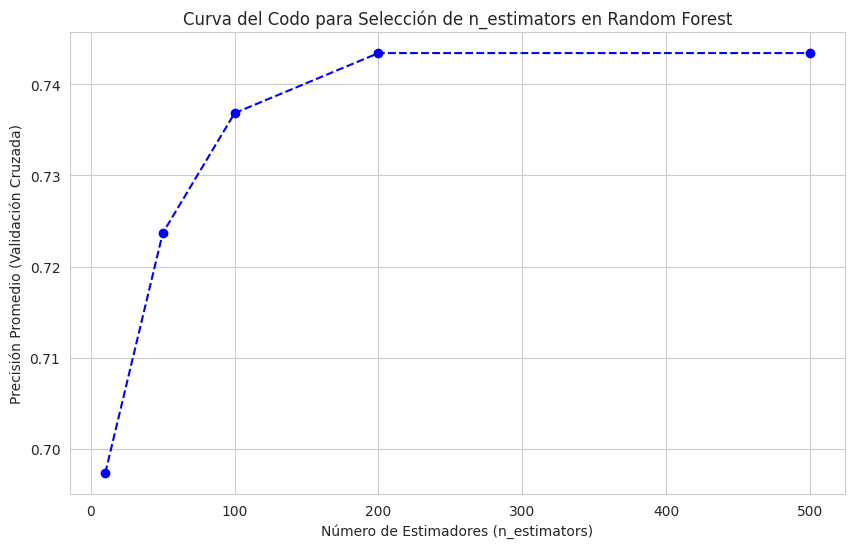

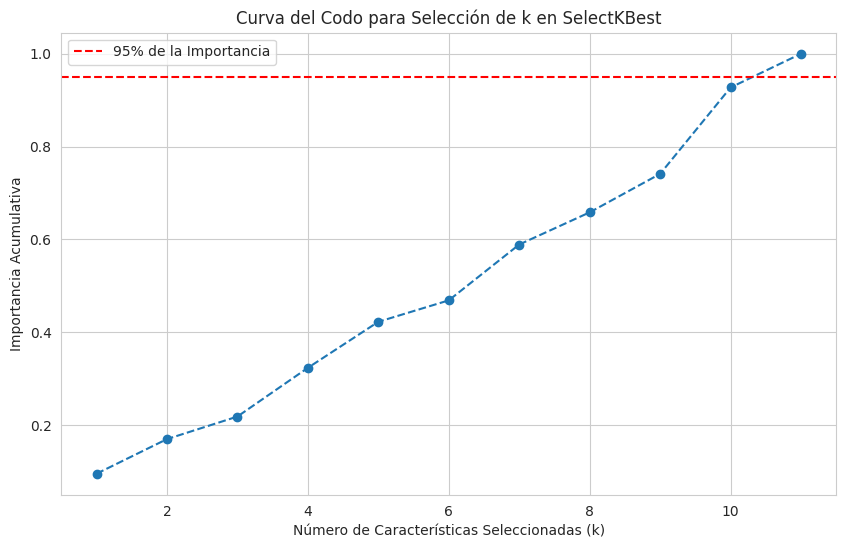

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectKBest, mutual_info_classif
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import LabelEncoder

# Utilizar el DataFrame actualizado con ADASYN
X = balanced_data_SMOTE_Tomek.drop(columns=['Activity'])
y = balanced_data_SMOTE_Tomek['Activity']

# Curva del Codo para Selección de n_estimators en Random Forest
n_estimators_range = [10, 50, 100, 200, 500]
cv_scores = []

for n in n_estimators_range:
    rf = RandomForestClassifier(n_estimators=n, random_state=42, n_jobs=-1)
    scores = cross_val_score(rf, X, y, cv=3, scoring='accuracy')
    cv_scores.append(scores.mean())

# Graficar la curva del codo para n_estimators
plt.figure(figsize=(10, 6))
plt.plot(n_estimators_range, cv_scores, marker='o', linestyle='--', color='blue')
plt.xlabel('Número de Estimadores (n_estimators)')
plt.ylabel('Precisión Promedio (Validación Cruzada)')
plt.title('Curva del Codo para Selección de n_estimators en Random Forest')
plt.grid(True)
plt.show()

# Evaluar la importancia de características con SelectKBest
selector = SelectKBest(score_func=mutual_info_classif, k=6)
selector.fit(X, y)

cumulative_importance = np.cumsum(selector.scores_) / np.sum(selector.scores_)

# Graficar la curva del codo para selección de k
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(cumulative_importance) + 1), cumulative_importance, marker='o', linestyle='--')
plt.xlabel('Número de Características Seleccionadas (k)')
plt.ylabel('Importancia Acumulativa')
plt.title('Curva del Codo para Selección de k en SelectKBest')
plt.axhline(y=0.95, color='r', linestyle='--', label='95% de la Importancia')
plt.legend()
plt.grid(True)
plt.show()

<ipython-input-23-c88c39224405>:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance', y='Feature', data=rf_feature_importances, ax=axes[0], palette="viridis")
<ipython-input-23-c88c39224405>:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance', y='Feature', data=kbest_feature_importances, ax=axes[1], palette="magma")


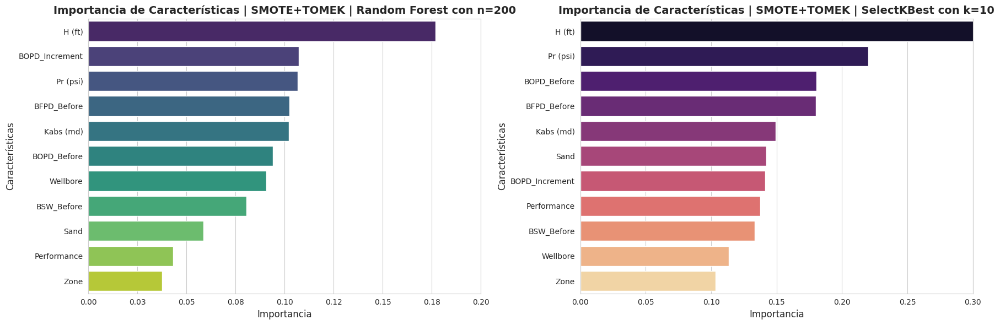

In [ ]:
# Evaluar la importancia de características con Random Forest
rf = RandomForestClassifier(n_estimators=200, random_state=42)

rf.fit(balanced_data_SMOTE_Tomek.drop(columns=['Activity']), balanced_data_SMOTE_Tomek['Activity'])

rf_feature_importances = pd.DataFrame({
    'Feature': balanced_data_SMOTE_Tomek.drop(columns=['Activity']).columns,
    'Importance': rf.feature_importances_
}).sort_values(by='Importance', ascending=False)

# Evaluar la importancia de características con SelectKBest
selector = SelectKBest(score_func=mutual_info_classif, k=10)
selector.fit(balanced_data_SMOTE_Tomek.drop(columns=['Activity']), balanced_data_SMOTE_Tomek['Activity'])

kbest_feature_importances = pd.DataFrame({
    'Feature': balanced_data_SMOTE_Tomek.drop(columns=['Activity']).columns,
    'Importance': selector.scores_
}).sort_values(by='Importance', ascending=False).reset_index(drop=True)

# Configuración del estilo de los gráficos
sns.set_style("whitegrid")

# Crear la figura y los subgráficos
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Gráfico de Importancia de Características - Random Forest
sns.barplot(x='Importance', y='Feature', data=rf_feature_importances, ax=axes[0], palette="viridis")
axes[0].set_title("Importancia de Características | SMOTE+TOMEK | Random Forest con n=200", fontsize=14, fontweight='bold')
axes[0].set_xlabel("Importancia", fontsize=12)
axes[0].set_ylabel("Características", fontsize=12)
axes[0].tick_params(axis='both', labelsize=10)
axes[0].set_xlim(0, 0.20)  # Establecer el límite del eje x
axes[0].xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.2f}'))  # Formato con 2 decimales

# Gráfico de Importancia de Características - SelectKBest
sns.barplot(x='Importance', y='Feature', data=kbest_feature_importances, ax=axes[1], palette="magma")
axes[1].set_title("Importancia de Características | SMOTE+TOMEK | SelectKBest con k=10", fontsize=14, fontweight='bold')
axes[1].set_xlabel("Importancia", fontsize=12)
axes[1].set_ylabel("Características", fontsize=12)
axes[1].tick_params(axis='both', labelsize=10)
axes[1].set_xlim(0, 0.30)  # Establecer el límite del eje x
axes[1].xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.2f}'))  # Formato con 2 decimales

# Ajustar el diseño para evitar superposiciones
plt.tight_layout()

# Mostrar los gráficos
plt.show()

## *ADASYN*

Distribución antes de ADASYN:
Activity
REPERF                121
MATRIX STIMULATION     83
ADD INTERVALS          31
PURE                   13
Name: count, dtype: int64

Distribución después de ADASYN:
Activity
PURE                  124
REPERF                121
ADD INTERVALS         120
MATRIX STIMULATION    114
Name: count, dtype: int64


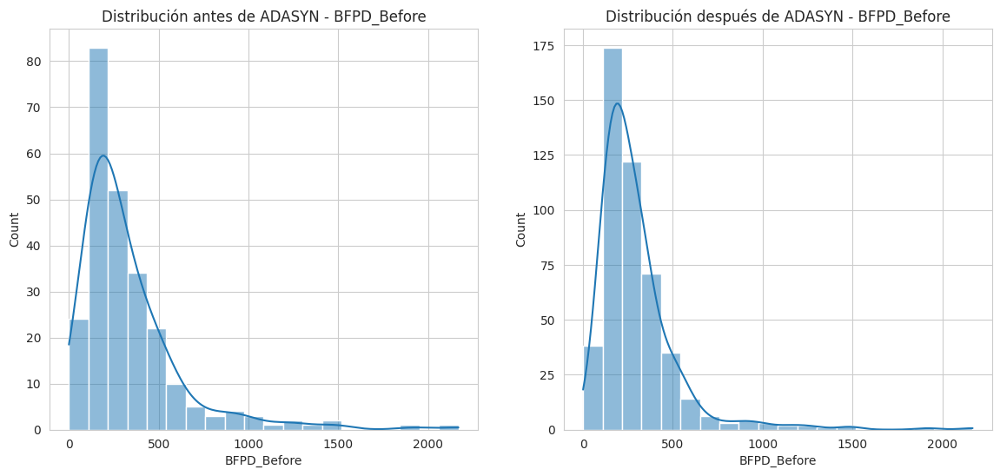

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectKBest, mutual_info_classif
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import LabelEncoder
from imblearn.over_sampling import ADASYN

# Cargar el dataset de histórico de actividades
historico_actividades = datasets_corrigidos["Historico de Actividades"]

# Preparar los datos eliminando columnas irrelevantes
X = historico_actividades.drop(columns=['Well', 'WO', 'Date', 'Activity', 'BFPD_After', 'BOPD_After', 'BSW_After'])
y = historico_actividades['Activity']

# Identificar columnas categóricas
non_numeric_columns = X.select_dtypes(include=['object']).columns

# Aplicar LabelEncoder de manera consistente en todo el código
encoders = {}
for col in non_numeric_columns:
    encoders[col] = LabelEncoder()
    X[col] = encoders[col].fit_transform(X[col].astype(str))

# Asegurar que no haya valores nulos
X.fillna(0, inplace=True)

# Aplicar ADASYN
adasyn = ADASYN(random_state=42)
X_resampled, y_resampled = adasyn.fit_resample(X, y)

# Guardar los datos balanceados en un DataFrame
balanced_data_ADASYN = pd.DataFrame(X_resampled, columns=X.columns)
balanced_data_ADASYN['Activity'] = y_resampled

print("Distribución antes de ADASYN:")
print(y.value_counts())

print("\nDistribución después de ADASYN:")
print(pd.Series(y_resampled).value_counts())

feature = 'BFPD_Before'

# Crear gráficos antes y después de ADASYN
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

sns.histplot(X[feature], bins=20, kde=True, ax=axes[0])
axes[0].set_title(f'Distribución antes de ADASYN - {feature}')

sns.histplot(X_resampled[feature], bins=20, kde=True, ax=axes[1])
axes[1].set_title(f'Distribución después de ADASYN - {feature}')

plt.show()


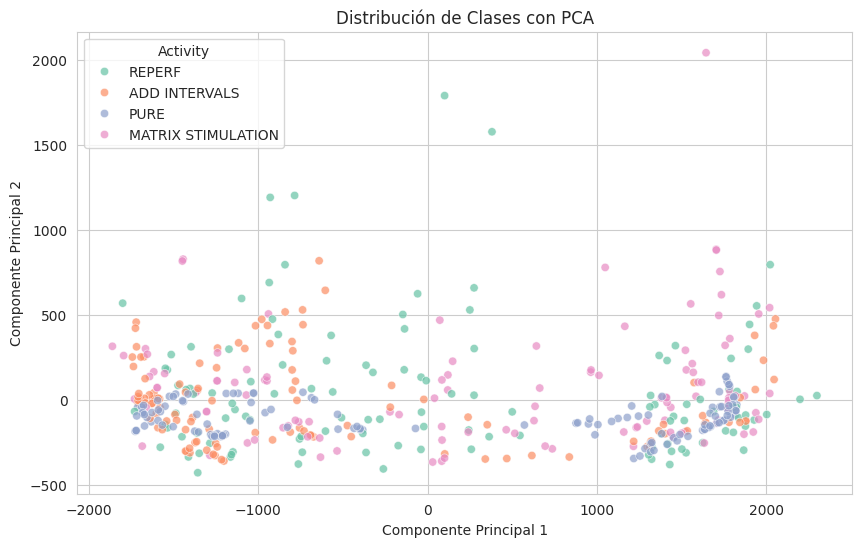

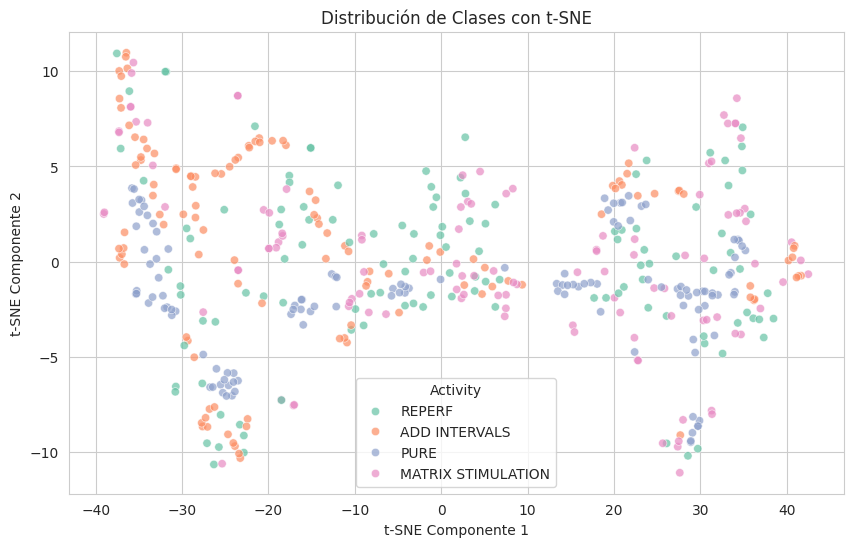

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# Aplicar PCA para reducir la dimensionalidad a 2 componentes
pca = PCA(n_components=2)
X_pca = pca.fit_transform(balanced_data_ADASYN.drop(columns=['Activity']))

# Convertir a DataFrame
pca_df = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
pca_df['Activity'] = balanced_data_ADASYN['Activity'].values

# Visualizar PCA
plt.figure(figsize=(10, 6))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='Activity', palette='Set2', alpha=0.7)
plt.title("Distribución de Clases con PCA")
plt.xlabel("Componente Principal 1")
plt.ylabel("Componente Principal 2")
plt.legend(title="Activity")
plt.grid(True)
plt.show()

# Aplicar t-SNE para reducir la dimensionalidad a 2 componentes
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
X_tsne = tsne.fit_transform(balanced_data_ADASYN.drop(columns=['Activity']))

# Convertir a DataFrame
tsne_df = pd.DataFrame(X_tsne, columns=['TSNE1', 'TSNE2'])
tsne_df['Activity'] = balanced_data_ADASYN['Activity'].values

# Visualizar t-SNE
plt.figure(figsize=(10, 6))
sns.scatterplot(data=tsne_df, x='TSNE1', y='TSNE2', hue='Activity', palette='Set2', alpha=0.7)
plt.title("Distribución de Clases con t-SNE")
plt.xlabel("t-SNE Componente 1")
plt.ylabel("t-SNE Componente 2")
plt.legend(title="Activity")
plt.grid(True)
plt.show()


*Diferencia Principal entre SMOTE y ADASYN*

*SMOTE* (Synthetic Minority Over-sampling Technique):

Genera nuevas muestras sintéticas distribuidas uniformemente a lo largo del espacio de las clases minoritarias.

No tiene en cuenta la distribución de la densidad de los datos minoritarios.
Puede generar datos redundantes, lo que puede causar sobreajuste en el modelo.

*ADASYN* (Adaptive Synthetic Sampling):

Similar a SMOTE, pero pone más énfasis en los ejemplos de la clase minoritaria que están más alejados de la clase mayoritaria.
Genera más muestras sintéticas en áreas donde la densidad de datos minoritarios es baja, permitiendo un balance más natural.
Reduce el riesgo de sobreajuste en comparación con SMOTE.



1.   Distribucion de Clases

  - SMOTE genera la misma cantidad de datos sintéticos para todas las clases minoritarias, lo que puede introducir datos redundantes y no reflejar correctamente la distribución natural.

  - ADASYN genera más datos sintéticos en las clases minoritarias que más lo necesitan, equilibrando de manera más inteligente el dataset.

2.   Distribucion de Datos Numericos (BFPD_Before)

  - La gráfica después de SMOTE muestra que los valores generados siguen una distribución similar a los datos originales, pero pueden estar más concentrados en ciertos valores específicos.

  - La gráfica después de ADASYN muestra una distribución más natural y dispersa, lo que indica que los datos generados están mejor distribuidos.

*ADASYN ES MEJOR POR LO SIGUIENTE:*

  - Menos sobreajuste:
    
    ADASYN no genera datos sintéticos de manera uniforme. Se enfoca en áreas con mayor necesidad de balance, reduciendo la posibilidad de crear ejemplos redundantes.

  - Mayor realismo en los datos:

    La distribución generada con ADASYN es más representativa de la realidad, mientras que SMOTE tiende a generar datos que pueden ser menos diversos.

  - Mejor rendimiento del modelo:
  
    Modelos entrenados con datos balanceados de manera más inteligente (como con ADASYN) tienden a generalizar mejor en datos nuevos.

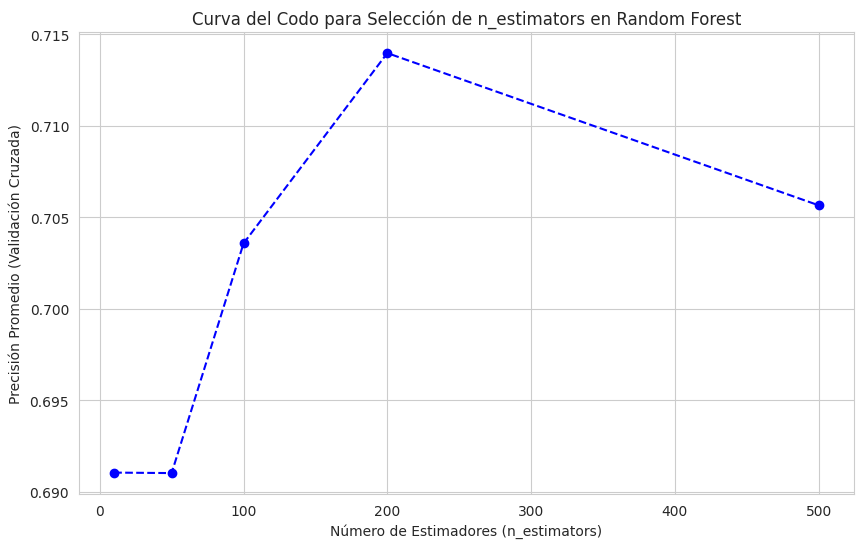

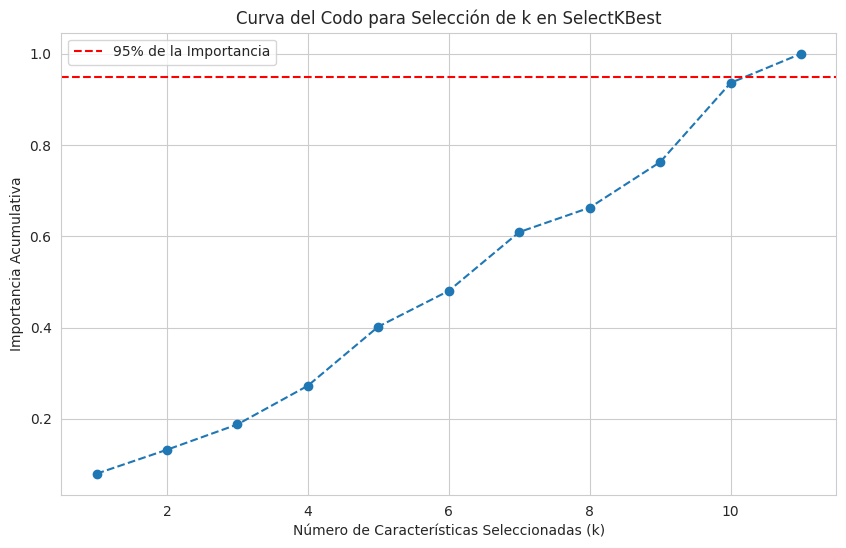

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectKBest, mutual_info_classif
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import LabelEncoder

# Utilizar el DataFrame actualizado con ADASYN
X = balanced_data_ADASYN.drop(columns=['Activity'])
y = balanced_data_ADASYN['Activity']

# Curva del Codo para Selección de n_estimators en Random Forest
n_estimators_range = [10, 50, 100, 200, 500]
cv_scores = []

for n in n_estimators_range:
    rf = RandomForestClassifier(n_estimators=n, random_state=42, n_jobs=-1)
    scores = cross_val_score(rf, X, y, cv=3, scoring='accuracy')
    cv_scores.append(scores.mean())

# Graficar la curva del codo para n_estimators
plt.figure(figsize=(10, 6))
plt.plot(n_estimators_range, cv_scores, marker='o', linestyle='--', color='blue')
plt.xlabel('Número de Estimadores (n_estimators)')
plt.ylabel('Precisión Promedio (Validación Cruzada)')
plt.title('Curva del Codo para Selección de n_estimators en Random Forest')
plt.grid(True)
plt.show()

# Evaluar la importancia de características con SelectKBest
selector = SelectKBest(score_func=mutual_info_classif, k=6)
selector.fit(X, y)

cumulative_importance = np.cumsum(selector.scores_) / np.sum(selector.scores_)

# Graficar la curva del codo para selección de k
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(cumulative_importance) + 1), cumulative_importance, marker='o', linestyle='--')
plt.xlabel('Número de Características Seleccionadas (k)')
plt.ylabel('Importancia Acumulativa')
plt.title('Curva del Codo para Selección de k en SelectKBest')
plt.axhline(y=0.95, color='r', linestyle='--', label='95% de la Importancia')
plt.legend()
plt.grid(True)
plt.show()

<ipython-input-27-e394c22fec8c>:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance', y='Feature', data=rf_feature_importances, ax=axes[0], palette="viridis")
<ipython-input-27-e394c22fec8c>:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance', y='Feature', data=kbest_feature_importances, ax=axes[1], palette="magma")


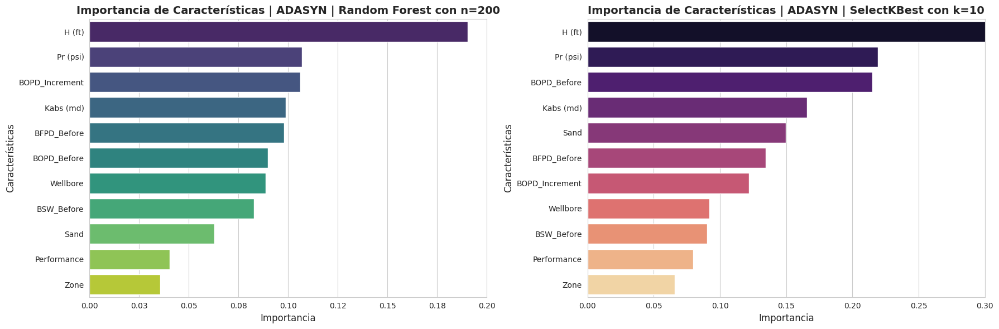

In [ ]:
# Evaluar la importancia de características con Random Forest
rf = RandomForestClassifier(n_estimators=200, random_state=42)

rf.fit(balanced_data_ADASYN.drop(columns=['Activity']), balanced_data_ADASYN['Activity'])

rf_feature_importances = pd.DataFrame({
    'Feature': balanced_data_ADASYN.drop(columns=['Activity']).columns,
    'Importance': rf.feature_importances_
}).sort_values(by='Importance', ascending=False)

# Evaluar la importancia de características con SelectKBest
selector = SelectKBest(score_func=mutual_info_classif, k=10)
selector.fit(balanced_data_ADASYN.drop(columns=['Activity']), balanced_data_ADASYN['Activity'])

kbest_feature_importances = pd.DataFrame({
    'Feature': balanced_data_ADASYN.drop(columns=['Activity']).columns,
    'Importance': selector.scores_
}).sort_values(by='Importance', ascending=False).reset_index(drop=True)

# Configuración del estilo de los gráficos
sns.set_style("whitegrid")

# Crear la figura y los subgráficos
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Gráfico de Importancia de Características - Random Forest
sns.barplot(x='Importance', y='Feature', data=rf_feature_importances, ax=axes[0], palette="viridis")
axes[0].set_title("Importancia de Características | ADASYN | Random Forest con n=200", fontsize=14, fontweight='bold')
axes[0].set_xlabel("Importancia", fontsize=12)
axes[0].set_ylabel("Características", fontsize=12)
axes[0].tick_params(axis='both', labelsize=10)
axes[0].set_xlim(0, 0.20)  # Establecer el límite del eje x
axes[0].xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.2f}'))  # Formato con 2 decimales

# Gráfico de Importancia de Características - SelectKBest
sns.barplot(x='Importance', y='Feature', data=kbest_feature_importances, ax=axes[1], palette="magma")
axes[1].set_title("Importancia de Características | ADASYN | SelectKBest con k=10", fontsize=14, fontweight='bold')
axes[1].set_xlabel("Importancia", fontsize=12)
axes[1].set_ylabel("Características", fontsize=12)
axes[1].tick_params(axis='both', labelsize=10)
axes[1].set_xlim(0, 0.30)  # Establecer el límite del eje x
axes[1].xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.2f}'))  # Formato con 2 decimales

# Ajustar el diseño para evitar superposiciones
plt.tight_layout()

# Mostrar los gráficos
plt.show()


## Comentarios

hacer una revision en la dimensiones
revisar los clusters despues de aplicar el ADASYN....

Representar graficamente como estan distribuidos en el espacio los datos TSNE y PCA....


revisar autogluon para clasificacion / buscar  

hacer un diccionario con todos los modelos y hacer fit.

los modelos lineales no funcionan

revisar si hay relaciones lineales entre variables para comprobar que no existe linealidad en los datos...

# MODELO DE CLASIFICACION | ADASYN

##KNeighborsClassifier | Feature Selection Random Forest








Reporte de Clasificación con Features del Random Forest
                    precision    recall  f1-score   support

     ADD INTERVALS       0.61      0.92      0.73        25
MATRIX STIMULATION       0.44      0.57      0.50        14
              PURE       0.71      0.86      0.78        29
            REPERF       0.40      0.07      0.12        28

          accuracy                           0.60        96
         macro avg       0.54      0.61      0.53        96
      weighted avg       0.55      0.60      0.53        96

Precisión del modelo Nearest Neighbors: 0.60


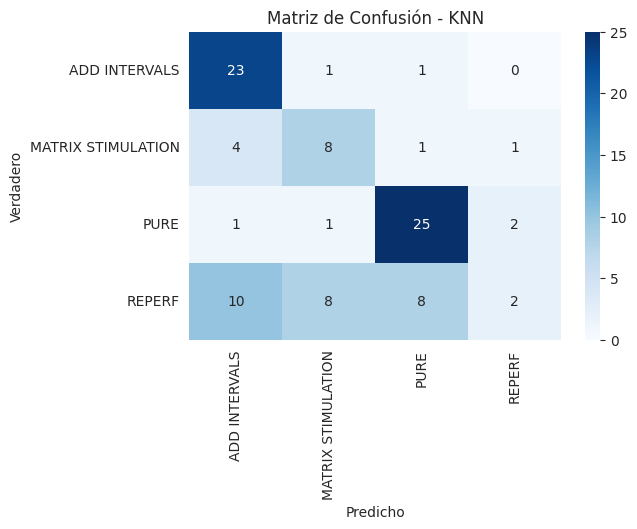

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

# Seleccionar las características más importantes
selected_features = ['H (ft)','Pr (psi)','BOPD_Increment','Kabs (md)', 'BFPD_Before','BOPD_Before']
X_selected =  balanced_data_ADASYN[selected_features]
y_selected =  balanced_data_ADASYN['Activity']

# División en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_selected, y_selected, test_size=0.2, random_state=42)

# Entrenar un modelo de clasificación Nearest Neighbors
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)

# Predicción en el conjunto de prueba
y_pred = knn.predict(X_test)

# Evaluación del modelo
print("Reporte de Clasificación con Features del Random Forest")
print(classification_report(y_test, y_pred))

# Mostrar la precisión del modelo
accuracy = accuracy_score(y_test, y_pred)
print(f"Precisión del modelo Nearest Neighbors: {accuracy:.2f}")

# Matriz de confusión
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=knn.classes_, yticklabels=knn.classes_)
plt.xlabel("Predicho")
plt.ylabel("Verdadero")
plt.title("Matriz de Confusión - KNN")
plt.show()



##KNeighborsClassifier | Feature Selection SelectKbest





Reporte de Clasificación: con Features del SelectKbest
                    precision    recall  f1-score   support

     ADD INTERVALS       0.48      0.64      0.55        25
MATRIX STIMULATION       0.30      0.50      0.38        14
              PURE       0.73      0.83      0.77        29
            REPERF       0.43      0.11      0.17        28

          accuracy                           0.52        96
         macro avg       0.49      0.52      0.47        96
      weighted avg       0.52      0.52      0.48        96

Precisión del modelo Nearest Neighbors: 0.52


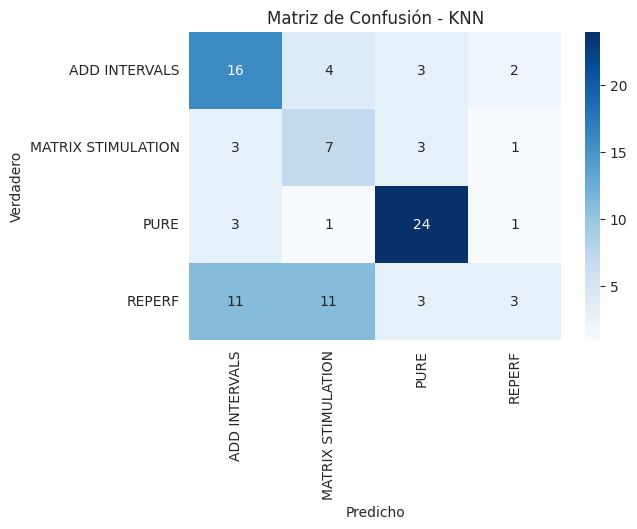

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

# Seleccionar las características más importantes
selected_features = ['H (ft)','BOPD_Before','Pr (psi)','Kabs (md)','BFPD_Before','Sand','BSW_Before']
X_selected =  balanced_data_ADASYN[selected_features]
y_selected =  balanced_data_ADASYN['Activity']

# División en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_selected, y_selected, test_size=0.2, random_state=42)

# Entrenar un modelo de clasificación Nearest Neighbors
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)

# Predicción en el conjunto de prueba
y_pred = knn.predict(X_test)

# Evaluación del modelo
print("Reporte de Clasificación: con Features del SelectKbest")
print(classification_report(y_test, y_pred))

# Mostrar la precisión del modelo
accuracy = accuracy_score(y_test, y_pred)
print(f"Precisión del modelo Nearest Neighbors: {accuracy:.2f}")

# Matriz de confusión
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=knn.classes_, yticklabels=knn.classes_)
plt.xlabel("Predicho")
plt.ylabel("Verdadero")
plt.title("Matriz de Confusión - KNN")
plt.show()


PURE se clasifica bien, pero REPERF y MATRIX STIMULATION tienen alta confusión.

La precisión global del modelo es baja (52%), lo que sugiere que KNN no es la mejor opción.

## RANDOM FOREST | Feature Selection Random Forest


Reporte de Clasificación:
                    precision    recall  f1-score   support

     ADD INTERVALS       0.86      0.72      0.78        25
MATRIX STIMULATION       0.50      0.64      0.56        14
              PURE       0.74      1.00      0.85        29
            REPERF       0.67      0.43      0.52        28

          accuracy                           0.71        96
         macro avg       0.69      0.70      0.68        96
      weighted avg       0.72      0.71      0.70        96

Precisión del modelo Random Forest: 0.71


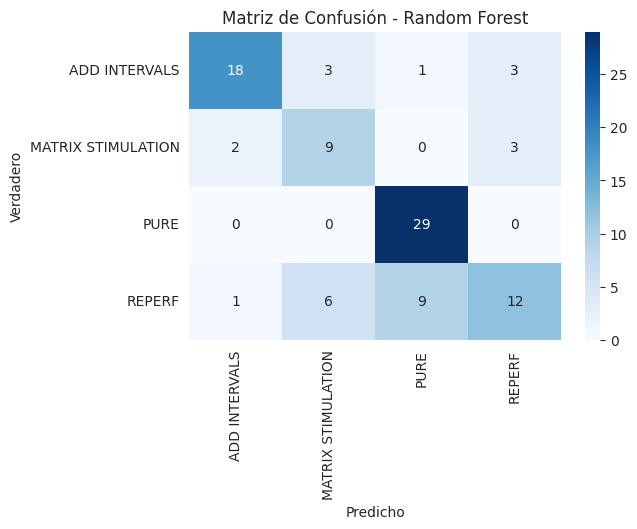

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

# Seleccionar las características más importantes basadas en Random Forest
selected_features = ['Pr (psi)', 'H (ft)', 'Kabs (md)', 'BOPD_Before', 'BFPD_Before', 'BSW_Before']
X_selected = balanced_data_ADASYN[selected_features]
y_selected = balanced_data_ADASYN['Activity']

# División en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_selected, y_selected, test_size=0.2, random_state=42)

# Entrenar un modelo de clasificación Random Forest
rf = RandomForestClassifier(n_estimators=200, random_state=42, n_jobs=-1)
rf.fit(X_train, y_train)

# Predicción en el conjunto de prueba
y_pred = rf.predict(X_test)

# Evaluación del modelo
print("Reporte de Clasificación:")
print(classification_report(y_test, y_pred))

# Mostrar la precisión del modelo
accuracy = accuracy_score(y_test, y_pred)
print(f"Precisión del modelo Random Forest: {accuracy:.2f}")

# Matriz de confusión
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=rf.classes_, yticklabels=rf.classes_)
plt.xlabel("Predicho")
plt.ylabel("Verdadero")
plt.title("Matriz de Confusión - Random Forest")
plt.show()


## RANDOM FOREST | Feature Selection SelectKbest


Reporte de Clasificación:
                    precision    recall  f1-score   support

     ADD INTERVALS       0.91      0.84      0.88        25
MATRIX STIMULATION       0.50      0.64      0.56        14
              PURE       0.83      1.00      0.91        29
            REPERF       0.70      0.50      0.58        28

          accuracy                           0.76        96
         macro avg       0.74      0.75      0.73        96
      weighted avg       0.77      0.76      0.75        96

Precisión del modelo Random Forest: 0.76


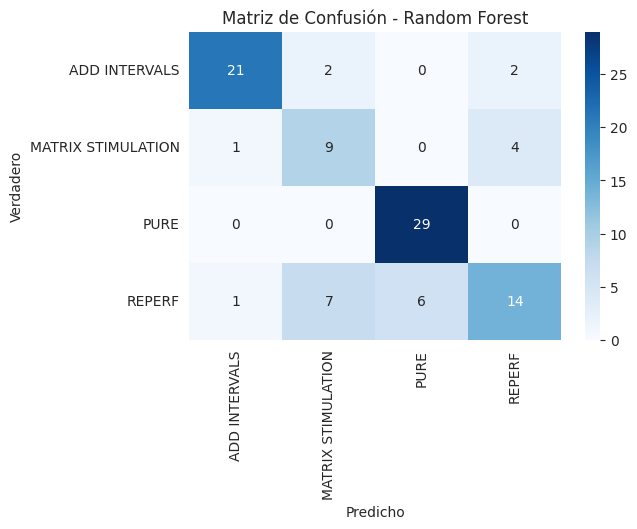

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

# Seleccionar las características más importantes basadas en Random Forest
selected_features = ['H (ft)','BOPD_Before','Pr (psi)','Kabs (md)','BFPD_Before','Sand','BSW_Before']
X_selected = balanced_data_ADASYN[selected_features]
y_selected = balanced_data_ADASYN['Activity']

# División en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_selected, y_selected, test_size=0.2, random_state=42)

# Entrenar un modelo de clasificación Random Forest
rf = RandomForestClassifier(n_estimators=200, random_state=42, n_jobs=-1)
rf.fit(X_train, y_train)

# Predicción en el conjunto de prueba
y_pred = rf.predict(X_test)

# Evaluación del modelo
print("Reporte de Clasificación:")
print(classification_report(y_test, y_pred))

# Mostrar la precisión del modelo
accuracy = accuracy_score(y_test, y_pred)
print(f"Precisión del modelo Random Forest: {accuracy:.2f}")

# Matriz de confusión
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=rf.classes_, yticklabels=rf.classes_)
plt.xlabel("Predicho")
plt.ylabel("Verdadero")
plt.title("Matriz de Confusión - Random Forest")
plt.show()

## XGBOOST | Feature Selection Random Forest


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [04:41:45] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Reporte de Clasificación:
                    precision    recall  f1-score   support

     ADD INTERVALS       0.77      0.68      0.72        25
MATRIX STIMULATION       0.43      0.64      0.51        14
              PURE       0.83      1.00      0.91        29
            REPERF       0.72      0.46      0.57        28

          accuracy                           0.71        96
         macro avg       0.69      0.70      0.68        96
      weighted avg       0.72      0.71      0.70        96

Precisión del modelo XGBoost: 0.71


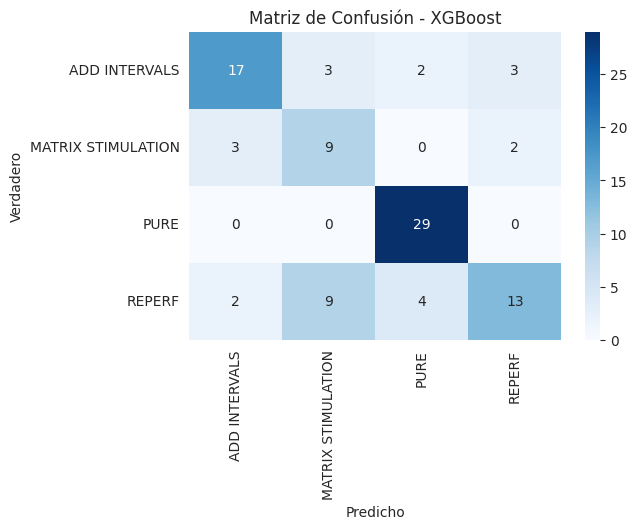

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from sklearn.preprocessing import LabelEncoder

# Seleccionar las características más importantes basadas en Random Forest
selected_features = ['Pr (psi)', 'H (ft)', 'Kabs (md)', 'BOPD_Before', 'BFPD_Before', 'BSW_Before']
X_selected = balanced_data_ADASYN[selected_features]
y_selected = balanced_data_ADASYN['Activity']

# Convertir las etiquetas a valores numéricos
label_encoder = LabelEncoder()
y_selected = label_encoder.fit_transform(y_selected)

# División en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_selected, y_selected, test_size=0.2, random_state=42)

# Entrenar un modelo de clasificación XGBoost
xgb = XGBClassifier(n_estimators=200, random_state=42, use_label_encoder=False, eval_metric='mlogloss')
xgb.fit(X_train, y_train)

# Predicción en el conjunto de prueba
y_pred = xgb.predict(X_test)

# Evaluación del modelo
print("Reporte de Clasificación:")
print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))

# Mostrar la precisión del modelo
accuracy = accuracy_score(y_test, y_pred)
print(f"Precisión del modelo XGBoost: {accuracy:.2f}")

# Matriz de confusión
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel("Predicho")
plt.ylabel("Verdadero")
plt.title("Matriz de Confusión - XGBoost")
plt.show()


## XGBOOST | Feature Selection SelectKBest

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [04:41:45] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Reporte de Clasificación:
                    precision    recall  f1-score   support

     ADD INTERVALS       0.81      0.84      0.82        25
MATRIX STIMULATION       0.56      0.71      0.62        14
              PURE       0.85      1.00      0.92        29
            REPERF       0.72      0.46      0.57        28

          accuracy                           0.76        96
         macro avg       0.73      0.75      0.73        96
      weighted avg       0.76      0.76      0.75        96

Precisión del modelo XGBoost: 0.76


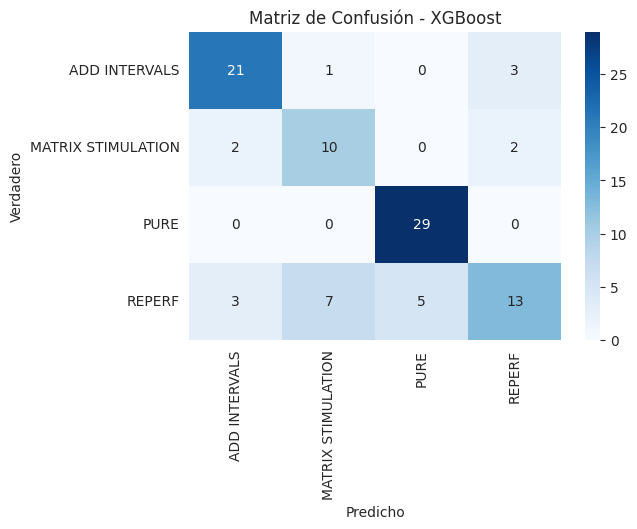

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from sklearn.preprocessing import LabelEncoder

# Seleccionar las características más importantes basadas en SelectKbest
selected_features = ['H (ft)','BOPD_Before','Pr (psi)','Kabs (md)','BFPD_Before','Sand','BSW_Before']
X_selected = balanced_data_ADASYN[selected_features]
y_selected = balanced_data_ADASYN['Activity']

# Convertir las etiquetas a valores numéricos
label_encoder = LabelEncoder()
y_selected = label_encoder.fit_transform(y_selected)

# División en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_selected, y_selected, test_size=0.2, random_state=42)

# Entrenar un modelo de clasificación XGBoost
xgb = XGBClassifier(n_estimators=200, random_state=42, use_label_encoder=False, eval_metric='mlogloss')
xgb.fit(X_train, y_train)

# Predicción en el conjunto de prueba
y_pred = xgb.predict(X_test)

# Evaluación del modelo
print("Reporte de Clasificación:")
print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))

# Mostrar la precisión del modelo
accuracy = accuracy_score(y_test, y_pred)
print(f"Precisión del modelo XGBoost: {accuracy:.2f}")

# Matriz de confusión
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel("Predicho")
plt.ylabel("Verdadero")
plt.title("Matriz de Confusión - XGBoost")
plt.show()

# MODELO DE CLASIFICACION | SMOTE + TOMELINK

##KNeighborsClassifier | Feature Selection Random Forest


Reporte de Clasificación con Features del Random Forest
                    precision    recall  f1-score   support

     ADD INTERVALS       0.56      0.86      0.68        21
MATRIX STIMULATION       0.29      0.36      0.32        14
              PURE       0.74      0.90      0.81        29
            REPERF       0.50      0.14      0.22        28

          accuracy                           0.58        92
         macro avg       0.52      0.56      0.51        92
      weighted avg       0.56      0.58      0.53        92

Precisión del modelo Nearest Neighbors: 0.58


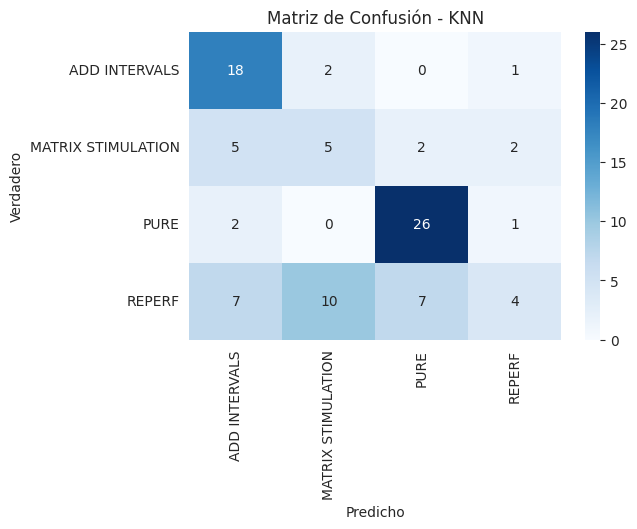

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

# Seleccionar las características más importantes
selected_features = ['H (ft)','Pr (psi)','BOPD_Increment','Kabs (md)', 'BFPD_Before','BOPD_Before']
X_selected =  balanced_data_SMOTE_Tomek[selected_features]
y_selected =  balanced_data_SMOTE_Tomek['Activity']

# División en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_selected, y_selected, test_size=0.2, random_state=42)

# Entrenar un modelo de clasificación Nearest Neighbors
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)

# Predicción en el conjunto de prueba
y_pred = knn.predict(X_test)

# Evaluación del modelo
print("Reporte de Clasificación con Features del Random Forest")
print(classification_report(y_test, y_pred))

# Mostrar la precisión del modelo
accuracy = accuracy_score(y_test, y_pred)
print(f"Precisión del modelo Nearest Neighbors: {accuracy:.2f}")

# Matriz de confusión
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=knn.classes_, yticklabels=knn.classes_)
plt.xlabel("Predicho")
plt.ylabel("Verdadero")
plt.title("Matriz de Confusión - KNN")
plt.show()


##KNeighborsClassifier | Feature Selection SelectKbest


Reporte de Clasificación: con Features del SelectKbest
                    precision    recall  f1-score   support

     ADD INTERVALS       0.44      0.71      0.55        21
MATRIX STIMULATION       0.37      0.50      0.42        14
              PURE       0.76      0.86      0.81        29
            REPERF       0.67      0.14      0.24        28

          accuracy                           0.55        92
         macro avg       0.56      0.55      0.50        92
      weighted avg       0.60      0.55      0.51        92

Precisión del modelo Nearest Neighbors: 0.55


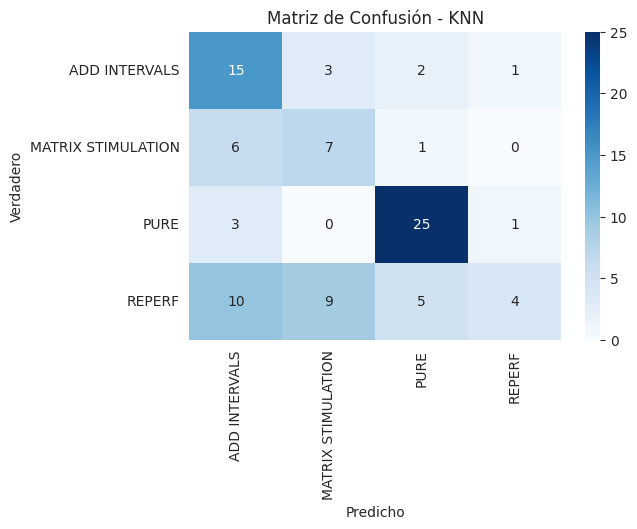

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

# Seleccionar las características más importantes
selected_features = ['H (ft)','BOPD_Before','Pr (psi)','Kabs (md)','BFPD_Before','Sand','BSW_Before']
X_selected =  balanced_data_SMOTE_Tomek[selected_features]
y_selected =  balanced_data_SMOTE_Tomek['Activity']

# División en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_selected, y_selected, test_size=0.2, random_state=42)

# Entrenar un modelo de clasificación Nearest Neighbors
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)

# Predicción en el conjunto de prueba
y_pred = knn.predict(X_test)

# Evaluación del modelo
print("Reporte de Clasificación: con Features del SelectKbest")
print(classification_report(y_test, y_pred))

# Mostrar la precisión del modelo
accuracy = accuracy_score(y_test, y_pred)
print(f"Precisión del modelo Nearest Neighbors: {accuracy:.2f}")

# Matriz de confusión
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=knn.classes_, yticklabels=knn.classes_)
plt.xlabel("Predicho")
plt.ylabel("Verdadero")
plt.title("Matriz de Confusión - KNN")
plt.show()

## RANDOM FOREST | Feature Selection Random Forest

Reporte de Clasificación:
                    precision    recall  f1-score   support

     ADD INTERVALS       0.78      0.86      0.82        21
MATRIX STIMULATION       0.53      0.57      0.55        14
              PURE       0.90      0.97      0.93        29
            REPERF       0.74      0.61      0.67        28

          accuracy                           0.77        92
         macro avg       0.74      0.75      0.74        92
      weighted avg       0.77      0.77      0.77        92

Precisión del modelo Random Forest: 0.77


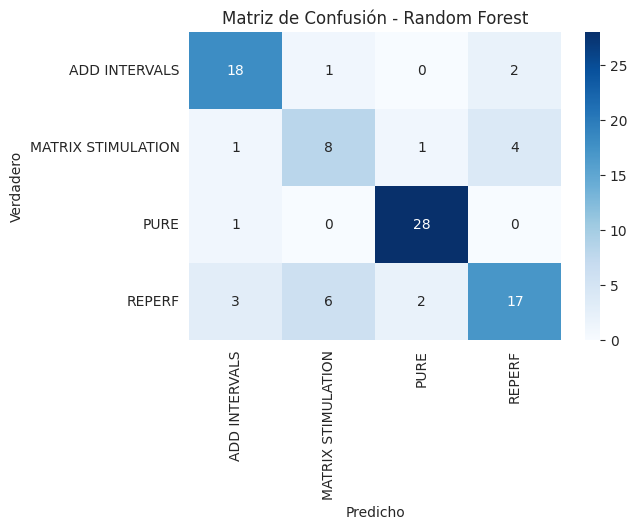

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

# Seleccionar las características más importantes basadas en Random Forest
selected_features = ['Pr (psi)', 'H (ft)', 'Kabs (md)', 'BOPD_Before', 'BFPD_Before', 'BSW_Before']
X_selected = balanced_data_SMOTE_Tomek[selected_features]
y_selected = balanced_data_SMOTE_Tomek['Activity']

# División en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_selected, y_selected, test_size=0.2, random_state=42)

# Entrenar un modelo de clasificación Random Forest
rf = RandomForestClassifier(n_estimators=200, random_state=42, n_jobs=-1)
rf.fit(X_train, y_train)

# Predicción en el conjunto de prueba
y_pred = rf.predict(X_test)

# Evaluación del modelo
print("Reporte de Clasificación:")
print(classification_report(y_test, y_pred))

# Mostrar la precisión del modelo
accuracy = accuracy_score(y_test, y_pred)
print(f"Precisión del modelo Random Forest: {accuracy:.2f}")

# Matriz de confusión
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=rf.classes_, yticklabels=rf.classes_)
plt.xlabel("Predicho")
plt.ylabel("Verdadero")
plt.title("Matriz de Confusión - Random Forest")
plt.show()

## RANDOM FOREST | Feature Selection SelectKbest


Reporte de Clasificación:
                    precision    recall  f1-score   support

     ADD INTERVALS       0.86      0.86      0.86        21
MATRIX STIMULATION       0.53      0.64      0.58        14
              PURE       0.91      1.00      0.95        29
            REPERF       0.77      0.61      0.68        28

          accuracy                           0.79        92
         macro avg       0.77      0.78      0.77        92
      weighted avg       0.80      0.79      0.79        92

Precisión del modelo Random Forest: 0.79


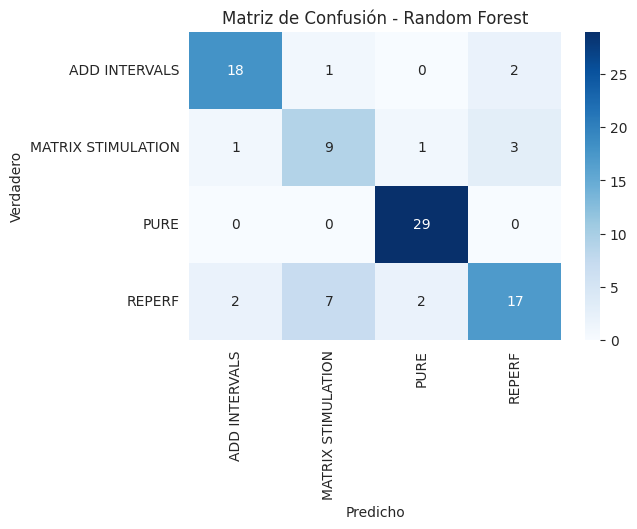

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

# Seleccionar las características más importantes basadas en Random Forest
selected_features = ['H (ft)','BOPD_Before','Pr (psi)','Kabs (md)','BFPD_Before','Sand','BSW_Before']
X_selected = balanced_data_SMOTE_Tomek[selected_features]
y_selected = balanced_data_SMOTE_Tomek['Activity']

# División en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_selected, y_selected, test_size=0.2, random_state=42)

# Entrenar un modelo de clasificación Random Forest
rf = RandomForestClassifier(n_estimators=200, random_state=42, n_jobs=-1)
rf.fit(X_train, y_train)

# Predicción en el conjunto de prueba
y_pred = rf.predict(X_test)

# Evaluación del modelo
print("Reporte de Clasificación:")
print(classification_report(y_test, y_pred))

# Mostrar la precisión del modelo
accuracy = accuracy_score(y_test, y_pred)
print(f"Precisión del modelo Random Forest: {accuracy:.2f}")

# Matriz de confusión
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=rf.classes_, yticklabels=rf.classes_)
plt.xlabel("Predicho")
plt.ylabel("Verdadero")
plt.title("Matriz de Confusión - Random Forest")
plt.show()

## XGBOOST | Feature Selection Random Forest


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [04:41:48] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Reporte de Clasificación:
                    precision    recall  f1-score   support

     ADD INTERVALS       0.84      0.76      0.80        21
MATRIX STIMULATION       0.42      0.57      0.48        14
              PURE       0.91      1.00      0.95        29
            REPERF       0.73      0.57      0.64        28

          accuracy                           0.75        92
         macro avg       0.72      0.73      0.72        92
      weighted avg       0.76      0.75      0.75        92

Precisión del modelo XGBoost: 0.75


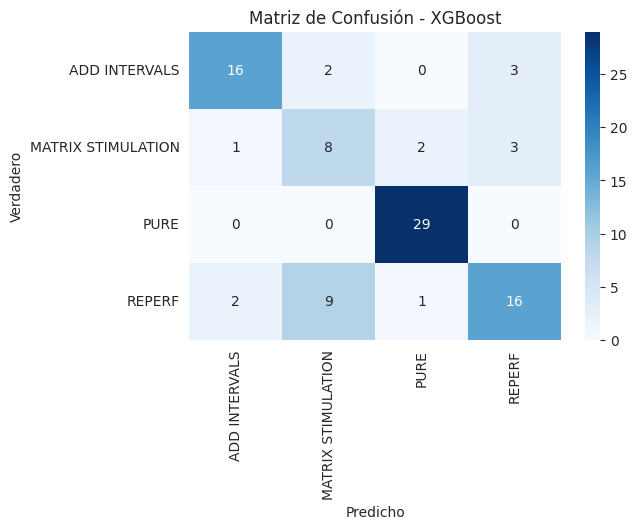

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from sklearn.preprocessing import LabelEncoder

# Seleccionar las características más importantes basadas en Random Forest
selected_features = ['Pr (psi)', 'H (ft)', 'Kabs (md)', 'BOPD_Before', 'BFPD_Before', 'BSW_Before']
X_selected = balanced_data_SMOTE_Tomek[selected_features]
y_selected = balanced_data_SMOTE_Tomek['Activity']

# Convertir las etiquetas a valores numéricos
label_encoder = LabelEncoder()
y_selected = label_encoder.fit_transform(y_selected)

# División en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_selected, y_selected, test_size=0.2, random_state=42)

# Entrenar un modelo de clasificación XGBoost
xgb = XGBClassifier(n_estimators=200, random_state=42, use_label_encoder=False, eval_metric='mlogloss')
xgb.fit(X_train, y_train)

# Predicción en el conjunto de prueba
y_pred = xgb.predict(X_test)

# Evaluación del modelo
print("Reporte de Clasificación:")
print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))

# Mostrar la precisión del modelo
accuracy = accuracy_score(y_test, y_pred)
print(f"Precisión del modelo XGBoost: {accuracy:.2f}")

# Matriz de confusión
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel("Predicho")
plt.ylabel("Verdadero")
plt.title("Matriz de Confusión - XGBoost")
plt.show()

## XGBOOST | Feature Selection SelectKBest

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [04:41:50] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Reporte de Clasificación:
                    precision    recall  f1-score   support

     ADD INTERVALS       0.90      0.86      0.88        21
MATRIX STIMULATION       0.44      0.57      0.50        14
              PURE       0.85      1.00      0.92        29
            REPERF       0.75      0.54      0.62        28

          accuracy                           0.76        92
         macro avg       0.74      0.74      0.73        92
      weighted avg       0.77      0.76      0.76        92

Precisión del modelo XGBoost: 0.76


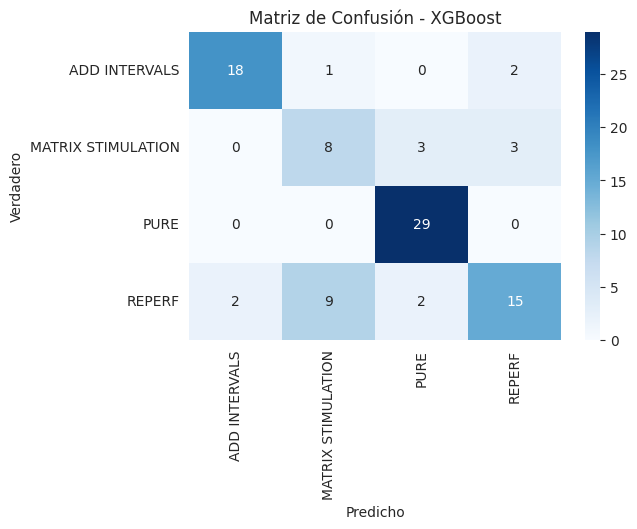

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from sklearn.preprocessing import LabelEncoder

# Seleccionar las características más importantes basadas en SelectKbest
selected_features = ['H (ft)','BOPD_Before','Pr (psi)','Kabs (md)','BFPD_Before','Sand','BSW_Before']
X_selected = balanced_data_SMOTE_Tomek[selected_features]
y_selected = balanced_data_SMOTE_Tomek['Activity']

# Convertir las etiquetas a valores numéricos
label_encoder = LabelEncoder()
y_selected = label_encoder.fit_transform(y_selected)

# División en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_selected, y_selected, test_size=0.2, random_state=42)

# Entrenar un modelo de clasificación XGBoost
xgb = XGBClassifier(n_estimators=200, random_state=42, use_label_encoder=False, eval_metric='mlogloss')
xgb.fit(X_train, y_train)

# Predicción en el conjunto de prueba
y_pred = xgb.predict(X_test)

# Evaluación del modelo
print("Reporte de Clasificación:")
print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))

# Mostrar la precisión del modelo
accuracy = accuracy_score(y_test, y_pred)
print(f"Precisión del modelo XGBoost: {accuracy:.2f}")

# Matriz de confusión
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel("Predicho")
plt.ylabel("Verdadero")
plt.title("Matriz de Confusión - XGBoost")
plt.show()

##MLP CLASIFIER | Feature Selection Random Forest

Reporte de Clasificación:
                    precision    recall  f1-score   support

     ADD INTERVALS       0.84      0.76      0.80        21
MATRIX STIMULATION       0.41      0.50      0.45        14
              PURE       0.96      0.93      0.95        29
            REPERF       0.68      0.68      0.68        28

          accuracy                           0.75        92
         macro avg       0.72      0.72      0.72        92
      weighted avg       0.77      0.75      0.76        92

Precisión del modelo MLPClassifier: 0.75


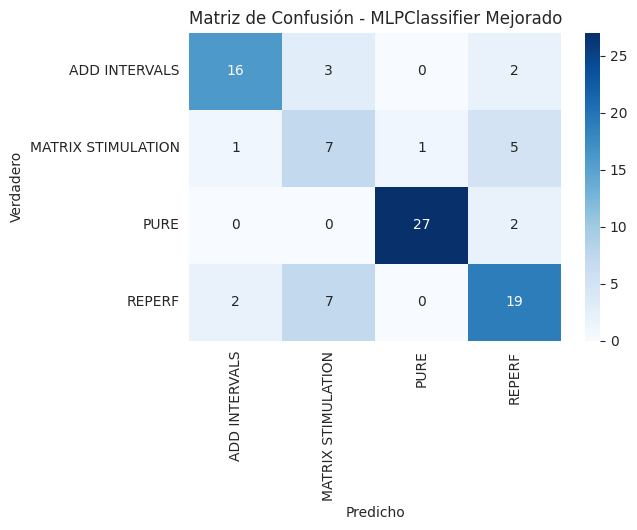

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from sklearn.preprocessing import LabelEncoder, StandardScaler  # <-- IMPORTACIÓN CORREGIDA

# Seleccionar las características más importantes basadas en Random Forest
selected_features = ['Pr (psi)', 'H (ft)', 'Kabs (md)', 'BOPD_Before', 'BFPD_Before', 'BSW_Before','Sand']
X_selected = balanced_data_SMOTE_Tomek[selected_features]
y_selected = balanced_data_SMOTE_Tomek['Activity']

# Convertir las etiquetas a valores numéricos
label_encoder = LabelEncoder()
y_selected = label_encoder.fit_transform(y_selected)

# Normalizar las características
scaler = StandardScaler()
X_selected = scaler.fit_transform(X_selected)

# División en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_selected, y_selected, test_size=0.2, random_state=42)

# Entrenar un modelo de clasificación con Redes Neuronales (MLPClassifier) mejorado
mlp = MLPClassifier(hidden_layer_sizes=(256, 128, 64, 32), activation='relu', solver='adam', alpha=0.0001,
                     learning_rate='adaptive', max_iter=1000, random_state=42, batch_size=32,
                     early_stopping=True, validation_fraction=0.1)
mlp.fit(X_train, y_train)

# Predicción en el conjunto de prueba
y_pred = mlp.predict(X_test)

# Evaluación del modelo
print("Reporte de Clasificación:")
print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))

# Mostrar la precisión del modelo
accuracy = accuracy_score(y_test, y_pred)
print(f"Precisión del modelo MLPClassifier: {accuracy:.2f}")

# Matriz de confusión
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel("Predicho")
plt.ylabel("Verdadero")
plt.title("Matriz de Confusión - MLPClassifier Mejorado")
plt.show()


##MLP CLASIFIER | Feature Selection SelectKbest


Reporte de Clasificación:
                    precision    recall  f1-score   support

     ADD INTERVALS       0.82      0.67      0.74        21
MATRIX STIMULATION       0.53      0.71      0.61        14
              PURE       0.78      1.00      0.88        29
            REPERF       0.68      0.46      0.55        28

          accuracy                           0.72        92
         macro avg       0.70      0.71      0.69        92
      weighted avg       0.72      0.72      0.71        92

Precisión del modelo MLPClassifier: 0.72


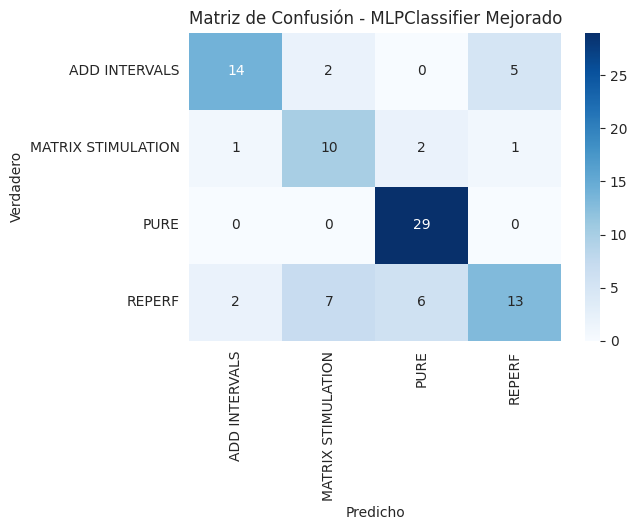

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from sklearn.preprocessing import LabelEncoder, StandardScaler  # <-- IMPORTACIÓN CORREGIDA

# Seleccionar las características más importantes basadas en SelectKBest
selected_features = ['H (ft)','BOPD_Before','Pr (psi)','Kabs (md)','BFPD_Before','Sand','BSW_Before']
X_selected = balanced_data_SMOTE_Tomek[selected_features]
y_selected = balanced_data_SMOTE_Tomek['Activity']

# Convertir las etiquetas a valores numéricos
label_encoder = LabelEncoder()
y_selected = label_encoder.fit_transform(y_selected)

# Normalizar las características
scaler = StandardScaler()
X_selected = scaler.fit_transform(X_selected)

# División en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_selected, y_selected, test_size=0.2, random_state=42)

# Entrenar un modelo de clasificación con Redes Neuronales (MLPClassifier) mejorado
mlp = MLPClassifier(hidden_layer_sizes=(256, 128, 64, 32), activation='relu', solver='adam', alpha=0.0001,
                     learning_rate='adaptive', max_iter=1000, random_state=42, batch_size=32,
                     early_stopping=True, validation_fraction=0.1)
mlp.fit(X_train, y_train)

# Predicción en el conjunto de prueba
y_pred = mlp.predict(X_test)

# Evaluación del modelo
print("Reporte de Clasificación:")
print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))

# Mostrar la precisión del modelo
accuracy = accuracy_score(y_test, y_pred)
print(f"Precisión del modelo MLPClassifier: {accuracy:.2f}")

# Matriz de confusión
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel("Predicho")
plt.ylabel("Verdadero")
plt.title("Matriz de Confusión - MLPClassifier Mejorado")
plt.show()


Reporte de Clasificación:
                    precision    recall  f1-score   support

     ADD INTERVALS       0.81      0.81      0.81        21
MATRIX STIMULATION       0.50      0.57      0.53        14
              PURE       0.90      0.97      0.93        29
            REPERF       0.75      0.64      0.69        28

          accuracy                           0.77        92
         macro avg       0.74      0.75      0.74        92
      weighted avg       0.77      0.77      0.77        92

Precisión del modelo MLPClassifier: 0.77


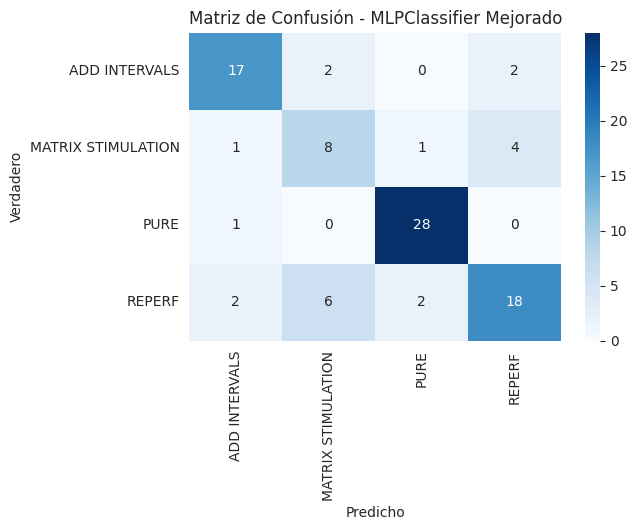

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from sklearn.preprocessing import LabelEncoder, StandardScaler

# Seleccionar las características más importantes basadas en SelectKBest
selected_features = ['H (ft)','BOPD_Before','Pr (psi)','Kabs (md)','BFPD_Before','Sand','BSW_Before']
X_selected = balanced_data_SMOTE_Tomek[selected_features]
y_selected = balanced_data_SMOTE_Tomek['Activity']

# Convertir las etiquetas a valores numéricos
label_encoder = LabelEncoder()
y_selected = label_encoder.fit_transform(y_selected)

# Normalizar las características
scaler = StandardScaler()
X_selected = scaler.fit_transform(X_selected)

# División en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_selected, y_selected, test_size=0.2, random_state=42)

# Entrenar un modelo de clasificación con Redes Neuronales (MLPClassifier) mejorado
mlp = MLPClassifier(hidden_layer_sizes=(256, 128, 64), activation='relu', solver='adam', alpha=0.0005,
                     learning_rate='adaptive', max_iter=1500, random_state=42, batch_size=32,
                     early_stopping=True, validation_fraction=0.1)
mlp.fit(X_train, y_train)

# Predicción en el conjunto de prueba
y_pred = mlp.predict(X_test)

# Evaluación del modelo
print("Reporte de Clasificación:")
print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))

# Mostrar la precisión del modelo
accuracy = accuracy_score(y_test, y_pred)
print(f"Precisión del modelo MLPClassifier: {accuracy:.2f}")

# Matriz de confusión
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel("Predicho")
plt.ylabel("Verdadero")
plt.title("Matriz de Confusión - MLPClassifier Mejorado")
plt.show()


# Comentarios Tutor
OJO en como estoy generando el dato sintetico para el tema de sesgo. Revisar si

existen valores duplicados o triplicados y a lo mejor no es la mas adecuada.

No aplico en esta seccion las metricas de rendimiento sino despues

El feature selection realizado en este momento no necesariamente aplica para cuando quiera realizar la regresion para la prediccion de caudal , debo evaluar nuevamente si se mantienen las mismas caracteristicas


El siguiente paso es ir al entrenamiento, ES IMPORTANTE CREAR EL BASE LINE. El base line si considera los diferentes tipos de ajustes que considere necesario.
Si puedo realizar una optimizacion de hyperparametros.

SVM

Decision Tree (4 CLASES)

Red Neuronal

Al final voy a presentar una tabla comparativa entre el modelo del base line y los otros que utilice. (incluir graficas / tablas )


**OBJETIVO DE LA SEMANA 22 DE FEBRERO ES CERRAR EL PROBLEMA DE CLASIFICACION**

**SEMANA DEL 24 DE FEBRERO AL 07 DE MARZO IR CON EL PROBLEMA DE REGRESION**


# Comparación de Importancia de Características por Método

## **1️⃣ Random Forest: Sin Rebalanceo vs. Con Rebalanceo**

| Rank | Feature        | Importancia (Sin Rebalanceo) | Feature        | Importancia (Con Rebalanceo) |
|------|---------------|----------------------------|---------------|----------------------------|
| 1    | Pr (psi)      | 0.163824                   | H (ft)        | 0.187258                   |
| 2    | H (ft)        | 0.138888                   | Pr (psi)      | 0.122162                   |
| 3    | Kabs (md)     | 0.128637                   | Kabs (md)     | 0.113552                   |
| 4    | BOPD_Before   | 0.123884                   | BFPD_Before   | 0.110549                   |
| 5    | BFPD_Before   | 0.120324                   | BOPD_Before   | 0.105765                   |
| 6    | BSW_Before    | 0.119886                   | Wellbore      | 0.102206                   |
| 7    | Wellbore      | 0.110058                   | BSW_Before    | 0.102186                   |
| 8    | Sand         | 0.051075                   | Sand         | 0.064732                   |
| 9    | Zone         | 0.023076                   | Performance   | 0.051296                   |
| 10   | Performance   | 0.020349                   | Zone         | 0.040294                   |

---

## **2️⃣ SelectKBest: Sin Rebalanceo vs. Con Rebalanceo**

| Rank | Feature        | Importancia (Sin Rebalanceo) | Feature        | Importancia (Con Rebalanceo) |
|------|---------------|----------------------------|---------------|----------------------------|
| 1    | Pr (psi)      | 0.106570                   | H (ft)        | 0.287258                   |
| 2    | Sand         | 0.062099                   | Pr (psi)      | 0.228296                   |
| 3    | Kabs (md)     | 0.059535                   | BOPD_Before   | 0.207842                   |
| 4    | BSW_Before    | 0.055349                   | BFPD_Before   | 0.154983                   |
| 5    | BOPD_Before   | 0.035847                   | Kabs (md)     | 0.151053                   |
| 6    | H (ft)        | 0.016143                   | BSW_Before    | 0.150676                   |
| 7    | BFPD_Before   | 0.001921                   | Wellbore      | 0.135568                   |
| 8    | Wellbore      | 0.000000                   | Sand         | 0.134308                   |
| 9    | Zone         | 0.000000                   | Performance   | 0.091545                   |
| 10   | Performance   | 0.000000                   | Zone         | 0.068632                   |

---

## **Observaciones Generales**
### **Random Forest**
- `H (ft)` y `Pr (psi)` son las características más relevantes en ambos casos, pero `H (ft)` gana mayor importancia tras el rebalanceo.
- `Zone` y `Performance` son más relevantes con rebalanceo que sin él.
- **Los valores de importancia están más equilibrados con rebalanceo**, sugiriendo que el modelo tiene menos sesgo hacia un subconjunto de características.

### **SelectKBest**
- `H (ft)`, `Pr (psi)` y `BOPD_Before` aumentan drásticamente su importancia después del rebalanceo.
- Sin rebalanceo, varias características (`Wellbore`, `Zone`, `Performance`) tienen importancia **cero**, lo que indica que el desequilibrio afectaba su selección.



# **PROBLEMA DE REGRESION**


# FEATURE SELECCTION

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import LabelEncoder

# Extraer el DataFrame de actividades desde el diccionario de datasets corregidos
historico_actividades = datasets_corrigidos["Historico de Actividades"]
historico_actividades.head()


,Well,WO,Sand,Wellbore,Zone,Date,Activity,BFPD_Before,BOPD_Before,BSW_Before,BFPD_After,BOPD_After,BSW_After,Pr (psi),Performance,Kabs (md),H (ft),BOPD_Increment
0,ACAG-076,NaN,UI,ACAG-076UI,central,2016-01-17,REPERF,261,159,39,281,169,40,1100,NOT SUCCESSFUL,445,26,10
1,YCAG-036,2.0,TI,YCAG-036TI,north,2016-01-17,REPERF,190,152,20,190,113,30,2393,NOT SUCCESSFUL,138,21,-39
2,ACSD-015,NaN,UI,ACSD-015UI,south,2016-02-05,REPERF,609,463,24,1070,792,26,2400,SUCCESSFUL,117,46,329
3,ACAQ-117,NaN,TI,ACAQ-117 TI,central,2016-03-03,REPERF,170,156,8,108,54,50,1150,NOT SUCCESSFUL,162,32,-102
4,ACAC-058,NaN,TI,ACAC-058TI,central,2016-03-15,REPERF,109,105,4,946,908,4,1100,SUCCESSFUL,913,35,803


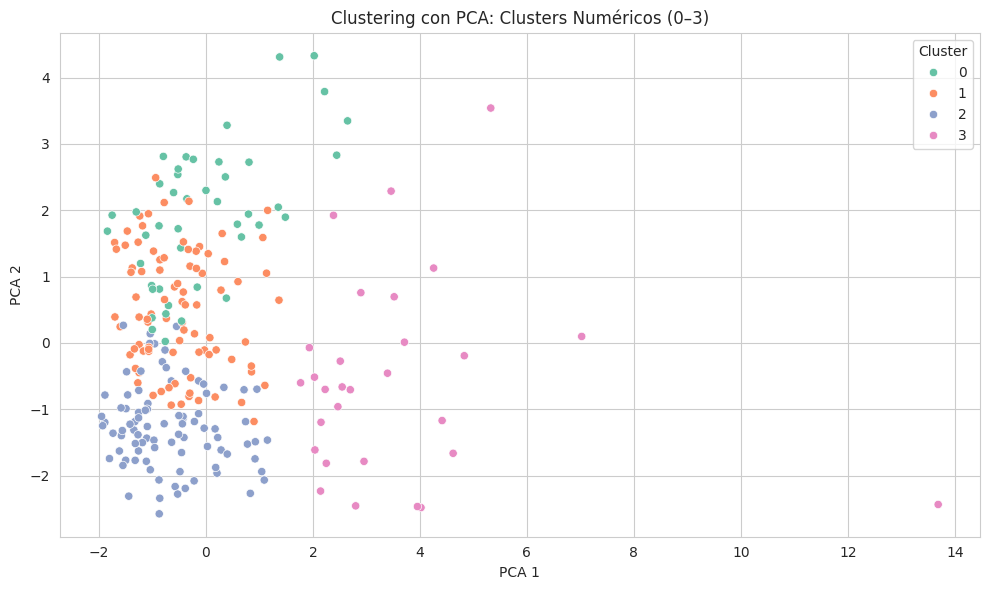

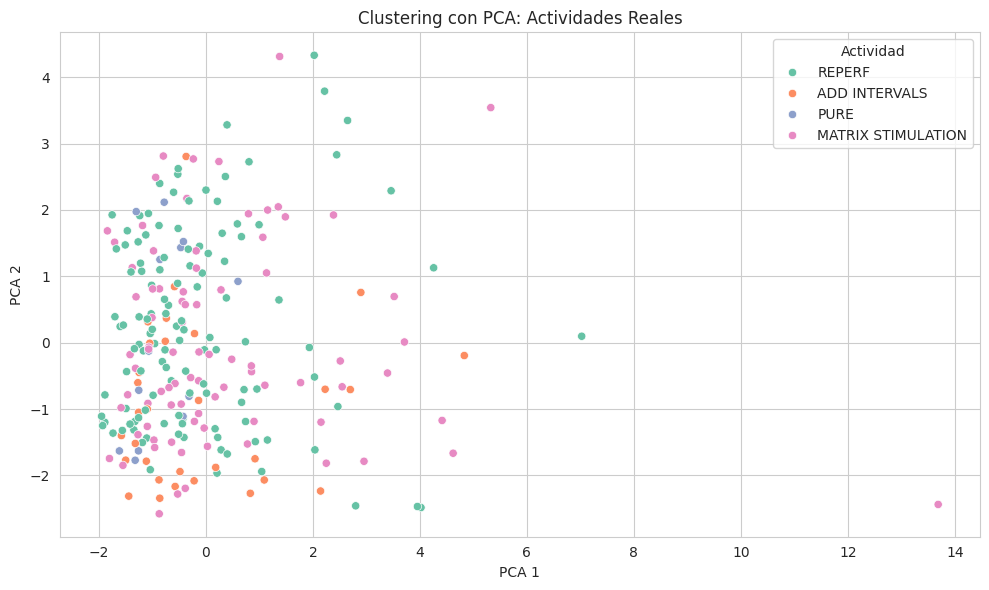

Distribución de actividades por cluster:
Activity  ADD INTERVALS  MATRIX STIMULATION  PURE  REPERF
Cluster                                                  
0                     2                  12     2      28
1                     7                  36     6      38
2                    17                  21     5      45
3                     5                  14     0      10


In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# --- 1. Preparar el dataset original sin filtros ---
df_filtrado = historico_actividades.copy()

# --- 2. Seleccionar columnas numéricas sin nulos ---
columnas_numericas = [
    'BFPD_Before', 'BOPD_Before', 'BSW_Before',
    'BFPD_After', 'BOPD_After', 'BSW_After',
    'Pr (psi)', 'Kabs (md)', 'H (ft)'
]
X = df_filtrado[columnas_numericas].copy()

# --- 3. Escalar los datos ---
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# --- 4. Calcular número de clusters = número de actividades únicas ---
n_clusters = df_filtrado['Activity'].nunique()

# --- 5. Aplicar KMeans clustering ---
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
df_filtrado['Cluster'] = kmeans.fit_predict(X_scaled)

# --- 6. Visualización con PCA ---
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# --- 7. Gráfico 1: por número de cluster (0, 1, 2, 3) ---
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x=X_pca[:, 0],
    y=X_pca[:, 1],
    hue=df_filtrado['Cluster'],
    palette='Set2'
)
plt.title("Clustering con PCA: Clusters Numéricos (0–3)")
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
plt.legend(title="Cluster")
plt.grid(True)
plt.tight_layout()
plt.show()

# --- 8. Gráfico 2: por actividad real ---
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x=X_pca[:, 0],
    y=X_pca[:, 1],
    hue=df_filtrado['Activity'],
    palette='Set2'
)
plt.title("Clustering con PCA: Actividades Reales")
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
plt.legend(title="Actividad")
plt.grid(True)
plt.tight_layout()
plt.show()

# --- 9. Tabla cruzada: distribución de actividades por cluster ---
tabla_cruzada = pd.crosstab(df_filtrado['Cluster'], df_filtrado['Activity'])
print("Distribución de actividades por cluster:")
print(tabla_cruzada)


🔍 ¿Qué estás viendo en cada gráfico?
🟢 Gráfico 1:
Clustering con PCA: Clusters Numéricos (0–3)

Muestra los resultados del algoritmo KMeans agrupando tus datos en 4 clusters basados solo en las variables numéricas.

Aquí ves grupos más claramente separados porque el algoritmo forza la creación de 4 grupos, ignorando el nombre de la actividad.

🔴 Gráfico 2:
Clustering con PCA: Actividades Reales

Aquí estás coloreando los puntos según la actividad real (Activity) registrada en el dataset.

Como las actividades no están determinadas por un algoritmo sino por cómo fueron etiquetadas en campo, no necesariamente están separadas en el espacio PCA.

Por eso se ven mezcladas, especialmente en áreas donde varias actividades tienen características numéricas similares.

/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


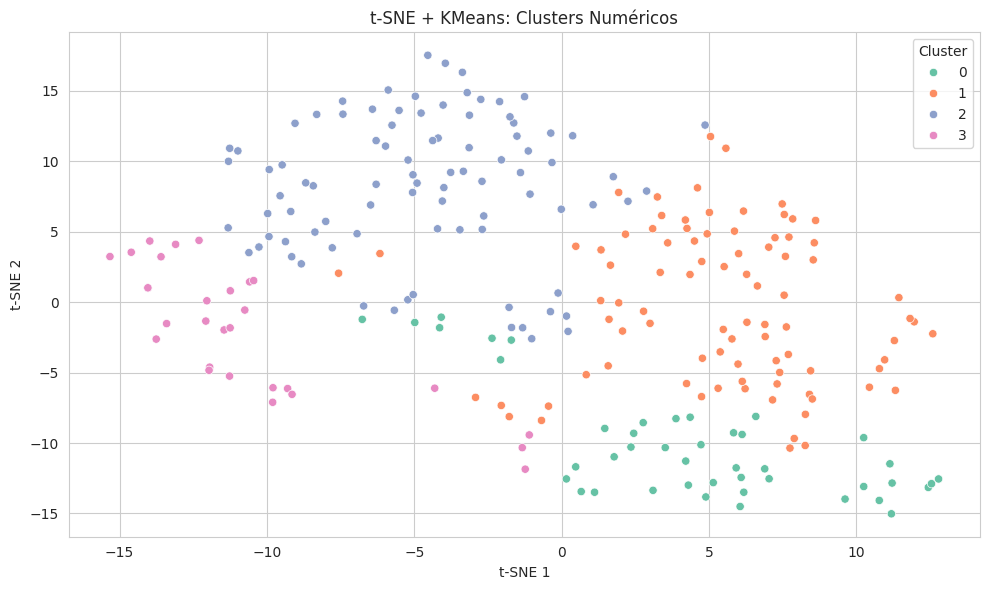

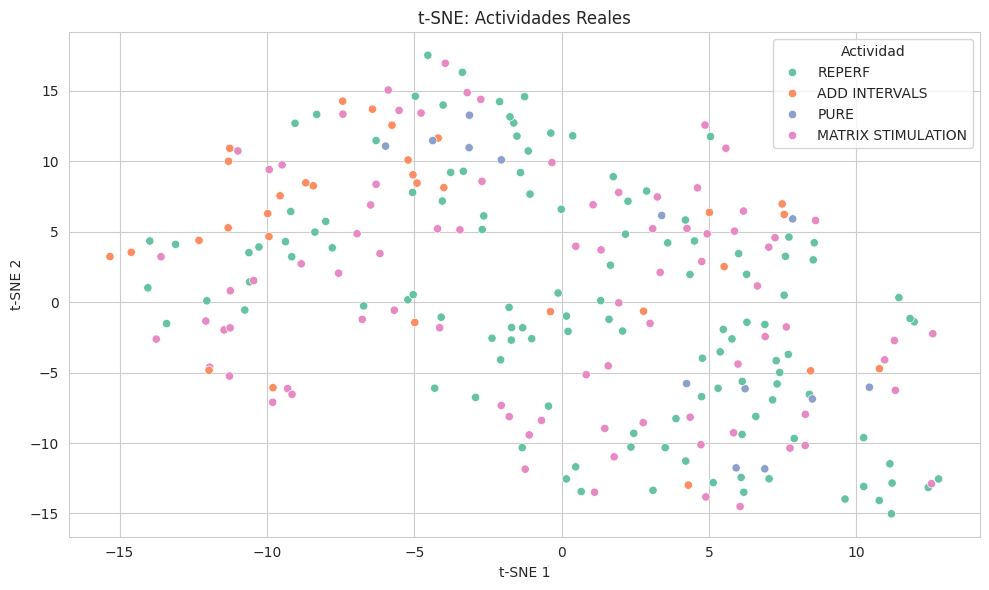

Activity,ADD INTERVALS,MATRIX STIMULATION,PURE,REPERF
Cluster,,,,
0,2,12,2,28
1,7,36,6,38
2,17,21,5,45
3,5,14,0,10


In [ ]:
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# --- 1. Copiar el dataset ---
df_tsne = historico_actividades.copy()

# --- 2. Seleccionar variables numéricas sin nulos ---
columnas_numericas = [
    'BFPD_Before', 'BOPD_Before', 'BSW_Before',
    'BFPD_After', 'BOPD_After', 'BSW_After',
    'Pr (psi)', 'Kabs (md)', 'H (ft)'
]
X = df_tsne[columnas_numericas].copy()

# --- 3. Escalar los datos ---
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# --- 4. Reducir dimensiones con t-SNE ---
tsne = TSNE(n_components=2, perplexity=30, n_iter=1000, random_state=42)
X_tsne = tsne.fit_transform(X_scaled)

# --- 5. Aplicar clustering con KMeans ---
kmeans = KMeans(n_clusters=4, random_state=42)
df_tsne['Cluster'] = kmeans.fit_predict(X_scaled)

# --- 6. Visualización 1: Clusters con t-SNE ---
plt.figure(figsize=(10, 6))
sns.scatterplot(x=X_tsne[:, 0], y=X_tsne[:, 1], hue=df_tsne['Cluster'], palette='Set2')
plt.title("t-SNE + KMeans: Clusters Numéricos")
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.legend(title="Cluster")
plt.grid(True)
plt.tight_layout()
plt.show()

# --- 7. Visualización 2: Actividades reales con t-SNE ---
plt.figure(figsize=(10, 6))
sns.scatterplot(x=X_tsne[:, 0], y=X_tsne[:, 1], hue=df_tsne['Activity'], palette='Set2')
plt.title("t-SNE: Actividades Reales")
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.legend(title="Actividad")
plt.grid(True)
plt.tight_layout()
plt.show()

# --- 8. Tabla cruzada para interpretación ---
pd.crosstab(df_tsne['Cluster'], df_tsne['Activity'])


### PCA & TSNE solo de las variables numericas

/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


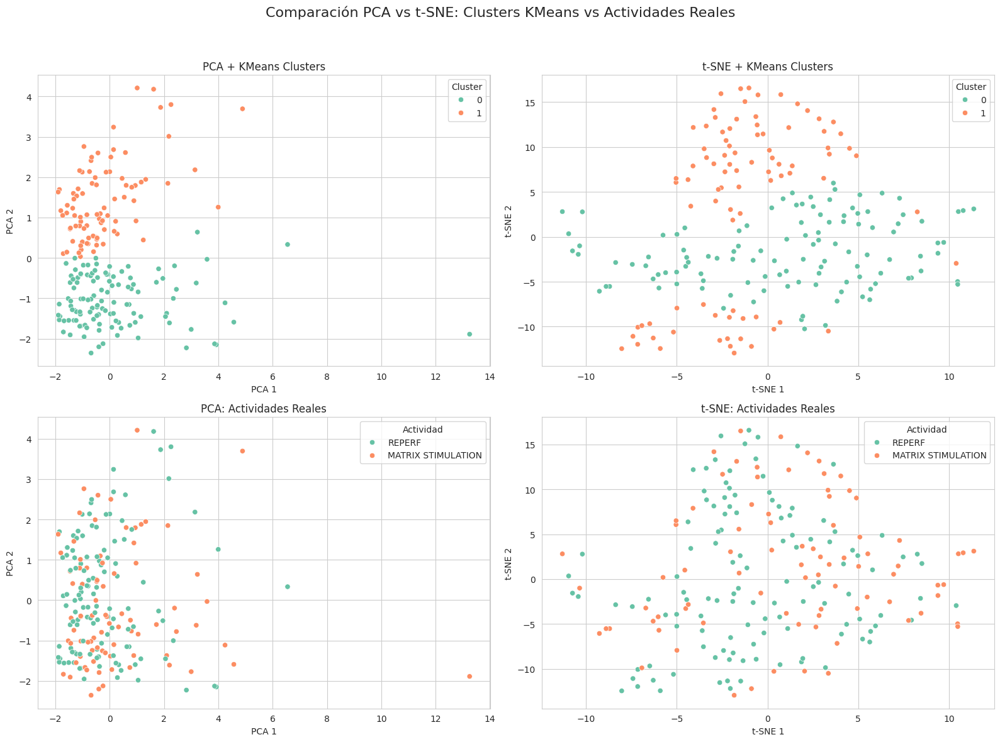

In [ ]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns

# --- 1. Filtrar solo REPERF y MATRIX STIMULATION ---
df_cmp = df_tsne[df_tsne['Activity'].isin(['REPERF', 'MATRIX STIMULATION'])].copy()
X_cmp = df_cmp[columnas_numericas]
X_scaled_cmp = scaler.fit_transform(X_cmp)

# --- 2. Reducir con PCA y t-SNE ---
X_pca = PCA(n_components=2).fit_transform(X_scaled_cmp)
X_tsne = TSNE(n_components=2, perplexity=30, n_iter=1000, random_state=42).fit_transform(X_scaled_cmp)

# --- 3. Clustering con KMeans sobre el espacio original
kmeans = KMeans(n_clusters=2, random_state=42)
df_cmp['Cluster'] = kmeans.fit_predict(X_scaled_cmp)

# --- 4. Visualización comparativa en formato 2x2 ---
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# -- Fila 1: Visualización de Clusters KMeans --
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=df_cmp['Cluster'], palette='Set2', ax=axes[0, 0])
axes[0, 0].set_title("PCA + KMeans Clusters")
axes[0, 0].set_xlabel("PCA 1")
axes[0, 0].set_ylabel("PCA 2")
axes[0, 0].legend(title="Cluster")
axes[0, 0].grid(True)

sns.scatterplot(x=X_tsne[:, 0], y=X_tsne[:, 1], hue=df_cmp['Cluster'], palette='Set2', ax=axes[0, 1])
axes[0, 1].set_title("t-SNE + KMeans Clusters")
axes[0, 1].set_xlabel("t-SNE 1")
axes[0, 1].set_ylabel("t-SNE 2")
axes[0, 1].legend(title="Cluster")
axes[0, 1].grid(True)

# -- Fila 2: Visualización de Actividades reales --
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=df_cmp['Activity'], palette='Set2', ax=axes[1, 0])
axes[1, 0].set_title("PCA: Actividades Reales")
axes[1, 0].set_xlabel("PCA 1")
axes[1, 0].set_ylabel("PCA 2")
axes[1, 0].legend(title="Actividad")
axes[1, 0].grid(True)

sns.scatterplot(x=X_tsne[:, 0], y=X_tsne[:, 1], hue=df_cmp['Activity'], palette='Set2', ax=axes[1, 1])
axes[1, 1].set_title("t-SNE: Actividades Reales")
axes[1, 1].set_xlabel("t-SNE 1")
axes[1, 1].set_ylabel("t-SNE 2")
axes[1, 1].legend(title="Actividad")
axes[1, 1].grid(True)

# Título general
plt.suptitle("Comparación PCA vs t-SNE: Clusters KMeans vs Actividades Reales", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


In [ ]:
!pip install category_encoders


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 3.8 MB/s eta 0:00:00


### PCA & TSNE solo de las variables numericas + Variables categoricas con Target Encoder




/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


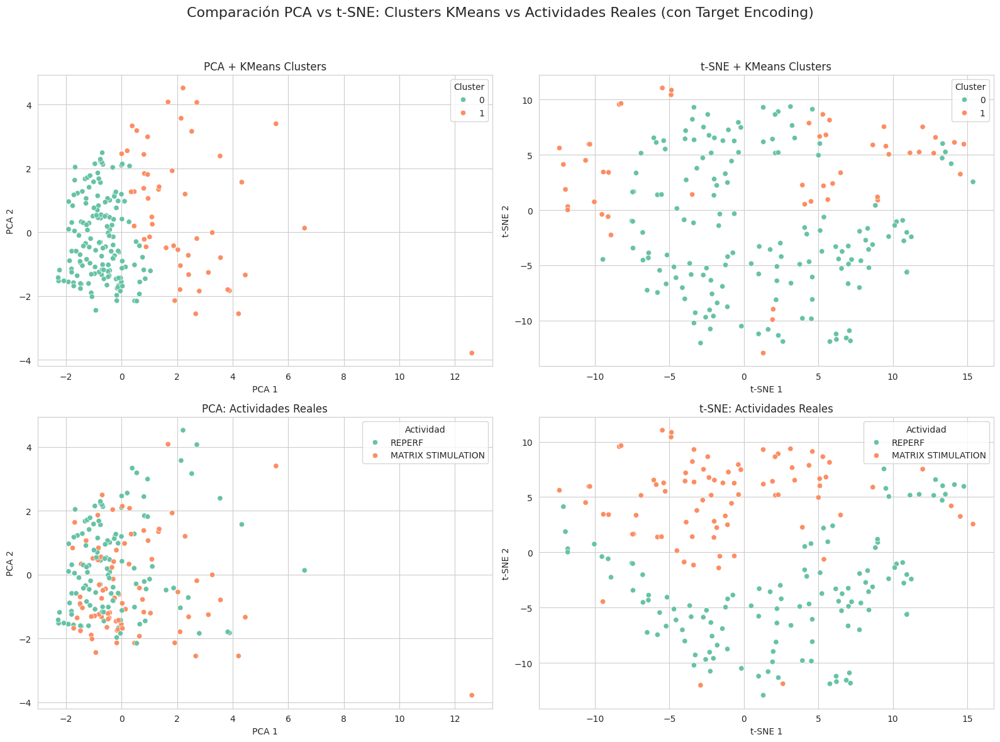

**PCA no logra separar claramente las actividades REPERF y STIMULATION** en las 2 dimensiones principales.


In [ ]:
# 1. Copiar dataset completo sin eliminar columnas
df_model = historico_actividades.copy()

# 2. Filtrar actividades de interés
df_model = df_model[df_model['Activity'].isin(['REPERF', 'MATRIX STIMULATION'])]

# 3. Eliminar nulos en variables críticas
df_model.dropna(subset=['BFPD_After', 'BFPD_Before', 'Kabs (md)', 'Pr (psi)', 'H (ft)'], inplace=True)

# 4. Definir variable objetivo
y = df_model['BFPD_After']

# 5. Realizar Feature Engineering sobre df_model (como ya hiciste)

# 6. Codificar y preparar X
# --> incluirá nuevas columnas y target encoding para categóricas


In [ ]:
print(df_model.columns)


Index(['Well', 'WO', 'Sand', 'Wellbore', 'Zone', 'Date', 'Activity',
       'BFPD_Before', 'BOPD_Before', 'BSW_Before', 'BFPD_After', 'BOPD_After',
       'BSW_After', 'Pr (psi)', 'Performance', 'Kabs (md)', 'H (ft)',
       'BOPD_Increment'],
      dtype='object')


In [ ]:
from category_encoders import TargetEncoder

# --- 1. FEATURE ENGINEERING: Crear nuevas variables sobre df_model ---

# A. Diferencias entre antes y después (solo calcular si no existen ya)
df_model['Delta_BFPD'] = df_model['BFPD_After'] - df_model['BFPD_Before']
df_model['Delta_BSW']  = df_model['BSW_After'] - df_model['BSW_Before']

# B. Relación agua/petróleo antes y después
df_model['WaterCut_Before'] = df_model['BSW_Before'] / (df_model['BFPD_Before'] + 1)
df_model['WaterCut_After']  = df_model['BSW_After'] / (df_model['BFPD_After'] + 1)

# C. Porcentaje de cambio
df_model['PctChange_BFPD'] = df_model['Delta_BFPD'] / (df_model['BFPD_Before'] + 1)
df_model['PctChange_BOPD'] = df_model['BOPD_Increment'] / (df_model['BOPD_Before'] + 1)

# D. Eficiencia operativa después
df_model['Efficiency_After'] = df_model['BOPD_After'] / (df_model['BFPD_After'] + 1)

# --- 2. Definir columnas finales para modelado ---
feature_cols = [
    'BFPD_Before', 'BOPD_Before', 'BSW_Before',
    'Pr (psi)', 'Kabs (md)', 'H (ft)',
    'Sand', 'Zone', 'Activity', 'Performance',
    'BOPD_Increment',               # usamos esta directamente
    'Delta_BFPD', 'Delta_BSW',
    'WaterCut_Before', 'WaterCut_After',
    'PctChange_BFPD', 'PctChange_BOPD',
    'Efficiency_After'
]

categorical_cols = ['Sand', 'Zone', 'Activity', 'Performance']

# --- 3. Codificación target para variables categóricas ---
encoder = TargetEncoder(cols=categorical_cols)
df_model_encoded = df_model.copy()
df_model_encoded[categorical_cols] = encoder.fit_transform(df_model_encoded[categorical_cols], df_model['BFPD_After'])

# --- 4. X e y finales ---
X = df_model_encoded[feature_cols]
y = df_model_encoded['BFPD_After']



In [ ]:
print(df_model_encoded.columns)


Index(['Well', 'WO', 'Sand', 'Wellbore', 'Zone', 'Date', 'Activity',
       'BFPD_Before', 'BOPD_Before', 'BSW_Before', 'BFPD_After', 'BOPD_After',
       'BSW_After', 'Pr (psi)', 'Performance', 'Kabs (md)', 'H (ft)',
       'BOPD_Increment', 'Delta_BFPD', 'Delta_BSW', 'WaterCut_Before',
       'WaterCut_After', 'PctChange_BFPD', 'PctChange_BOPD',
       'Efficiency_After'],
      dtype='object')


In [ ]:
from category_encoders import TargetEncoder


<ipython-input-54-ec997b3122a6>:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=rf_importances, x='Importance', y='Feature', ax=axes[0], palette='viridis')
<ipython-input-54-ec997b3122a6>:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=kbest_importances, x='Importance', y='Feature', ax=axes[1], palette='magma')


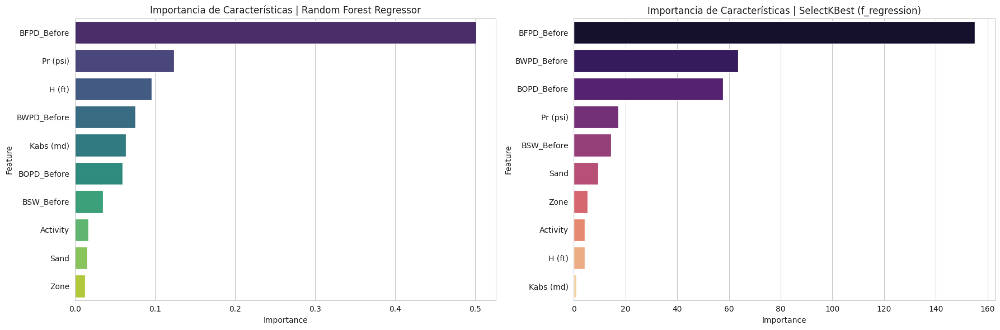

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from category_encoders import TargetEncoder

# --- 1. Copiar dataset original y filtrar actividades ---
df_model = historico_actividades.copy()
df_model = df_model[df_model['Activity'].isin(['REPERF', 'MATRIX STIMULATION'])]

# --- 2. Eliminar nulos en columnas clave ---
df_model.dropna(subset=['BFPD_After', 'BFPD_Before', 'Kabs (md)', 'Pr (psi)', 'H (ft)'], inplace=True)

# --- 3. Feature Engineering SOLO con variables antes ---
df_model['BWPD_Before'] = df_model['BFPD_Before'] - df_model['BOPD_Before']

# --- 4. Columnas finales ---
feature_cols = [
    'BFPD_Before', 'BOPD_Before', 'BSW_Before',
    'Pr (psi)', 'Kabs (md)', 'H (ft)',
    'Sand', 'Zone', 'Activity',
    'BWPD_Before'
]
categorical_cols = ['Sand', 'Zone', 'Activity']

# --- 5. Codificación con TargetEncoder ---
encoder = TargetEncoder(cols=categorical_cols)
df_model_encoded = df_model.copy()
df_model_encoded[categorical_cols] = encoder.fit_transform(df_model[categorical_cols], df_model['BFPD_After'])

# --- 6. Separar variables y objetivo ---
X = df_model_encoded[feature_cols]
y = df_model_encoded['BFPD_After']

# --- 7. Imputación y escalado ---
imputer = SimpleImputer(strategy='median')
X_imputed = pd.DataFrame(imputer.fit_transform(X), columns=X.columns)

scaler = StandardScaler()
X_scaled = pd.DataFrame(scaler.fit_transform(X_imputed), columns=X.columns)

# --- 8. Random Forest Regressor: Feature Importance ---
rf = RandomForestRegressor(n_estimators=200, random_state=42)
rf.fit(X_imputed, y)
rf_importances = pd.DataFrame({
    'Feature': X.columns,
    'Importance': rf.feature_importances_
}).sort_values(by='Importance', ascending=False)

# --- 9. SelectKBest (f_regression): Feature Scores ---
kbest = SelectKBest(score_func=f_regression, k='all')
kbest.fit(X_scaled, y)
kbest_importances = pd.DataFrame({
    'Feature': X.columns,
    'Importance': kbest.scores_
}).sort_values(by='Importance', ascending=False)

# --- 10. Visualización comparativa ---
sns.set_style("whitegrid")
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

sns.barplot(data=rf_importances, x='Importance', y='Feature', ax=axes[0], palette='viridis')
axes[0].set_title("Importancia de Características | Random Forest Regressor")

sns.barplot(data=kbest_importances, x='Importance', y='Feature', ax=axes[1], palette='magma')
axes[1].set_title("Importancia de Características | SelectKBest (f_regression)")

plt.tight_layout()
plt.show()


In [ ]:
df_model = historico_actividades.copy()
df_model = df_model[df_model['Activity'].isin(['REPERF', 'MATRIX STIMULATION'])]


In [ ]:
print(df_model['Activity'].value_counts())


Activity
REPERF                121
MATRIX STIMULATION     83
Name: count, dtype: int64


In [ ]:
!pip install kneed



Random Forest: 1 features
Variables seleccionadas por Random Forest:
['BFPD_Before']

SelectKBest: 1 features
Variables seleccionadas por SelectKBest:
['BFPD_Before']


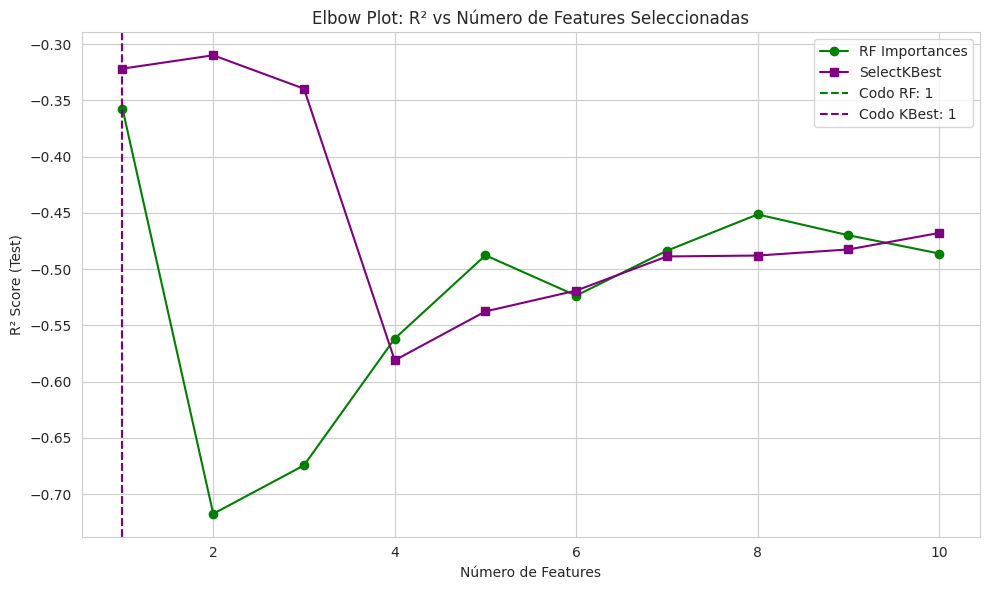

In [ ]:
from kneed import KneeLocator
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
import numpy as np

# --- 1. Obtener orden de features por importancia ---
ordered_rf = rf_importances['Feature'].tolist()
ordered_kbest = kbest_importances['Feature'].tolist()

# --- 2. Evaluar R² al aumentar el número de features ---
max_k = min(12, len(X_imputed.columns))
r2_rf = []
r2_kbest = []

for k in range(1, max_k + 1):
    # Top-k por RF
    X_rf_k = X_imputed[ordered_rf[:k]]
    # Top-k por KBest
    X_kbest_k = X_scaled[ordered_kbest[:k]]

    # Modelo con features RF
    X_train_rf, X_test_rf, y_train_rf, y_test_rf = train_test_split(X_rf_k, y, test_size=0.2, random_state=42)
    model_rf = RandomForestRegressor(n_estimators=200, random_state=42)
    model_rf.fit(X_train_rf, y_train_rf)
    r2_rf.append(r2_score(y_test_rf, model_rf.predict(X_test_rf)))

    # Modelo con features KBest
    X_train_k, X_test_k, y_train_k, y_test_k = train_test_split(X_kbest_k, y, test_size=0.2, random_state=42)
    model_k = RandomForestRegressor(n_estimators=200, random_state=42)
    model_k.fit(X_train_k, y_train_k)
    r2_kbest.append(r2_score(y_test_k, model_k.predict(X_test_k)))

# --- 3. Detectar puntos de codo ---
x_vals = list(range(1, max_k + 1))
knee_rf = KneeLocator(x_vals, r2_rf, curve='concave', direction='increasing').knee
knee_kbest = KneeLocator(x_vals, r2_kbest, curve='concave', direction='increasing').knee

# --- 4. Mostrar resultados ---
print(f"\nRandom Forest: {knee_rf} features")
print("Variables seleccionadas por Random Forest:")
print(ordered_rf[:knee_rf])

print(f"\nSelectKBest: {knee_kbest} features")
print("Variables seleccionadas por SelectKBest:")
print(ordered_kbest[:knee_kbest])

# --- 5. Graficar curva de codo ---
plt.figure(figsize=(10, 6))
plt.plot(x_vals, r2_rf, marker='o', label='RF Importances', color='green')
plt.plot(x_vals, r2_kbest, marker='s', label='SelectKBest', color='purple')

if knee_rf:
    plt.axvline(knee_rf, color='green', linestyle='--', label=f'Codo RF: {knee_rf}')
if knee_kbest:
    plt.axvline(knee_kbest, color='purple', linestyle='--', label=f'Codo KBest: {knee_kbest}')

plt.title("Elbow Plot: R² vs Número de Features Seleccionadas")
plt.xlabel("Número de Features")
plt.ylabel("R² Score (Test)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


<ipython-input-60-d5c6368d539a>:74: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=rf_reperf, x='Importance', y='Feature', ax=axes[0, 0], palette='viridis')
<ipython-input-60-d5c6368d539a>:77: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=kbest_reperf, x='Importance', y='Feature', ax=axes[0, 1], palette='magma')
<ipython-input-60-d5c6368d539a>:80: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=rf_matrix, x='Importance', y='Feature', ax=axes[1, 0], palette='viridis')
<ipython-input-60-d5c6368d539a>:83: FutureWarning: 

Passing `p

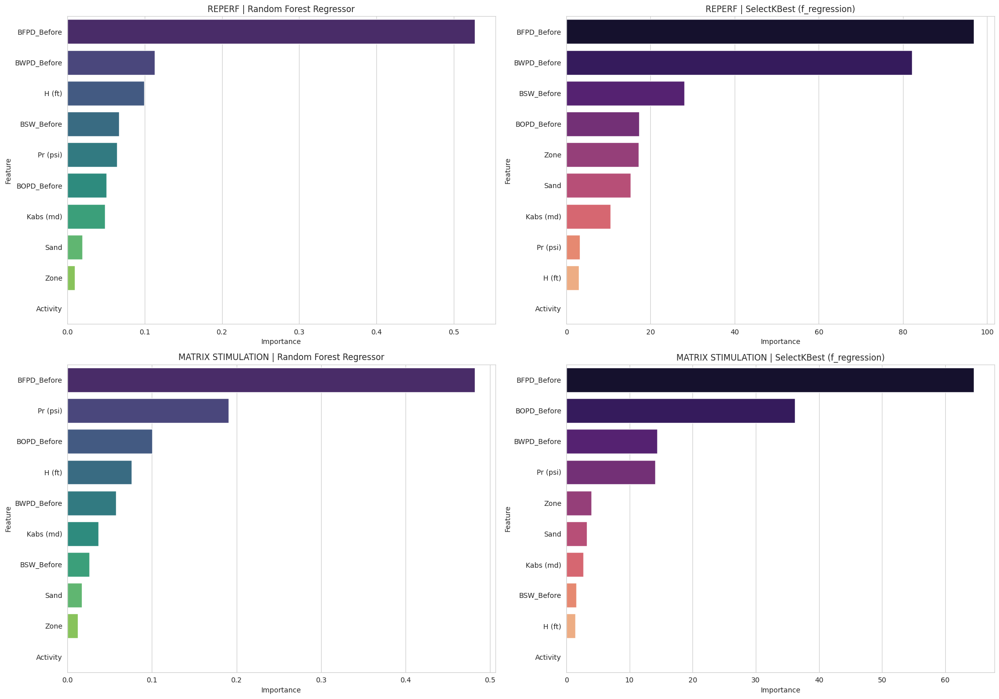

Variables importantes REPERF (Random Forest):
['BFPD_Before', 'BWPD_Before', 'H (ft)', 'BSW_Before', 'Pr (psi)', 'BOPD_Before', 'Kabs (md)', 'Sand', 'Zone', 'Activity']

Variables importantes REPERF (SelectKBest):
['BFPD_Before', 'BWPD_Before', 'BSW_Before', 'BOPD_Before', 'Zone', 'Sand', 'Kabs (md)', 'Pr (psi)', 'H (ft)', 'Activity']

Variables importantes MATRIX STIMULATION (Random Forest):
['BFPD_Before', 'Pr (psi)', 'BOPD_Before', 'H (ft)', 'BWPD_Before', 'Kabs (md)', 'BSW_Before', 'Sand', 'Zone', 'Activity']

Variables importantes MATRIX STIMULATION (SelectKBest):
['BFPD_Before', 'BOPD_Before', 'BWPD_Before', 'Pr (psi)', 'Zone', 'Sand', 'Kabs (md)', 'BSW_Before', 'H (ft)', 'Activity']


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from category_encoders import TargetEncoder

# --- 1. Copiar dataset original y filtrar actividades ---
df_model = historico_actividades.copy()
df_model = df_model[df_model['Activity'].isin(['REPERF', 'MATRIX STIMULATION'])]

# --- 2. Eliminar nulos en columnas clave ---
df_model.dropna(subset=['BFPD_After', 'BFPD_Before', 'Kabs (md)', 'Pr (psi)', 'H (ft)'], inplace=True)

# --- 3. Feature Engineering SOLO con variables antes ---
df_model['BWPD_Before'] = df_model['BFPD_Before'] - df_model['BOPD_Before']

# --- 4. Columnas finales ---
feature_cols = [
    'BFPD_Before', 'BOPD_Before', 'BSW_Before',
    'Pr (psi)', 'Kabs (md)', 'H (ft)',
    'Sand', 'Zone', 'Activity',
    'BWPD_Before'
]
categorical_cols = ['Sand', 'Zone', 'Activity']

# --- Función para procesar y graficar para cada actividad ---
def feature_importance_por_actividad(df, actividad):
    df_act = df[df['Activity'] == actividad].copy()

    # Codificar variables categóricas con TargetEncoder
    encoder = TargetEncoder(cols=categorical_cols)
    df_act_encoded = df_act.copy()
    df_act_encoded[categorical_cols] = encoder.fit_transform(df_act[categorical_cols], df_act['BFPD_After'])

    # Preparar X e y
    X = df_act_encoded[feature_cols]
    y = df_act_encoded['BFPD_After']

    # Imputar y escalar
    imputer = SimpleImputer(strategy='median')
    X_imputed = pd.DataFrame(imputer.fit_transform(X), columns=X.columns)

    scaler = StandardScaler()
    X_scaled = pd.DataFrame(scaler.fit_transform(X_imputed), columns=X.columns)

    # Random Forest
    rf = RandomForestRegressor(n_estimators=200, random_state=42)
    rf.fit(X_imputed, y)
    rf_importances = pd.DataFrame({
        'Feature': X.columns,
        'Importance': rf.feature_importances_
    }).sort_values(by='Importance', ascending=False)

    # SelectKBest
    kbest = SelectKBest(score_func=f_regression, k='all')
    kbest.fit(X_scaled, y)
    kbest_importances = pd.DataFrame({
        'Feature': X.columns,
        'Importance': kbest.scores_
    }).sort_values(by='Importance', ascending=False)

    return rf_importances, kbest_importances

# --- Ejecutar para ambas actividades ---
rf_reperf, kbest_reperf = feature_importance_por_actividad(df_model, 'REPERF')
rf_matrix, kbest_matrix = feature_importance_por_actividad(df_model, 'MATRIX STIMULATION')

# --- Visualización en 2 filas y 2 columnas ---
fig, axes = plt.subplots(2, 2, figsize=(20, 14))

sns.barplot(data=rf_reperf, x='Importance', y='Feature', ax=axes[0, 0], palette='viridis')
axes[0, 0].set_title("REPERF | Random Forest Regressor")

sns.barplot(data=kbest_reperf, x='Importance', y='Feature', ax=axes[0, 1], palette='magma')
axes[0, 1].set_title("REPERF | SelectKBest (f_regression)")

sns.barplot(data=rf_matrix, x='Importance', y='Feature', ax=axes[1, 0], palette='viridis')
axes[1, 0].set_title("MATRIX STIMULATION | Random Forest Regressor")

sns.barplot(data=kbest_matrix, x='Importance', y='Feature', ax=axes[1, 1], palette='magma')
axes[1, 1].set_title("MATRIX STIMULATION | SelectKBest (f_regression)")

plt.tight_layout()
plt.show()

# --- Mostrar variables seleccionadas para cada método y actividad ---
print("Variables importantes REPERF (Random Forest):")
print(rf_reperf['Feature'].head(10).tolist())
print("\nVariables importantes REPERF (SelectKBest):")
print(kbest_reperf['Feature'].head(10).tolist())

print("\nVariables importantes MATRIX STIMULATION (Random Forest):")
print(rf_matrix['Feature'].head(10).tolist())
print("\nVariables importantes MATRIX STIMULATION (SelectKBest):")
print(kbest_matrix['Feature'].head(10).tolist())



Actividad: REPERF
Random Forest: 3 features
Variables seleccionadas por RF:
['BFPD_Before', 'BWPD_Before', 'H (ft)']

SelectKBest: 3 features
Variables seleccionadas por KBest:
['BFPD_Before', 'BWPD_Before', 'BSW_Before']


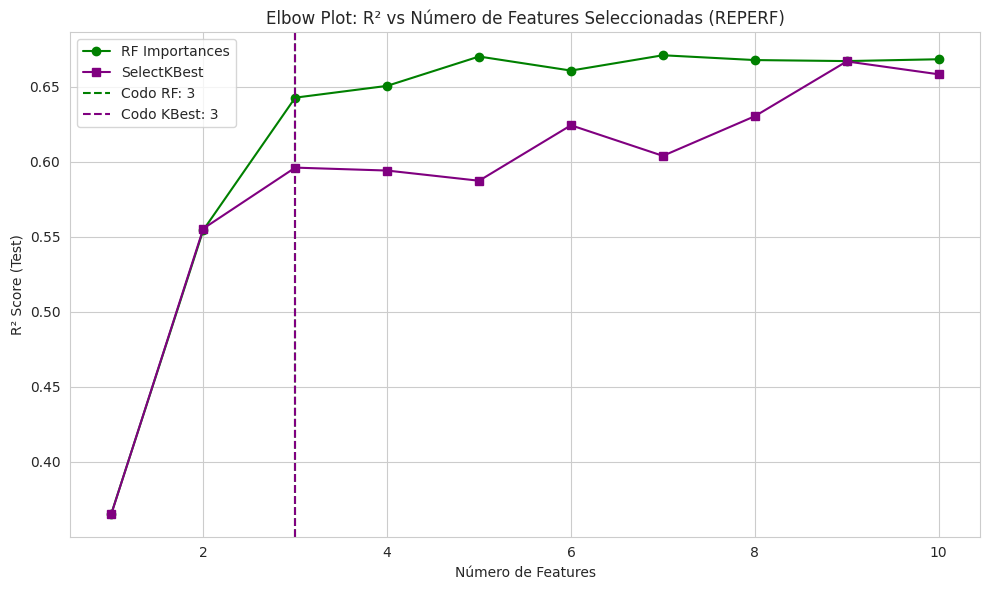


Actividad: MATRIX STIMULATION
Random Forest: 1 features
Variables seleccionadas por RF:
['BFPD_Before']

SelectKBest: 1 features
Variables seleccionadas por KBest:
['BFPD_Before']


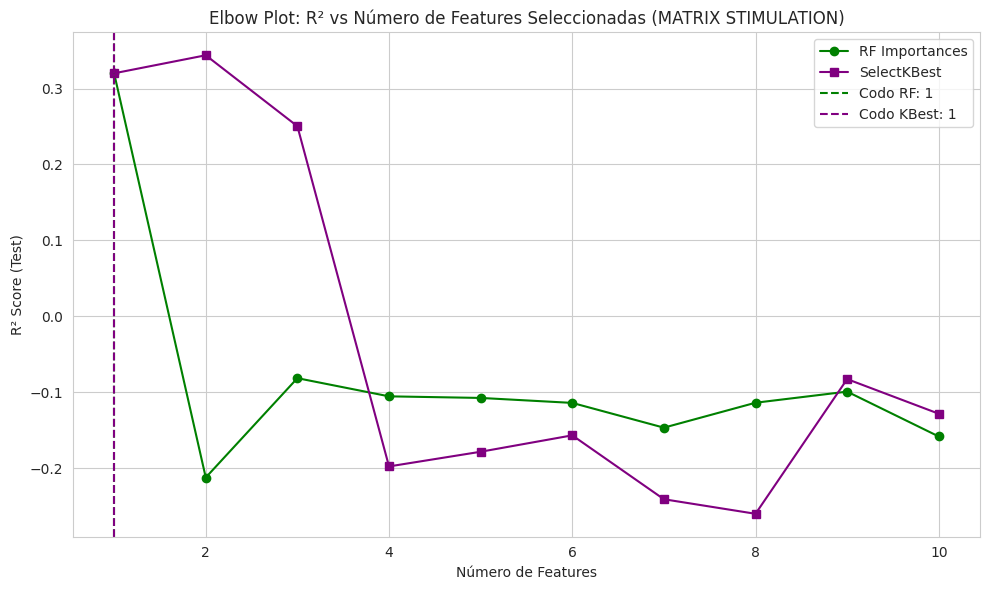

In [ ]:
from kneed import KneeLocator
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt

def elbow_plot_por_actividad(df, actividad, rf_importances, kbest_importances):
    # Filtrar datos por actividad
    df_act = df[df['Activity'] == actividad].copy()

    # Codificar categóricas con TargetEncoder
    encoder = TargetEncoder(cols=categorical_cols)
    df_act_encoded = df_act.copy()
    df_act_encoded[categorical_cols] = encoder.fit_transform(df_act[categorical_cols], df_act['BFPD_After'])

    # Preparar X e y
    X = df_act_encoded[feature_cols]
    y = df_act_encoded['BFPD_After']

    # Imputar y escalar
    imputer = SimpleImputer(strategy='median')
    X_imputed = pd.DataFrame(imputer.fit_transform(X), columns=X.columns)

    scaler = StandardScaler()
    X_scaled = pd.DataFrame(scaler.fit_transform(X_imputed), columns=X.columns)

    ordered_rf = rf_importances['Feature'].tolist()
    ordered_kbest = kbest_importances['Feature'].tolist()

    max_k = min(12, len(X.columns))
    r2_rf = []
    r2_kbest = []

    for k in range(1, max_k + 1):
        X_rf_k = X_imputed[ordered_rf[:k]]
        X_kbest_k = X_scaled[ordered_kbest[:k]]

        # RF model
        X_train_rf, X_test_rf, y_train_rf, y_test_rf = train_test_split(X_rf_k, y, test_size=0.2, random_state=42)
        model_rf = RandomForestRegressor(n_estimators=200, random_state=42)
        model_rf.fit(X_train_rf, y_train_rf)
        r2_rf.append(r2_score(y_test_rf, model_rf.predict(X_test_rf)))

        # KBest model
        X_train_k, X_test_k, y_train_k, y_test_k = train_test_split(X_kbest_k, y, test_size=0.2, random_state=42)
        model_k = RandomForestRegressor(n_estimators=200, random_state=42)
        model_k.fit(X_train_k, y_train_k)
        r2_kbest.append(r2_score(y_test_k, model_k.predict(X_test_k)))

    x_vals = list(range(1, max_k + 1))
    knee_rf = KneeLocator(x_vals, r2_rf, curve='concave', direction='increasing').knee
    knee_kbest = KneeLocator(x_vals, r2_kbest, curve='concave', direction='increasing').knee

    print(f"\nActividad: {actividad}")
    print(f"Random Forest: {knee_rf} features")
    print("Variables seleccionadas por RF:")
    print(ordered_rf[:knee_rf])

    print(f"\nSelectKBest: {knee_kbest} features")
    print("Variables seleccionadas por KBest:")
    print(ordered_kbest[:knee_kbest])

    # Graficar
    plt.figure(figsize=(10, 6))
    plt.plot(x_vals, r2_rf, marker='o', label='RF Importances', color='green')
    plt.plot(x_vals, r2_kbest, marker='s', label='SelectKBest', color='purple')

    if knee_rf:
        plt.axvline(knee_rf, color='green', linestyle='--', label=f'Codo RF: {knee_rf}')
    if knee_kbest:
        plt.axvline(knee_kbest, color='purple', linestyle='--', label=f'Codo KBest: {knee_kbest}')

    plt.title(f"Elbow Plot: R² vs Número de Features Seleccionadas ({actividad})")
    plt.xlabel("Número de Features")
    plt.ylabel("R² Score (Test)")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Ejecutar para ambas actividades
elbow_plot_por_actividad(df_model, 'REPERF', rf_reperf, kbest_reperf)
elbow_plot_por_actividad(df_model, 'MATRIX STIMULATION', rf_matrix, kbest_matrix)


### <span style="color: #000080;">Resumen de Interpretación de Gráficos de Codo</span>

## <span style="color: #000080;">Separar las actividades mejora la precisión:</span>

- Al analizar **REPERF** y **MATRIX STIMULATION** por separado, se logra una mejor selección de variables relevantes para predecir el caudal de petróleo después de la intervención.

- Esto indica que cada actividad tiene características diferentes que influyen en el rendimiento del modelo y por lo tanto es adecuado tratarlas individualmente.

## <span style="color: #000080;">Para REPERF:</span>

- El modelo **Random Forest** y el método **SelectKBest** identificaron un conjunto de **3 variables importantes** para predecir la variable objetivo (**BFPD_After**).

- El gráfico muestra que con esas **3 variables** ya se alcanza un buen desempeño, con un **R² alrededor de 0.65**, que indica una explicación decente de la variabilidad en los datos.

- Variables claves: **'BFPD_Before'**, **'BWPD_Before'** y **'H (ft)'** para Random Forest; **'BFPD_Before'**, **'BWPD_Before'** y **'BSW_Before'** para SelectKBest.

## <span style="color: #000080;">Para MATRIX STIMULATION:</span>

- La mejor selección según ambos métodos es usar solo **1 variable**: **'BFPD_Before'**.

- El desempeño del modelo es mucho menor (**R² cercano a 0 o incluso negativo**), lo que indica que el modelo no logra predecir bien esta actividad con las variables disponibles.

- Esto puede reflejar que para **MATRIX STIMULATION** se requieren más variables, información adicional o modelos diferentes.

## <span style="color: #000080;">Conclusión general:</span>

- La separación por tipo de actividad es clave para mejorar la interpretación y rendimiento de los modelos predictivos.

- Para **REPERF** se puede confiar en un conjunto pequeño de variables para explicar el resultado.

- Para **MATRIX STIMULATION** los modelos actuales con las variables usadas no son suficientemente buenos, y posiblemente necesiten más datos o un análisis más profundo.


### Optimizacion para Matrix Stimulation

Cantidad de outliers detectados: 5


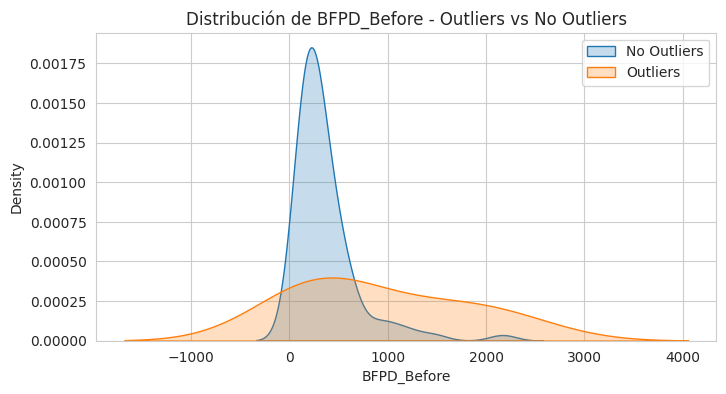

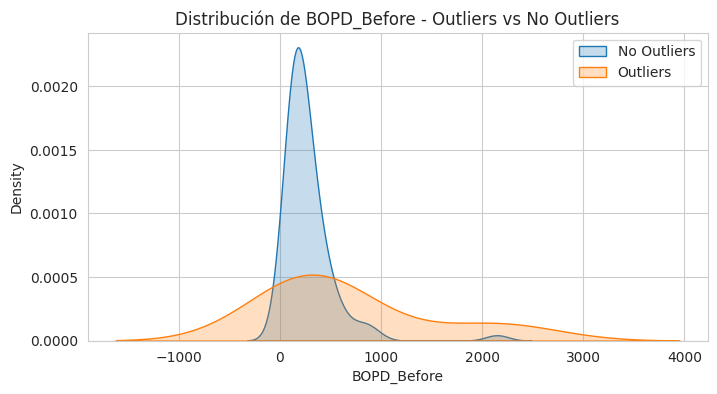

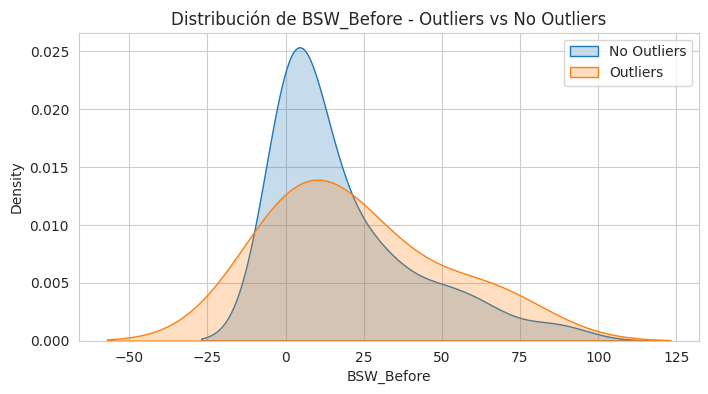

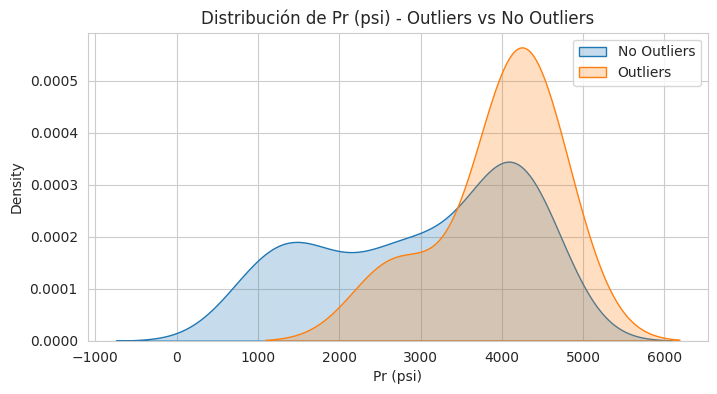

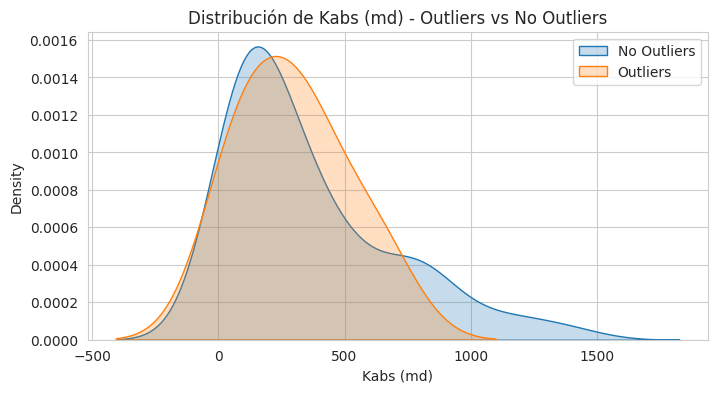

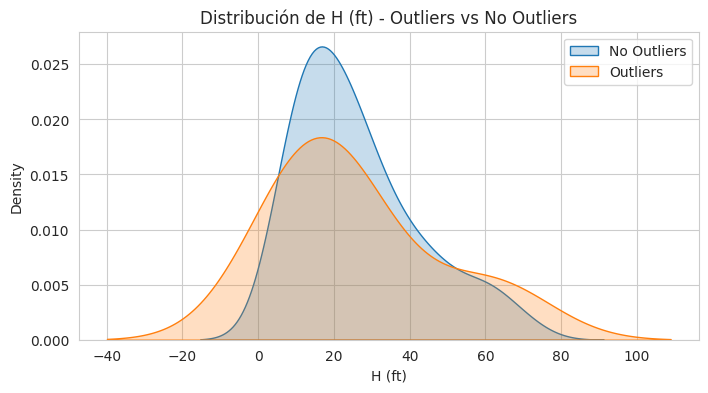

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from category_encoders import TargetEncoder

# --- 1. Copiar dataset original y filtrar solo Matrix Stimulation ---
df_model = historico_actividades.copy()
df_matrix = df_model[df_model['Activity'] == 'MATRIX STIMULATION'].copy()

# --- 2. Eliminar nulos en columnas clave ---
df_matrix.dropna(subset=['BFPD_After', 'BFPD_Before', 'Kabs (md)', 'Pr (psi)', 'H (ft)'], inplace=True)

# --- 3. Feature Engineering SOLO con variables antes ---
df_matrix['BWPD_Before'] = df_matrix['BFPD_Before'] - df_matrix['BOPD_Before']

# --- 4. Columnas finales ---
feature_cols = [
    'BFPD_Before', 'BOPD_Before', 'BSW_Before',
    'Pr (psi)', 'Kabs (md)', 'H (ft)',
    'Sand', 'Zone', 'Activity',
    'BWPD_Before'
]
categorical_cols = ['Sand', 'Zone', 'Activity']

# --- 5. Codificación con TargetEncoder ---
encoder = TargetEncoder(cols=categorical_cols)
df_matrix_encoded = df_matrix.copy()
df_matrix_encoded[categorical_cols] = encoder.fit_transform(df_matrix[categorical_cols], df_matrix['BFPD_After'])

# --- 6. Separar variables y objetivo ---
X = df_matrix_encoded[feature_cols]
y = df_matrix_encoded['BFPD_After']

# --- 7. Imputación y escalado ---
imputer = SimpleImputer(strategy='median')
X_imputed = pd.DataFrame(imputer.fit_transform(X), columns=X.columns)

scaler = StandardScaler()
X_scaled = pd.DataFrame(scaler.fit_transform(X_imputed), columns=X.columns)

# --- 8. Entrenar Random Forest ---
rf_matrix = RandomForestRegressor(n_estimators=200, random_state=42)
rf_matrix.fit(X_imputed, y)

# --- 9. Predecir y calcular residuos ---
y_pred = rf_matrix.predict(X_imputed)
residuals = y - y_pred
df_matrix_encoded['Residuals'] = residuals

# --- 10. Detectar outliers (residuals > 2 desviaciones estándar) ---
threshold = 2 * np.std(residuals)
outliers = df_matrix_encoded[np.abs(df_matrix_encoded['Residuals']) > threshold]

print(f"Cantidad de outliers detectados: {len(outliers)}")

# --- 11. Visualizar outliers para variables clave ---
variables_clave = ['BFPD_Before', 'BOPD_Before', 'BSW_Before', 'Pr (psi)', 'Kabs (md)', 'H (ft)']

for var in variables_clave:
    plt.figure(figsize=(8, 4))
    sns.kdeplot(df_matrix_encoded[var], label='No Outliers', fill=True)
    sns.kdeplot(outliers[var], label='Outliers', fill=True)
    plt.title(f'Distribución de {var} - Outliers vs No Outliers')
    plt.legend()
    plt.show()


### Interpretación de las gráficas de densidad para Outliers vs No Outliers

### BFPD_Before y BOPD_Before:
Los outliers tienden a concentrarse en rangos altos y más dispersos, mientras que los datos no outliers están más agrupados en valores más bajos y con menor dispersión. Esto indica que los pozos con caudales iniciales muy altos o muy variables pueden ser más difíciles de predecir correctamente.

### BSW_Before:
La distribución de los outliers es más ancha y con una cola hacia valores altos en comparación con los no outliers, sugiriendo que pozos con altos contenidos de agua tienen un comportamiento menos predecible.

### Pr (psi):
Los outliers se concentran en presiones más altas en comparación con los datos no outliers, lo cual podría indicar que presiones elevadas generan mayor dificultad para predecir el caudal.

### Kabs (md) y H (ft):
La permeabilidad y la profundidad muestran una distribución más dispersa para los outliers, lo que indica que variaciones en estas propiedades pueden influir en la dificultad para modelar correctamente.


#SEGMENTACION DE DATOS DE MATRIX STIMULATION

In [ ]:
df = historico_actividades.copy()
df = df[df['Activity'] == 'MATRIX STIMULATION']  # Aquí filtras solo esa actividad


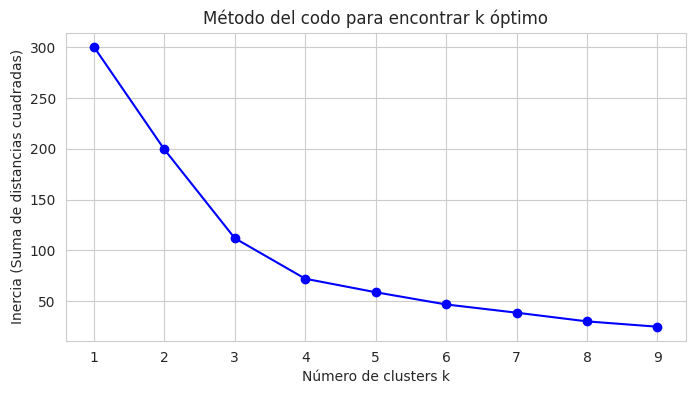

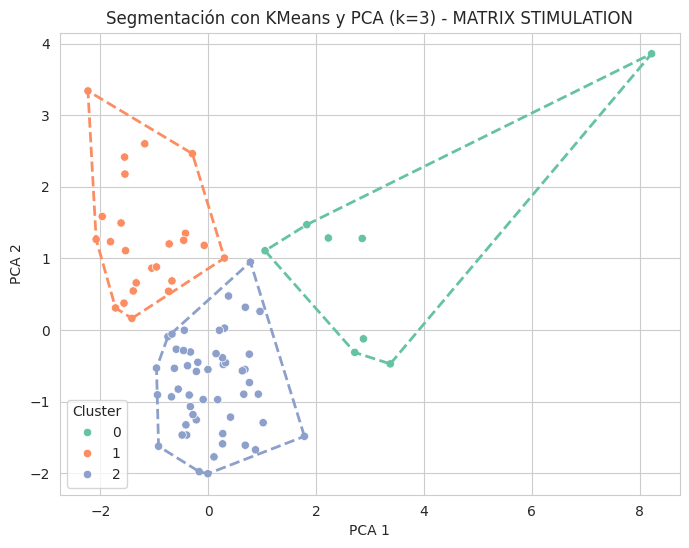

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from scipy.spatial import ConvexHull
import numpy as np

# --- Preparar datos ---
df = historico_actividades.copy()

# Filtrar solo actividad MATRIX STIMULATION
df = df[df['Activity'] == 'MATRIX STIMULATION']

# Filtra o prepara variables numéricas relevantes para segmentar
features = ['BFPD_Before', 'BOPD_Before', 'BSW_Before', 'Pr (psi)', 'Kabs (md)', 'H (ft)']

# Seleccionar variables y eliminar filas con NaNs
X = df[features].dropna()

# Escalar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# --- PCA para reducción ---
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# --- Encontrar número óptimo de clusters con método del codo ---
inertia = []
K_range = range(1, 10)
for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_pca)
    inertia.append(kmeans.inertia_)

plt.figure(figsize=(8, 4))
plt.plot(K_range, inertia, 'bo-')
plt.xlabel('Número de clusters k')
plt.ylabel('Inercia (Suma de distancias cuadradas)')
plt.title('Método del codo para encontrar k óptimo')
plt.grid(True)
plt.show()

# --- Visualizar clusters para un k elegido (ejemplo k=3) ---
k_opt = 3
kmeans = KMeans(n_clusters=k_opt, random_state=42)
clusters = kmeans.fit_predict(X_pca)

plt.figure(figsize=(8, 6))
palette = sns.color_palette("Set2", k_opt)
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=clusters, palette=palette)
plt.title(f'Segmentación con KMeans y PCA (k={k_opt}) - MATRIX STIMULATION')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')

# Dibujar convex hull para cada cluster
for cluster_label in np.unique(clusters):
    points = X_pca[clusters == cluster_label]
    if len(points) >= 3:  # ConvexHull necesita mínimo 3 puntos
        hull = ConvexHull(points)
        hull_points = points[hull.vertices]
        # Cerrar el polígono del hull
        hull_points = np.append(hull_points, [hull_points[0]], axis=0)
        plt.plot(hull_points[:, 0], hull_points[:, 1], color=palette[cluster_label], linestyle='--', linewidth=2)

plt.legend(title='Cluster')
plt.grid(True)
plt.show()

# --- Agregar cluster al dataframe para posteriores análisis ---
df.loc[X.index, 'Cluster'] = clusters



In [ ]:
df.loc[X.index, 'Cluster'] = clusters


In [ ]:
cluster_summary = df.groupby('Cluster')[features].mean()
print(cluster_summary)


         BFPD_Before  BOPD_Before  BSW_Before     Pr (psi)   Kabs (md)  \
Cluster                                                                  
0.0      1102.750000   875.625000   19.875000  3770.625000  199.250000   
1.0       214.250000   187.833333   12.208333  1605.041667  640.666667   
2.0       313.058824   225.803922   21.215686  3597.490196  253.117647   

            H (ft)  
Cluster             
0.0      38.250000  
1.0      37.916667  
2.0      18.862745  


<ipython-input-67-81f35bb3ee3b>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(data=df, x='Cluster', y=feature, inner='quartile', palette='Set2')


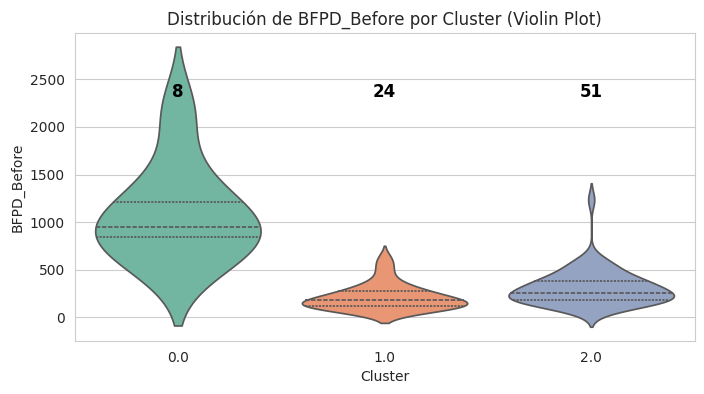

<ipython-input-67-81f35bb3ee3b>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(data=df, x='Cluster', y=feature, inner='quartile', palette='Set2')


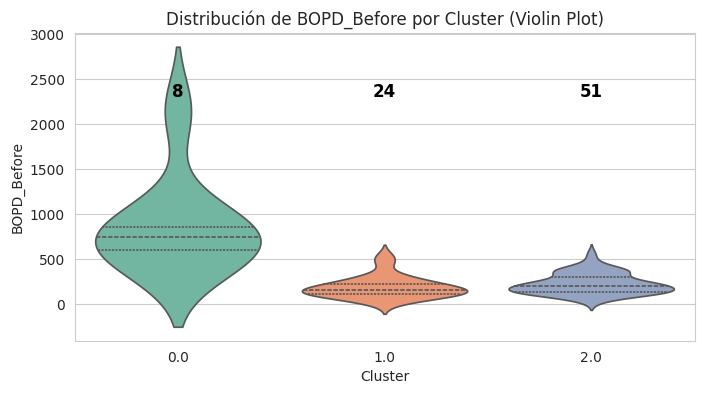

<ipython-input-67-81f35bb3ee3b>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(data=df, x='Cluster', y=feature, inner='quartile', palette='Set2')


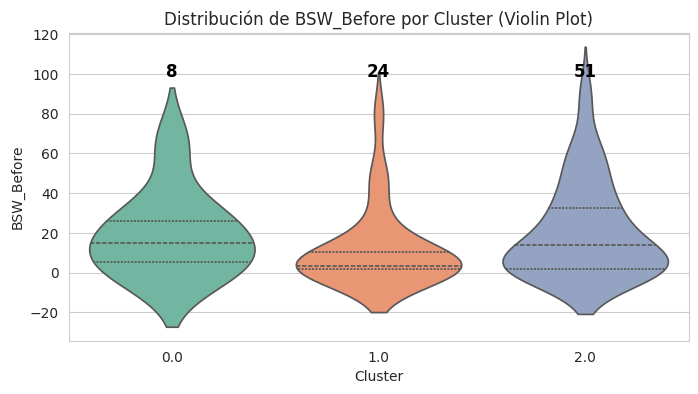

<ipython-input-67-81f35bb3ee3b>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(data=df, x='Cluster', y=feature, inner='quartile', palette='Set2')


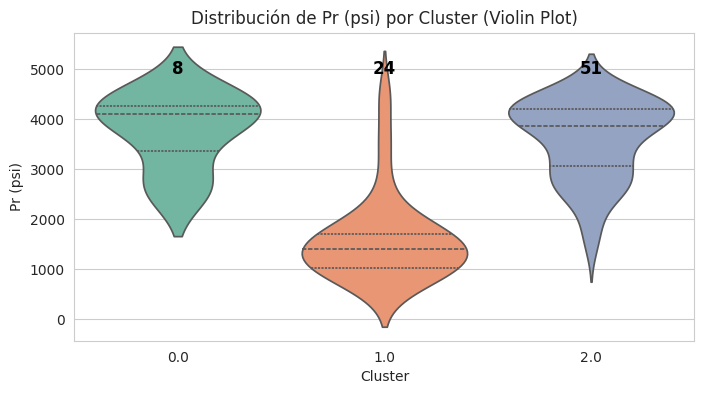

<ipython-input-67-81f35bb3ee3b>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(data=df, x='Cluster', y=feature, inner='quartile', palette='Set2')


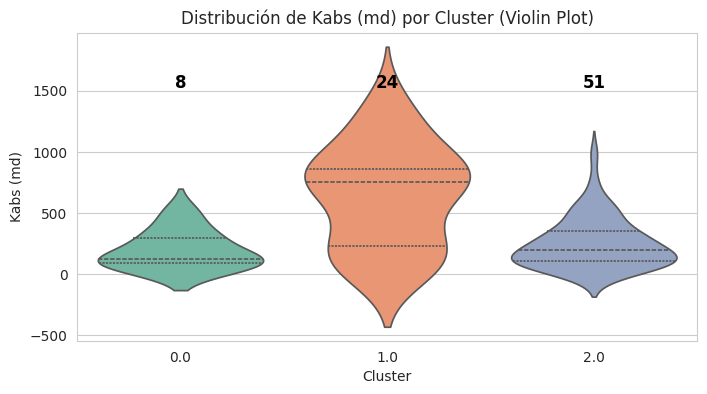

<ipython-input-67-81f35bb3ee3b>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(data=df, x='Cluster', y=feature, inner='quartile', palette='Set2')


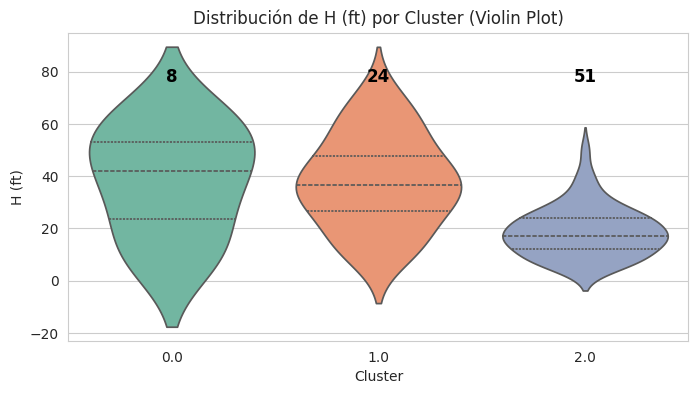

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

for feature in features:
    plt.figure(figsize=(8,4))
    ax = sns.violinplot(data=df, x='Cluster', y=feature, inner='quartile', palette='Set2')
    plt.title(f'Distribución de {feature} por Cluster (Violin Plot)')

    # Calcular conteo por cluster
    counts = df['Cluster'].value_counts().sort_index()

    # Añadir texto con conteos encima de cada violín
    for cluster_idx, count in counts.items():
        ax.text(cluster_idx, df[feature].max()*1.05, str(count), ha='center', va='bottom', fontsize=12, color='black', fontweight='bold')

    plt.show()


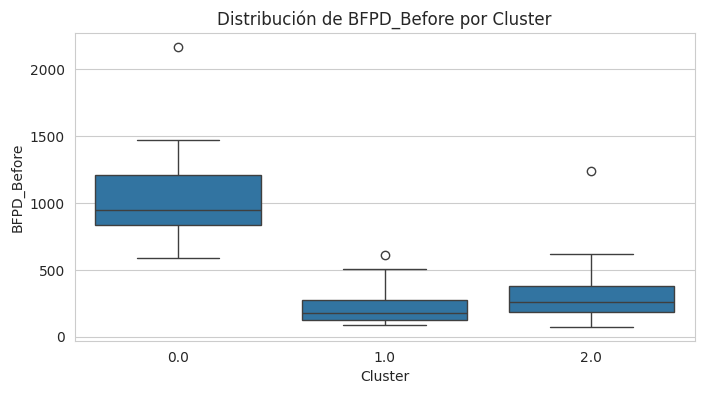

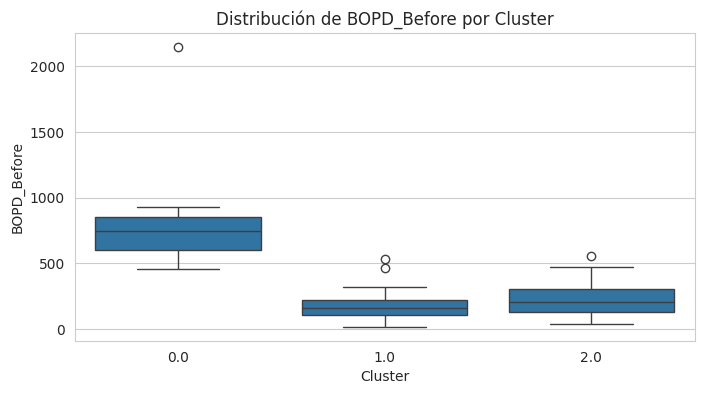

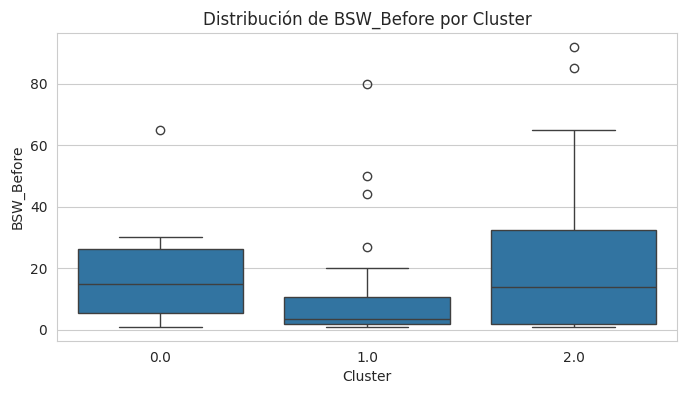

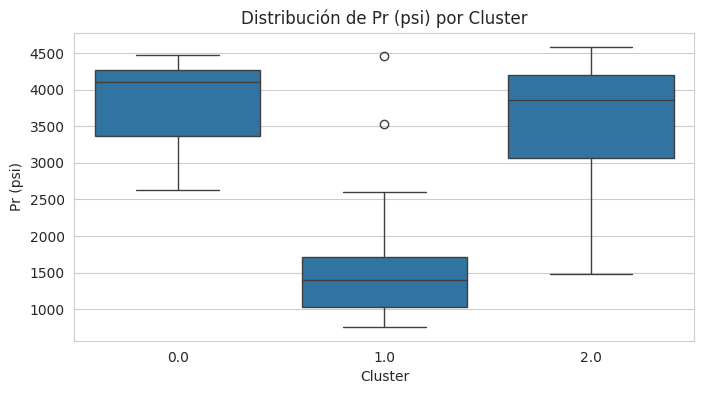

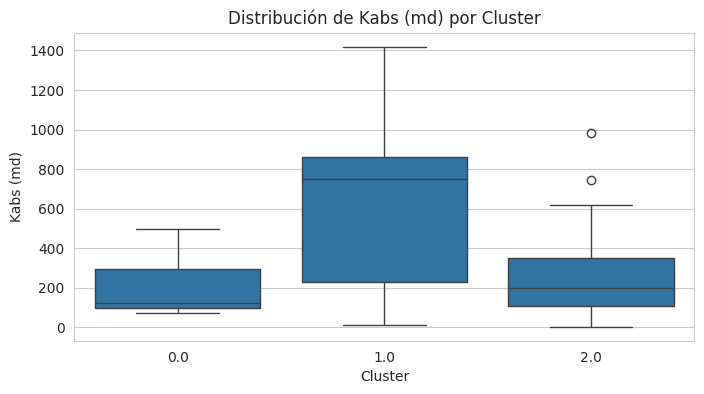

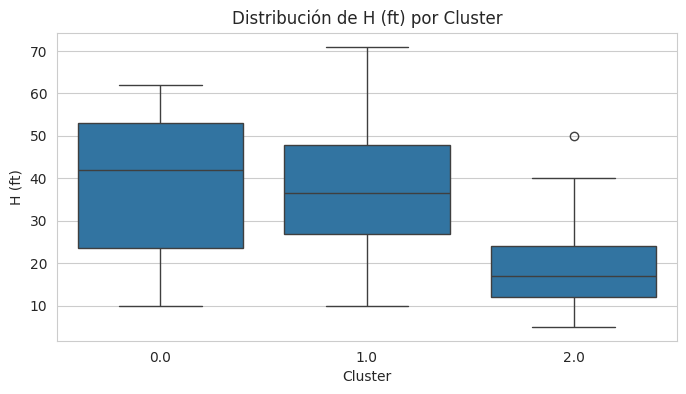

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

for feature in features:
    plt.figure(figsize=(8,4))
    sns.boxplot(data=df, x='Cluster', y=feature)
    plt.title(f'Distribución de {feature} por Cluster')
    plt.show()


<ipython-input-69-85b2ffe8d6a0>:63: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=rf_importances, x='Importance', y='Feature', ax=axes[0], palette='viridis')
<ipython-input-69-85b2ffe8d6a0>:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=kbest_importances, x='Importance', y='Feature', ax=axes[1], palette='magma')


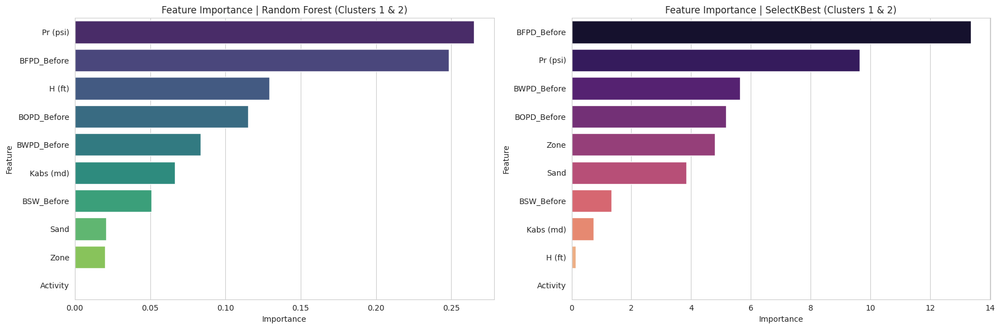

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from category_encoders import TargetEncoder

# --- Suponemos que 'df' ya tiene la columna 'Cluster' asignada ---
# Filtrar solo clusters 1 y 2 para Matrix Stimulation
df_filtered = df[(df['Activity'] == 'MATRIX STIMULATION') & (df['Cluster'].isin([1, 2]))].copy()

# Variables a usar para el modelado
feature_cols = [
    'BFPD_Before', 'BOPD_Before', 'BSW_Before',
    'Pr (psi)', 'Kabs (md)', 'H (ft)',
    'Sand', 'Zone', 'Activity',
    'BWPD_Before'
]
categorical_cols = ['Sand', 'Zone', 'Activity']

# Calcular BWPD_Before si no está
if 'BWPD_Before' not in df_filtered.columns:
    df_filtered['BWPD_Before'] = df_filtered['BFPD_Before'] - df_filtered['BOPD_Before']

# Codificar categóricas con TargetEncoder (target es BFPD_After)
encoder = TargetEncoder(cols=categorical_cols)
df_encoded = df_filtered.copy()
df_encoded[categorical_cols] = encoder.fit_transform(df_filtered[categorical_cols], df_filtered['BFPD_After'])

# Preparar X e y
X = df_encoded[feature_cols]
y = df_encoded['BFPD_After']

# Imputación y escalado
imputer = SimpleImputer(strategy='median')
X_imputed = pd.DataFrame(imputer.fit_transform(X), columns=X.columns)

scaler = StandardScaler()
X_scaled = pd.DataFrame(scaler.fit_transform(X_imputed), columns=X.columns)

# Random Forest para Feature Importance
rf = RandomForestRegressor(n_estimators=200, random_state=42)
rf.fit(X_imputed, y)
rf_importances = pd.DataFrame({
    'Feature': X.columns,
    'Importance': rf.feature_importances_
}).sort_values(by='Importance', ascending=False)

# SelectKBest
kbest = SelectKBest(score_func=f_regression, k='all')
kbest.fit(X_scaled, y)
kbest_importances = pd.DataFrame({
    'Feature': X.columns,
    'Importance': kbest.scores_
}).sort_values(by='Importance', ascending=False)

# Visualización
sns.set_style("whitegrid")
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

sns.barplot(data=rf_importances, x='Importance', y='Feature', ax=axes[0], palette='viridis')
axes[0].set_title("Feature Importance | Random Forest (Clusters 1 & 2)")

sns.barplot(data=kbest_importances, x='Importance', y='Feature', ax=axes[1], palette='magma')
axes[1].set_title("Feature Importance | SelectKBest (Clusters 1 & 2)")

plt.tight_layout()
plt.show()



Random Forest: 2 features
Variables seleccionadas por Random Forest:
['Pr (psi)', 'BFPD_Before']

SelectKBest: 3 features
Variables seleccionadas por SelectKBest:
['BFPD_Before', 'Pr (psi)', 'BWPD_Before']


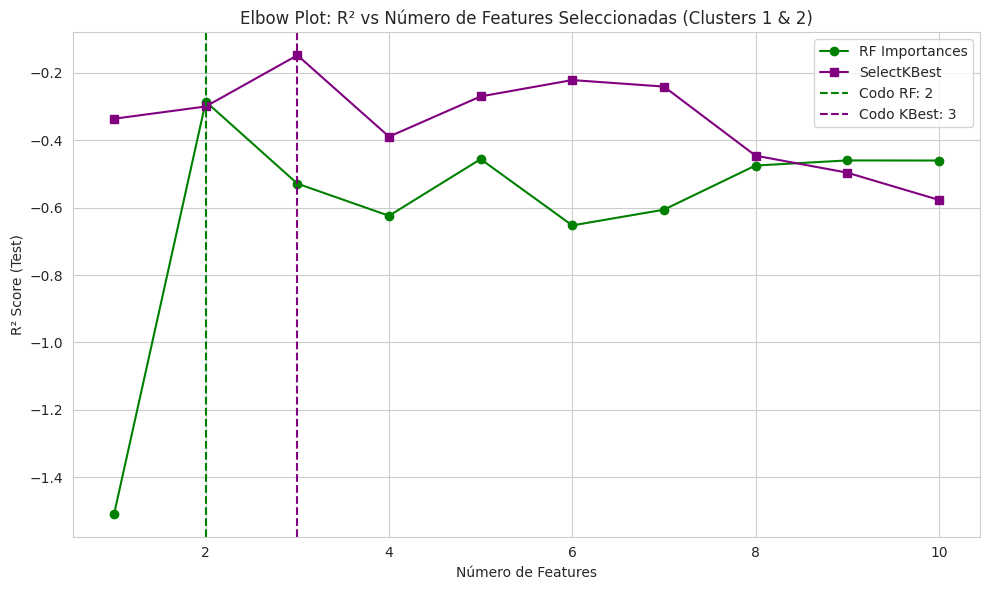

In [ ]:
from kneed import KneeLocator
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt

def elbow_plot_clusters(df_encoded, y, rf_importances, kbest_importances):
    ordered_rf = rf_importances['Feature'].tolist()
    ordered_kbest = kbest_importances['Feature'].tolist()

    max_k = min(12, len(rf_importances))
    r2_rf = []
    r2_kbest = []

    for k in range(1, max_k + 1):
        X_rf_k = df_encoded[ordered_rf[:k]]
        X_kbest_k = df_encoded[ordered_kbest[:k]]

        # Random Forest con top-k features RF
        X_train_rf, X_test_rf, y_train_rf, y_test_rf = train_test_split(X_rf_k, y, test_size=0.2, random_state=42)
        model_rf = RandomForestRegressor(n_estimators=200, random_state=42)
        model_rf.fit(X_train_rf, y_train_rf)
        r2_rf.append(r2_score(y_test_rf, model_rf.predict(X_test_rf)))

        # Random Forest con top-k features SelectKBest
        X_train_k, X_test_k, y_train_k, y_test_k = train_test_split(X_kbest_k, y, test_size=0.2, random_state=42)
        model_k = RandomForestRegressor(n_estimators=200, random_state=42)
        model_k.fit(X_train_k, y_train_k)
        r2_kbest.append(r2_score(y_test_k, model_k.predict(X_test_k)))

    x_vals = list(range(1, max_k + 1))
    knee_rf = KneeLocator(x_vals, r2_rf, curve='concave', direction='increasing').knee
    knee_kbest = KneeLocator(x_vals, r2_kbest, curve='concave', direction='increasing').knee

    print(f"\nRandom Forest: {knee_rf} features")
    print("Variables seleccionadas por Random Forest:")
    print(ordered_rf[:knee_rf])

    print(f"\nSelectKBest: {knee_kbest} features")
    print("Variables seleccionadas por SelectKBest:")
    print(ordered_kbest[:knee_kbest])

    plt.figure(figsize=(10, 6))
    plt.plot(x_vals, r2_rf, marker='o', label='RF Importances', color='green')
    plt.plot(x_vals, r2_kbest, marker='s', label='SelectKBest', color='purple')

    if knee_rf:
        plt.axvline(knee_rf, color='green', linestyle='--', label=f'Codo RF: {knee_rf}')
    if knee_kbest:
        plt.axvline(knee_kbest, color='purple', linestyle='--', label=f'Codo KBest: {knee_kbest}')

    plt.title("Elbow Plot: R² vs Número de Features Seleccionadas (Clusters 1 & 2)")
    plt.xlabel("Número de Features")
    plt.ylabel("R² Score (Test)")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Ejecutar función con tus datos filtrados y resultados de importancia
elbow_plot_clusters(X_imputed, y, rf_importances, kbest_importances)



Procesando Cluster: 1

Random Forest: 1 features
Variables seleccionadas por Random Forest:
['Sand']

SelectKBest: 1 features
Variables seleccionadas por SelectKBest:
['Sand']


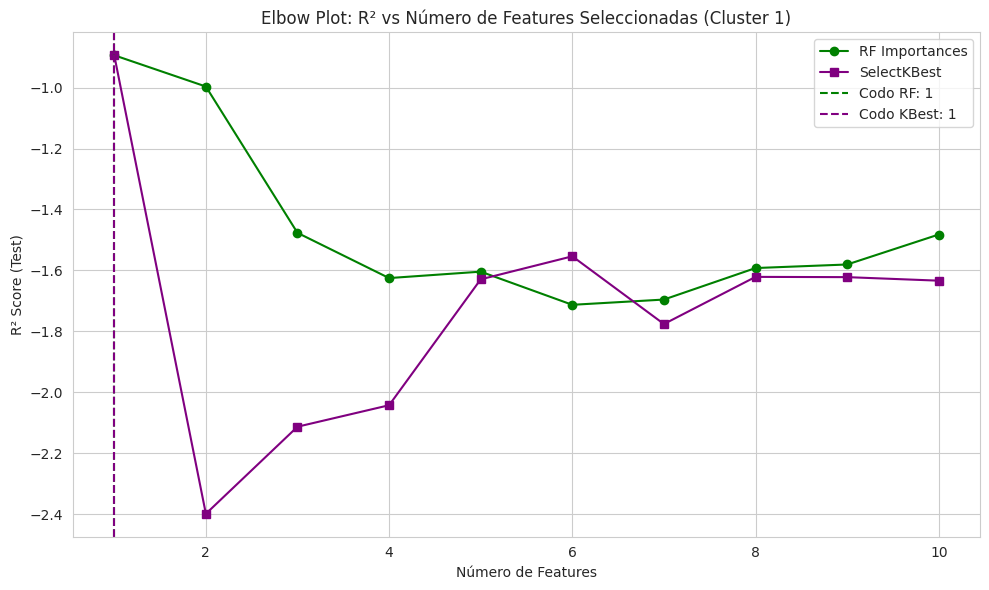


Procesando Cluster: 2

Random Forest: 2 features
Variables seleccionadas por Random Forest:
['Pr (psi)', 'BFPD_Before']

SelectKBest: 2 features
Variables seleccionadas por SelectKBest:
['BFPD_Before', 'Sand']


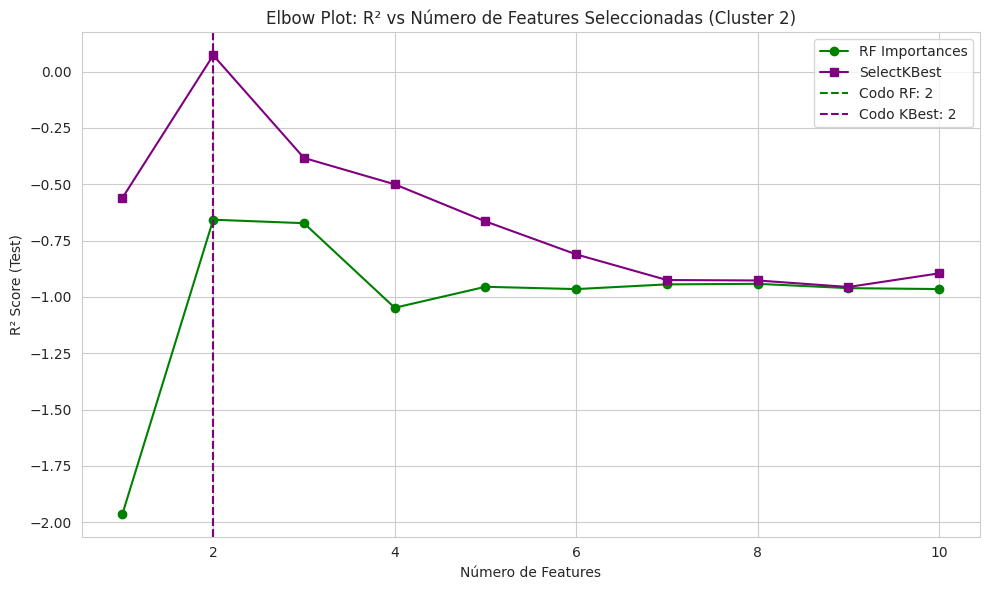

In [ ]:
from kneed import KneeLocator
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from category_encoders import TargetEncoder
import matplotlib.pyplot as plt
import pandas as pd

# Definir columnas de features y categóricas
feature_cols = [
    'BFPD_Before', 'BOPD_Before', 'BSW_Before',
    'Pr (psi)', 'Kabs (md)', 'H (ft)',
    'Sand', 'Zone', 'Activity',
    'BWPD_Before'
]
categorical_cols = ['Sand', 'Zone', 'Activity']

def process_cluster_feature_selection(df, cluster_id):
    print(f"\nProcesando Cluster: {cluster_id}")
    df_cluster = df[df['Cluster'] == cluster_id].copy()

    # Calcular BWPD_Before si no está
    if 'BWPD_Before' not in df_cluster.columns:
        df_cluster['BWPD_Before'] = df_cluster['BFPD_Before'] - df_cluster['BOPD_Before']

    # Codificar categóricas
    encoder = TargetEncoder(cols=categorical_cols)
    df_cluster_encoded = df_cluster.copy()
    df_cluster_encoded[categorical_cols] = encoder.fit_transform(df_cluster[categorical_cols], df_cluster['BFPD_After'])

    # Preparar X e y
    X = df_cluster_encoded[feature_cols]
    y = df_cluster_encoded['BFPD_After']

    # Imputación y escalado
    imputer = SimpleImputer(strategy='median')
    X_imputed = pd.DataFrame(imputer.fit_transform(X), columns=X.columns)

    scaler = StandardScaler()
    X_scaled = pd.DataFrame(scaler.fit_transform(X_imputed), columns=X.columns)

    # RF Feature Importance
    rf = RandomForestRegressor(n_estimators=200, random_state=42)
    rf.fit(X_imputed, y)
    rf_importances = pd.DataFrame({
        'Feature': X.columns,
        'Importance': rf.feature_importances_
    }).sort_values(by='Importance', ascending=False)

    # SelectKBest Feature Scores
    from sklearn.feature_selection import SelectKBest, f_regression
    kbest = SelectKBest(score_func=f_regression, k='all')
    kbest.fit(X_scaled, y)
    kbest_importances = pd.DataFrame({
        'Feature': X.columns,
        'Importance': kbest.scores_
    }).sort_values(by='Importance', ascending=False)

    # Función para gráfico codo
    def elbow_plot_clusters(df_encoded, y, rf_importances, kbest_importances, cluster_id):
        ordered_rf = rf_importances['Feature'].tolist()
        ordered_kbest = kbest_importances['Feature'].tolist()

        max_k = min(12, len(rf_importances))
        r2_rf = []
        r2_kbest = []

        for k in range(1, max_k + 1):
            X_rf_k = df_encoded[ordered_rf[:k]]
            X_kbest_k = df_encoded[ordered_kbest[:k]]

            X_train_rf, X_test_rf, y_train_rf, y_test_rf = train_test_split(X_rf_k, y, test_size=0.2, random_state=42)
            model_rf = RandomForestRegressor(n_estimators=200, random_state=42)
            model_rf.fit(X_train_rf, y_train_rf)
            r2_rf.append(r2_score(y_test_rf, model_rf.predict(X_test_rf)))

            X_train_k, X_test_k, y_train_k, y_test_k = train_test_split(X_kbest_k, y, test_size=0.2, random_state=42)
            model_k = RandomForestRegressor(n_estimators=200, random_state=42)
            model_k.fit(X_train_k, y_train_k)
            r2_kbest.append(r2_score(y_test_k, model_k.predict(X_test_k)))

        x_vals = list(range(1, max_k + 1))
        knee_rf = KneeLocator(x_vals, r2_rf, curve='concave', direction='increasing').knee
        knee_kbest = KneeLocator(x_vals, r2_kbest, curve='concave', direction='increasing').knee

        print(f"\nRandom Forest: {knee_rf} features")
        print("Variables seleccionadas por Random Forest:")
        print(ordered_rf[:knee_rf])

        print(f"\nSelectKBest: {knee_kbest} features")
        print("Variables seleccionadas por SelectKBest:")
        print(ordered_kbest[:knee_kbest])

        plt.figure(figsize=(10, 6))
        plt.plot(x_vals, r2_rf, marker='o', label='RF Importances', color='green')
        plt.plot(x_vals, r2_kbest, marker='s', label='SelectKBest', color='purple')

        if knee_rf:
            plt.axvline(knee_rf, color='green', linestyle='--', label=f'Codo RF: {knee_rf}')
        if knee_kbest:
            plt.axvline(knee_kbest, color='purple', linestyle='--', label=f'Codo KBest: {knee_kbest}')

        plt.title(f"Elbow Plot: R² vs Número de Features Seleccionadas (Cluster {cluster_id})")
        plt.xlabel("Número de Features")
        plt.ylabel("R² Score (Test)")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    elbow_plot_clusters(X_imputed, y, rf_importances, kbest_importances, cluster_id)

# Ejecutar para clusters 1 y 2 del df filtrado (df_filtered)
process_cluster_feature_selection(df_filtered, 1)
process_cluster_feature_selection(df_filtered, 2)


### CONCLUSION PRELIMINAR

- Actualmente, el modelo **no es adecuado para predecir BFPD_After en Matrix Stimulation** con las variables y segmentación actuales.

- Es posible que, **mejorando las variables, aumentando datos o usando otros métodos, la predicción mejore**.

- Como opción práctica, **considera predecir solo en clusters con desempeño razonable y evitar hacerlo donde el error es muy alto**.


# MODELOS DE REGRESION PARA LA ACTIVIDAD DE REPERF

### CASO BASE

PRUEBA CON 5 MODELOS

1. Regresión Lineal
2. Regresión Polinomial grado 2
3. Random Forest
4. XGBoost
5. SVR

In [ ]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error
from category_encoders import TargetEncoder
from sklearn.impute import SimpleImputer
import xgboost as xgb

# --- Preparar dataset (filtrar REPERF) ---
historico_actividades = datasets_corrigidos["Historico de Actividades"]
df_reperf = historico_actividades[historico_actividades['Activity'] == 'REPERF'].copy()

feature_cols = ['BFPD_Before', 'BWPD_Before', 'H (ft)']
categorical_cols = ['Sand', 'Zone', 'Activity']

if 'BWPD_Before' not in df_reperf.columns:
    df_reperf['BWPD_Before'] = df_reperf['BFPD_Before'] - df_reperf['BOPD_Before']

df_reperf.dropna(subset=feature_cols + ['BFPD_After'], inplace=True)

encoder = TargetEncoder(cols=categorical_cols)
df_encoded = df_reperf.copy()
df_encoded[categorical_cols] = encoder.fit_transform(df_reperf[categorical_cols], df_reperf['BFPD_After'])

X = df_encoded[feature_cols]
y = df_encoded['BFPD_After']

imputer = SimpleImputer(strategy='median')
X_imputed = pd.DataFrame(imputer.fit_transform(X), columns=X.columns)

scaler = StandardScaler()
X_scaled = pd.DataFrame(scaler.fit_transform(X_imputed), columns=X.columns)

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# --- Función para evaluar modelos ---
def evaluar_modelo(model, X_train, y_train, X_test, y_test):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    return r2_score(y_test, y_pred), mean_absolute_error(y_test, y_pred)

# --- 1. Regresión Lineal ---
lr = LinearRegression()
r2_lr, mae_lr = evaluar_modelo(lr, X_train, y_train, X_test, y_test)

# --- 2. Regresión Polinomial grado 2 ---
poly = PolynomialFeatures(degree=2)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)
lr_poly = LinearRegression()
r2_poly, mae_poly = evaluar_modelo(lr_poly, X_train_poly, y_train, X_test_poly, y_test)

# --- 3. Random Forest ---
rf = RandomForestRegressor(n_estimators=200, random_state=42)
r2_rf, mae_rf = evaluar_modelo(rf, X_train, y_train, X_test, y_test)

# --- 4. XGBoost ---
xgb_model = xgb.XGBRegressor(n_estimators=200, random_state=42, use_label_encoder=False, eval_metric='rmse')
r2_xgb, mae_xgb = evaluar_modelo(xgb_model, X_train, y_train, X_test, y_test)

# --- 5. SVR ---
svr = SVR(kernel='rbf')
r2_svr, mae_svr = evaluar_modelo(svr, X_train, y_train, X_test, y_test)

# --- Mostrar resultados ---
resultados = pd.DataFrame({
    'Modelo': ['Regresión Lineal', 'Regresión Polinomial', 'Random Forest', 'XGBoost', 'SVR'],
    'R2 Score': [r2_lr, r2_poly, r2_rf, r2_xgb, r2_svr],
    'MAE': [mae_lr, mae_poly, mae_rf, mae_xgb, mae_svr]
})

print(resultados.sort_values(by='R2 Score', ascending=False))




/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [04:55:06] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


                 Modelo  R2 Score         MAE
3               XGBoost  0.711256  231.410583
2         Random Forest  0.643469  261.220000
0      Regresión Lineal  0.640437  250.145672
1  Regresión Polinomial  0.389884  288.147592
4                   SVR -0.048371  373.938216


* **XGBoost** es el modelo que mejor funciona con un R² de 0.71 y el MAE más bajo (231), lo que indica mejor precisión y ajuste.

* **Random Forest** también tiene un desempeño sólido, aunque un poco por debajo de XGBoost.

* **Regresión Lineal** y **Regresión Polinomial* son menos efectivas aquí, especialmente la polinomial que tuvo un R² mucho menor.

* **SVR** no está funcionando bien en este caso, probablemente por la naturaleza de los datos o falta de ajuste de hiperparámetros.

## CASO OPTIMIZADO
Solo se toma XGBOOT y RANDOM FOREST

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_absolute_error, r2_score
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from category_encoders import TargetEncoder

# --- Prepara tu dataset filtrando solo REPERF ---
df_reperf = historico_actividades[historico_actividades['Activity'] == 'REPERF'].copy()

# Feature engineering
df_reperf['BWPD_Before'] = df_reperf['BFPD_Before'] - df_reperf['BOPD_Before']

feature_cols = [
    'BFPD_Before', 'BOPD_Before', 'BSW_Before',
    'Pr (psi)', 'Kabs (md)', 'H (ft)',
    'Sand', 'Zone', 'Activity',
    'BWPD_Before'
]
categorical_cols = ['Sand', 'Zone', 'Activity']

# Codificar variables categóricas
encoder = TargetEncoder(cols=categorical_cols)
df_reperf_encoded = df_reperf.copy()
df_reperf_encoded[categorical_cols] = encoder.fit_transform(df_reperf[categorical_cols], df_reperf['BFPD_After'])

X = df_reperf_encoded[feature_cols]
y = df_reperf_encoded['BFPD_After']

# Imputar y escalar
imputer = SimpleImputer(strategy='median')
X_imputed = pd.DataFrame(imputer.fit_transform(X), columns=X.columns)

scaler = StandardScaler()
X_scaled = pd.DataFrame(scaler.fit_transform(X_imputed), columns=X.columns)

# --- Split para evaluación final ---
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# --- Definir modelos y parámetros para GridSearch ---

# Random Forest
rf = RandomForestRegressor(random_state=42)
param_grid_rf = {
    'n_estimators': [100, 200, 300],
    'max_depth': [5, 10, 20, None],
    'min_samples_split': [2, 5, 10]
}

# XGBoost
xgb = XGBRegressor(random_state=42, objective='reg:squarederror', eval_metric='mae')
param_grid_xgb = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 6, 10],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.7, 1.0]
}

# --- GridSearchCV con validación cruzada (cv=5) ---
grid_rf = GridSearchCV(rf, param_grid_rf, cv=5, scoring='neg_mean_absolute_error', n_jobs=-1, verbose=1)
grid_rf.fit(X_train, y_train)

grid_xgb = GridSearchCV(xgb, param_grid_xgb, cv=5, scoring='neg_mean_absolute_error', n_jobs=-1, verbose=1)
grid_xgb.fit(X_train, y_train)

# --- Resultados ---
print("Random Forest - Mejor score (MAE negativo):", grid_rf.best_score_)
print("Random Forest - Mejores hiperparámetros:", grid_rf.best_params_)

print("XGBoost - Mejor score (MAE negativo):", grid_xgb.best_score_)
print("XGBoost - Mejores hiperparámetros:", grid_xgb.best_params_)

# --- Evaluación en test set ---
y_pred_rf = grid_rf.predict(X_test)
y_pred_xgb = grid_xgb.predict(X_test)

print("\nEvaluación Final en Test Set:")
print("Random Forest R2:", r2_score(y_test, y_pred_rf))
print("Random Forest MAE:", mean_absolute_error(y_test, y_pred_rf))

print("XGBoost R2:", r2_score(y_test, y_pred_xgb))
print("XGBoost MAE:", mean_absolute_error(y_test, y_pred_xgb))


Fitting 5 folds for each of 36 candidates, totalling 180 fits
Fitting 5 folds for each of 54 candidates, totalling 270 fits
Random Forest - Mejor score (MAE negativo): -231.81720260186006
Random Forest - Mejores hiperparámetros: {'max_depth': 20, 'min_samples_split': 10, 'n_estimators': 300}
XGBoost - Mejor score (MAE negativo): -225.86278076171874
XGBoost - Mejores hiperparámetros: {'learning_rate': 0.01, 'max_depth': 6, 'n_estimators': 300, 'subsample': 0.7}

Evaluación Final en Test Set:
Random Forest R2: 0.6752757241683238
Random Forest MAE: 238.2732966186669
XGBoost R2: 0.7276076078414917
XGBoost MAE: 219.11256408691406


## CASO OPTIMIZADO + VARIABLES EXPLICATIVAS

In [ ]:
import numpy as np
import pandas as pd
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_absolute_error, r2_score
from category_encoders import TargetEncoder
from sklearn.impute import SimpleImputer

# --- Preparar datos filtrando solo REPERF ---
df_reperf = historico_actividades[historico_actividades['Activity'] == 'REPERF'].copy()

# Variables y categóricas
feature_cols = [
    'BFPD_Before', 'BOPD_Before', 'BSW_Before',
    'Pr (psi)', 'Kabs (md)', 'H (ft)',
    'Sand', 'Zone', 'Activity',
]
categorical_cols = ['Sand', 'Zone', 'Activity']

# Ingeniería de características
df_reperf['BWPD_Before'] = df_reperf['BFPD_Before'] - df_reperf['BOPD_Before']
feature_cols.append('BWPD_Before')

# Codificar categóricas con TargetEncoder
encoder = TargetEncoder(cols=categorical_cols)
df_reperf_encoded = df_reperf.copy()
df_reperf_encoded[categorical_cols] = encoder.fit_transform(df_reperf[categorical_cols], df_reperf['BFPD_After'])

# Preparar X, y
X = df_reperf_encoded[feature_cols]
y = df_reperf_encoded['BFPD_After']

# Dividir dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Pipeline base
def create_pipeline(model):
    return Pipeline([
        ('imputer', SimpleImputer(strategy='median')),
        ('scaler', StandardScaler()),
        ('feature_selection', SelectKBest(score_func=f_regression)),
        ('model', model)
    ])

# Parámetros para RandomizedSearchCV
param_grid_rf = {
    'feature_selection__k': list(range(1, len(feature_cols) + 1)),
    'model__n_estimators': [100, 200, 300],
    'model__max_depth': [None, 10, 20, 30],
    'model__min_samples_split': [2, 5, 10]
}

param_grid_xgb = {
    'feature_selection__k': list(range(1, len(feature_cols) + 1)),
    'model__n_estimators': [100, 200, 300],
    'model__max_depth': [3, 6, 10],
    'model__learning_rate': [0.01, 0.05, 0.1],
    'model__subsample': [0.6, 0.8, 1.0]
}

# Crear modelos
rf_model = RandomForestRegressor(random_state=42)
xgb_model = XGBRegressor(random_state=42, eval_metric='mae', use_label_encoder=False)

# RandomizedSearch para RF
search_rf = RandomizedSearchCV(
    create_pipeline(rf_model),
    param_distributions=param_grid_rf,
    n_iter=20,
    scoring='neg_mean_absolute_error',
    cv=5,
    verbose=1,
    random_state=42,
    n_jobs=-1
)

# RandomizedSearch para XGB
search_xgb = RandomizedSearchCV(
    create_pipeline(xgb_model),
    param_distributions=param_grid_xgb,
    n_iter=20,
    scoring='neg_mean_absolute_error',
    cv=5,
    verbose=1,
    random_state=42,
    n_jobs=-1
)

# Entrenar RF
search_rf.fit(X_train, y_train)
print("RF Best params:", search_rf.best_params_)

# Evaluar RF
y_pred_rf = search_rf.predict(X_test)
print(f"Random Forest - MAE: {mean_absolute_error(y_test, y_pred_rf):.2f}, R2: {r2_score(y_test, y_pred_rf):.3f}")

# Entrenar XGB
search_xgb.fit(X_train, y_train)
print("XGB Best params:", search_xgb.best_params_)

# Evaluar XGB
y_pred_xgb = search_xgb.predict(X_test)
print(f"XGBoost - MAE: {mean_absolute_error(y_test, y_pred_xgb):.2f}, R2: {r2_score(y_test, y_pred_xgb):.3f}")


Fitting 5 folds for each of 20 candidates, totalling 100 fits
RF Best params: {'model__n_estimators': 300, 'model__min_samples_split': 5, 'model__max_depth': 10, 'feature_selection__k': 9}
Random Forest - MAE: 241.08, R2: 0.677
Fitting 5 folds for each of 20 candidates, totalling 100 fits
XGB Best params: {'model__subsample': 0.8, 'model__n_estimators': 200, 'model__max_depth': 6, 'model__learning_rate': 0.1, 'feature_selection__k': 10}
XGBoost - MAE: 229.41, R2: 0.708


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [04:57:20] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


## Red Neuronal Feedforward (MLP - Multi-layer Perceptron) con Keras (TensorFlow backend).

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from category_encoders import TargetEncoder
from sklearn.metrics import mean_absolute_error, r2_score

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping

# Preparar datos filtrando REPERF
df_reperf = historico_actividades[historico_actividades['Activity'] == 'REPERF'].copy()

# Ingeniería de características
df_reperf['BWPD_Before'] = df_reperf['BFPD_Before'] - df_reperf['BOPD_Before']

# Variables y categóricas
feature_cols = [
    'BFPD_Before', 'BOPD_Before', 'BSW_Before',
    'Pr (psi)', 'Kabs (md)', 'H (ft)',
    'Sand', 'Zone', 'Activity',
    'BWPD_Before'
]
categorical_cols = ['Sand', 'Zone', 'Activity']

# Codificar variables categóricas
encoder = TargetEncoder(cols=categorical_cols)
df_reperf_encoded = df_reperf.copy()
df_reperf_encoded[categorical_cols] = encoder.fit_transform(df_reperf[categorical_cols], df_reperf['BFPD_After'])

# Preparar X, y
X = df_reperf_encoded[feature_cols]
y = df_reperf_encoded['BFPD_After']

# Imputar y escalar
imputer = SimpleImputer(strategy='median')
X_imputed = pd.DataFrame(imputer.fit_transform(X), columns=X.columns)

scaler = StandardScaler()
X_scaled = pd.DataFrame(scaler.fit_transform(X_imputed), columns=X.columns)

# Dividir en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Crear modelo MLP
model = Sequential([
    Dense(64, activation='relu', input_shape=(X_train.shape[1],)),
    Dropout(0.2),
    Dense(32, activation='relu'),
    Dropout(0.1),
    Dense(1)  # Output para regresión
])

model.compile(optimizer='adam', loss='mean_absolute_error')

# Early stopping para evitar overfitting
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Entrenar modelo
history = model.fit(
    X_train, y_train,
    validation_split=0.2,
    epochs=100,
    batch_size=32,
    callbacks=[early_stop],
    verbose=1
)

# Evaluar modelo
y_pred = model.predict(X_test).flatten()

mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"MLP Neural Network - MAE: {mae:.2f}, R2: {r2:.3f}")


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 192ms/step - loss: 561.1028 - val_loss: 557.7534
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 570.9529 - val_loss: 557.6213
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 571.0556 - val_loss: 557.4897
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 575.3799 - val_loss: 557.3588
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 578.6395 - val_loss: 557.2275
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 553.0815 - val_loss: 557.0934
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 518.7328 - val_loss: 556.9545
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 568.2089 - val_loss: 556.8091
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 581.4484 - val_loss: 556.6500
Epoch 10/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 552.8615 - val_loss: 556.4771
Epoch 11/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 577.8380 - val_loss: 556.2912
Epoch 12/100
3/3 ━━━━━━━━━━━━

<ipython-input-76-9f9791dcd5bc>:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=rf_importances, x='Importance', y='Feature', ax=axes[0], palette='viridis')
<ipython-input-76-9f9791dcd5bc>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=kbest_importances, x='Importance', y='Feature', ax=axes[1], palette='magma')


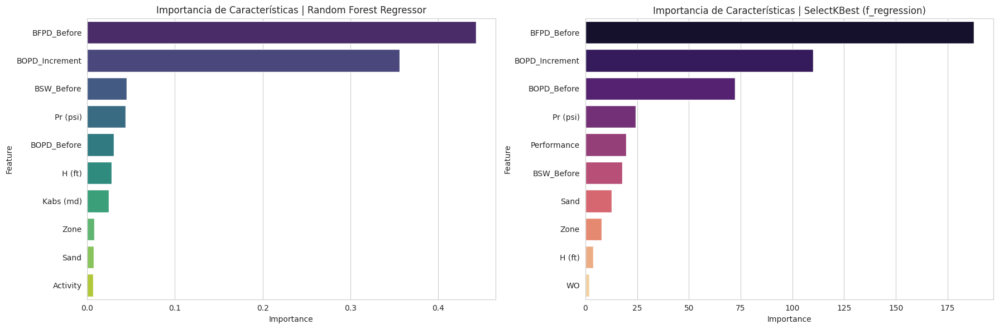

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, LabelEncoder
from category_encoders import TargetEncoder

# --- Cargar y filtrar dataset ---
historico_actividades = datasets_corrigidos["Historico de Actividades"]
actividades_validas = ['REPERF', 'ADD INTERVALS', 'MATRIX STIMULATION', 'PURE']
df = historico_actividades[historico_actividades['Activity'].isin(actividades_validas)].copy()
df.drop(columns=['Well', 'Date'], inplace=True, errors='ignore')

# --- Eliminar NaNs en variables críticas ---
variables_criticas = ['BFPD_Before', 'Pr (psi)', 'Kabs (md)', 'H (ft)', 'BFPD_After']
df.dropna(subset=variables_criticas, inplace=True)

# --- Guardar variable target y eliminar columnas con "After" y "Wellbore" ---
y = df['BFPD_After']
df = df[[col for col in df.columns if "After" not in col and col != 'Wellbore']]

# --- Codificar variables categóricas ---
# Activity: LabelEncoder (es ordinal en este caso)
df['Activity'] = LabelEncoder().fit_transform(df['Activity'])

# Sand, Zone y Performance: Target Encoding
target_encoder = TargetEncoder(cols=['Sand', 'Zone','Performance'])
df[['Sand', 'Zone','Performance']] = target_encoder.fit_transform(df[['Sand', 'Zone','Performance']], y)

# Separar X
X = df.drop(columns=['BFPD_After'], errors='ignore')

# --- Imputación + Escalado ---
imputer = SimpleImputer(strategy='median')
X_imputed = pd.DataFrame(imputer.fit_transform(X), columns=X.columns)

scaler = StandardScaler()
X_scaled = pd.DataFrame(scaler.fit_transform(X_imputed), columns=X.columns)

# --- Feature Importance con Random Forest ---
rf = RandomForestRegressor(n_estimators=200, random_state=42)
rf.fit(X_imputed, y)
rf_importances = pd.DataFrame({
    'Feature': X.columns,
    'Importance': rf.feature_importances_
}).sort_values(by='Importance', ascending=False).head(10)

# --- Feature Importance con SelectKBest ---
kbest = SelectKBest(score_func=f_regression, k='all')
kbest.fit(X_scaled, y)
kbest_importances = pd.DataFrame({
    'Feature': X.columns,
    'Importance': kbest.scores_
}).sort_values(by='Importance', ascending=False).head(10)

# --- Visualización ---
sns.set_style("whitegrid")
fig, axes = plt.subplots(1, 2, figsize=(18, 6))
sns.barplot(data=rf_importances, x='Importance', y='Feature', ax=axes[0], palette='viridis')
axes[0].set_title("Importancia de Características | Random Forest Regressor")
sns.barplot(data=kbest_importances, x='Importance', y='Feature', ax=axes[1], palette='magma')
axes[1].set_title("Importancia de Características | SelectKBest (f_regression)")
plt.tight_layout()
plt.show()


#ANALISIS DE RESULTADOS

La diferencia en la escala entre los resultados de Random Forest y SelectKBest (f_regression) es completamente normal y se debe a que cada método calcula la importancia de las variables de forma distinta y con unidades distintas.


| Método                      | Qué mide                          | Rango típico de valores     | ¿Por qué varía la escala?                                     |
|----------------------------|-----------------------------------|-----------------------------|----------------------------------------------------------------|
| Random Forest Regressor    | Reducción de impureza (MSE)       | Entre 0 y 1 (suma ≈ 1)      | Es una proporción de la mejora en el modelo                   |
| SelectKBest (f_regression) | F-statistic (F-score)             | Puede ser cualquier valor > 0 | Es una estadística que mide la relación lineal                 |


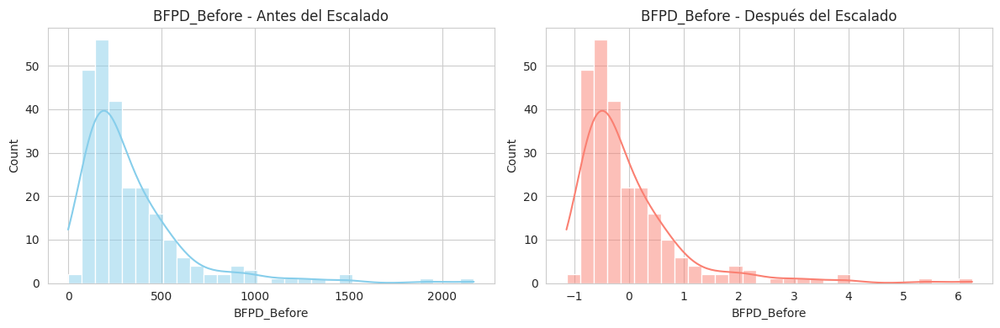

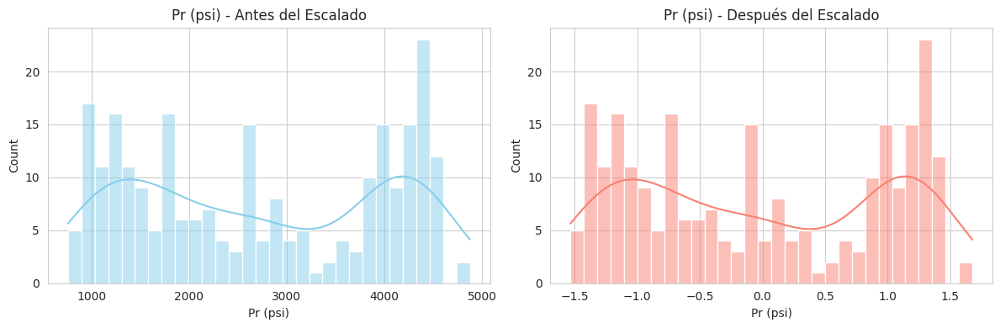

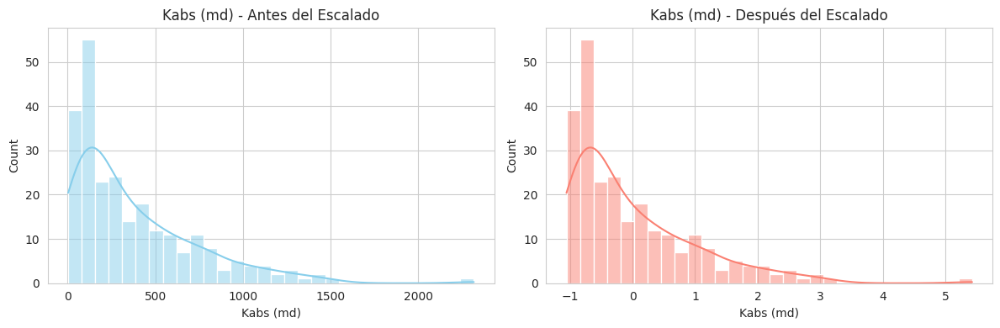

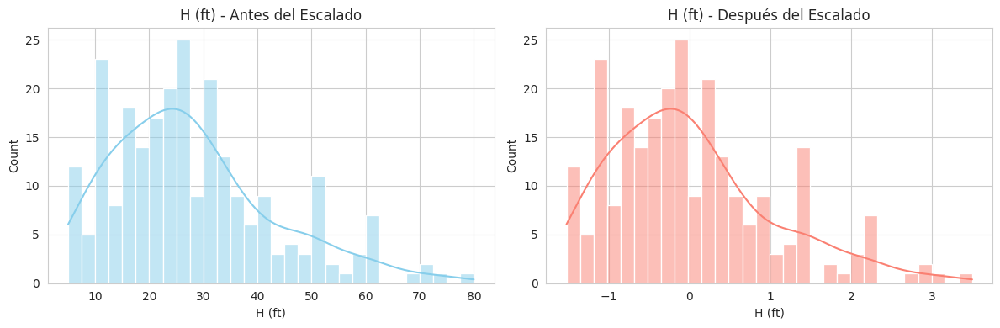

In [ ]:
import matplotlib.pyplot as plt

# Elegir algunas variables numéricas para visualizar
features_to_plot = ['BFPD_Before', 'Pr (psi)', 'Kabs (md)', 'H (ft)']

# Comparar antes (X_imputed) vs después (X_scaled)
for feature in features_to_plot:
    plt.figure(figsize=(12, 4))

    # Antes del escalado
    plt.subplot(1, 2, 1)
    sns.histplot(X_imputed[feature], kde=True, bins=30, color='skyblue')
    plt.title(f'{feature} - Antes del Escalado')

    # Después del escalado
    plt.subplot(1, 2, 2)
    sns.histplot(X_scaled[feature], kde=True, bins=30, color='salmon')
    plt.title(f'{feature} - Después del Escalado')

    plt.tight_layout()
    plt.show()


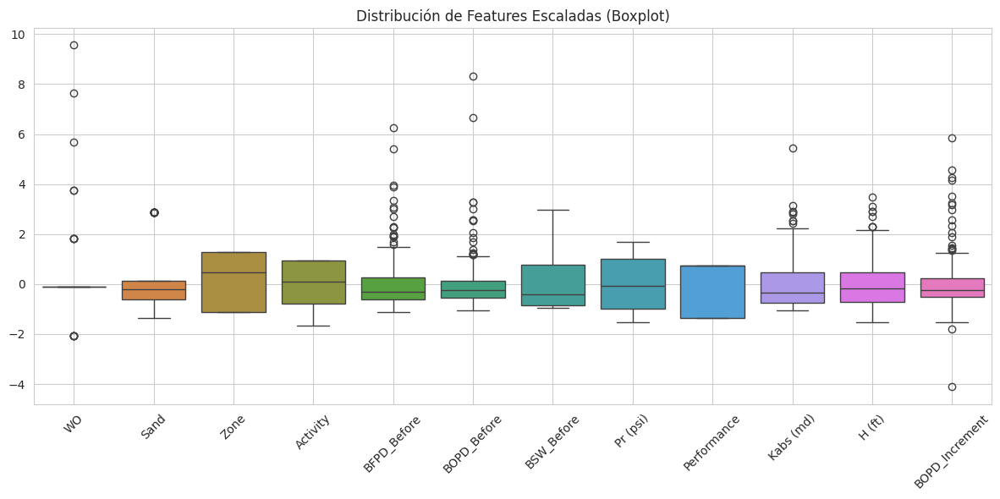

In [ ]:
# Boxplot de todas las variables escaladas
plt.figure(figsize=(12, 6))
sns.boxplot(data=X_scaled)
plt.title("Distribución de Features Escaladas (Boxplot)")
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()


AGREGAR UNA GRAFICA DE CODO DE r2 vs # features PARA LA SELECCION DE features y ver como se satura


OJO : REVISAR Diminishing returns .

In [ ]:
pip install kneed


In [ ]:
# Asegúrate de rehacer esto completo (sin .head() todavía)
rf_importances = pd.DataFrame({
    'Feature': X.columns,
    'Importance': rf.feature_importances_
}).sort_values(by='Importance', ascending=False)

kbest_importances = pd.DataFrame({
    'Feature': X.columns,
    'Importance': kbest.scores_
}).sort_values(by='Importance', ascending=False)




 Random Forest: 3 features
Variables seleccionadas por Random Forest:
['BFPD_Before', 'BOPD_Increment', 'BSW_Before']

 SelectKBest: 3 features
Variables seleccionadas por SelectKBest:
['BFPD_Before', 'BOPD_Increment', 'BOPD_Before']


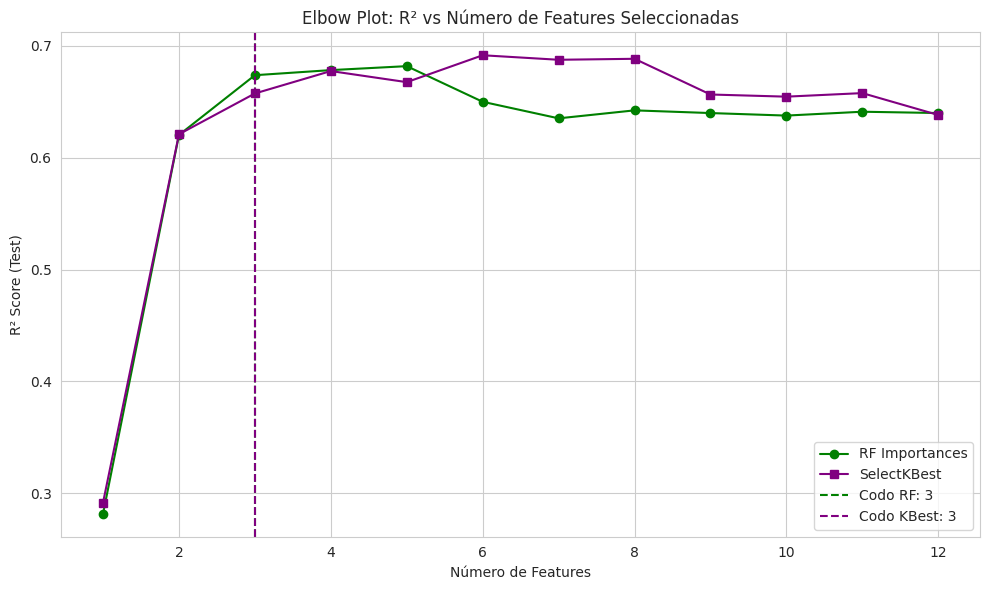

In [ ]:
from kneed import KneeLocator
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
import numpy as np

# --- Obtener ranking completo de features por cada método ---
ordered_rf = rf_importances['Feature'].tolist()
ordered_kbest = kbest_importances['Feature'].tolist()

# --- Evaluar R² por cantidad de features ---
max_k = min(12, len(X.columns))
r2_rf = []
r2_kbest = []

for k in range(1, max_k + 1):
    # Top-k features por cada método
    X_rf_k = X_imputed[ordered_rf[:k]]
    X_kbest_k = X_scaled[ordered_kbest[:k]]

    # Random Forest con features por RF
    X_train, X_test, y_train, y_test = train_test_split(X_rf_k, y, test_size=0.2, random_state=42)
    model = RandomForestRegressor(n_estimators=200, random_state=42)
    model.fit(X_train, y_train)
    r2_rf.append(r2_score(y_test, model.predict(X_test)))

    # Random Forest con features por SelectKBest
    X_train, X_test, y_train, y_test = train_test_split(X_kbest_k, y, test_size=0.2, random_state=42)
    model = RandomForestRegressor(n_estimators=200, random_state=42)
    model.fit(X_train, y_train)
    r2_kbest.append(r2_score(y_test, model.predict(X_test)))

# --- Detectar puntos de codo ---
x_vals = list(range(1, max_k + 1))
knee_rf = KneeLocator(x_vals, r2_rf, curve='concave', direction='increasing').knee
knee_kbest = KneeLocator(x_vals, r2_kbest, curve='concave', direction='increasing').knee

# --- Mostrar resultados ---
print(f"\n Random Forest: {knee_rf} features")
print("Variables seleccionadas por Random Forest:")
print(ordered_rf[:knee_rf])

print(f"\n SelectKBest: {knee_kbest} features")
print("Variables seleccionadas por SelectKBest:")
print(ordered_kbest[:knee_kbest])

# --- Graficar curva de codo ---
plt.figure(figsize=(10, 6))
plt.plot(x_vals, r2_rf, marker='o', label='RF Importances', color='green')
plt.plot(x_vals, r2_kbest, marker='s', label='SelectKBest', color='purple')

# Líneas verticales del codo
if knee_rf:
    plt.axvline(knee_rf, color='green', linestyle='--', label=f'Codo RF: {knee_rf}')
if knee_kbest:
    plt.axvline(knee_kbest, color='purple', linestyle='--', label=f'Codo KBest: {knee_kbest}')

plt.title("Elbow Plot: R² vs Número de Features Seleccionadas")
plt.xlabel("Número de Features")
plt.ylabel("R² Score (Test)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


**CONCLUSIONES**

*   La gráfica muestra cómo mejora el modelo (R²) al agregar más variables.
*   Hasta 3 variables, el R² sube bastante → el modelo aprende mucho con pocas variables.
*   A partir de la 4ta variable, el R² ya no mejora tanto → la curva se aplana.
*   el algoritmo detecta el codo (knee) en 3, no en 4: ahí es donde los beneficios empiezan a disminuir.
*    diminishing returns: agregar más features ya no ayuda mucho y solo aumenta la complejidad del modelo.
*     3 variables ya se logra un buen equilibrio entre rendimiento y simplicidad.



##Regresion Lineal

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
import numpy as np

# --- Definir Top-3 features según cada método ---
top3_kbest = ordered_kbest[:3]
top3_rf = ordered_rf[:3]

# --- Crear datasets finales ---
X_kbest_3 = X_scaled[top3_kbest]
X_rf_3 = X_imputed[top3_rf]

# --- Modelo con SelectKBest ---
X_train_kb, X_test_kb, y_train_kb, y_test_kb = train_test_split(X_kbest_3, y, test_size=0.2, random_state=42)
model_kb = LinearRegression()
model_kb.fit(X_train_kb, y_train_kb)
y_pred_kb = model_kb.predict(X_test_kb)

r2_kb = r2_score(y_test_kb, y_pred_kb)
rmse_kb = np.sqrt(mean_squared_error(y_test_kb, y_pred_kb))
mae_kb = mean_absolute_error(y_test_kb, y_pred_kb)

# --- Modelo con RandomForest.importances ---
X_train_rf, X_test_rf, y_train_rf, y_test_rf = train_test_split(X_rf_3, y, test_size=0.2, random_state=42)
model_rf = LinearRegression()
model_rf.fit(X_train_rf, y_train_rf)
y_pred_rf = model_rf.predict(X_test_rf)

r2_rf = r2_score(y_test_rf, y_pred_rf)
rmse_rf = np.sqrt(mean_squared_error(y_test_rf, y_pred_rf))
mae_rf = mean_absolute_error(y_test_rf, y_pred_rf)

# --- Imprimir comparación ---
print("\n Modelo de Regresión Lineal con Top-3 Features\n")

print("SelectKBest:")
print(f"Variables: {top3_kbest}")
print(f"R²   : {r2_kb:.3f}")
print(f"RMSE : {rmse_kb:.2f}")
print(f"MAE  : {mae_kb:.2f}")

print("RandomForest:")
print(f"Variables: {top3_rf}")
print(f"R²   : {r2_rf:.3f}")
print(f"RMSE : {rmse_rf:.2f}")
print(f"MAE  : {mae_rf:.2f}")



 Modelo de Regresión Lineal con Top-3 Features

SelectKBest:
Variables: ['BFPD_Before', 'BOPD_Increment', 'BOPD_Before']
R²   : 0.817
RMSE : 264.56
MAE  : 178.65
RandomForest:
Variables: ['BFPD_Before', 'BOPD_Increment', 'BSW_Before']
R²   : 0.794
RMSE : 280.16
MAE  : 179.59


In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
import numpy as np

# --- Definir Top-4 features según cada método ---
top3_kbest = ordered_kbest[:4]
top3_rf = ordered_rf[:4]

# --- Crear datasets finales ---
X_kbest_3 = X_scaled[top3_kbest]
X_rf_3 = X_imputed[top3_rf]

# --- Modelo con SelectKBest ---
X_train_kb, X_test_kb, y_train_kb, y_test_kb = train_test_split(X_kbest_3, y, test_size=0.2, random_state=42)
model_kb = LinearRegression()
model_kb.fit(X_train_kb, y_train_kb)
y_pred_kb = model_kb.predict(X_test_kb)

r2_kb = r2_score(y_test_kb, y_pred_kb)
rmse_kb = np.sqrt(mean_squared_error(y_test_kb, y_pred_kb))
mae_kb = mean_absolute_error(y_test_kb, y_pred_kb)

# --- Modelo con RandomForest.importances ---
X_train_rf, X_test_rf, y_train_rf, y_test_rf = train_test_split(X_rf_3, y, test_size=0.2, random_state=42)
model_rf = LinearRegression()
model_rf.fit(X_train_rf, y_train_rf)
y_pred_rf = model_rf.predict(X_test_rf)

r2_rf = r2_score(y_test_rf, y_pred_rf)
rmse_rf = np.sqrt(mean_squared_error(y_test_rf, y_pred_rf))
mae_rf = mean_absolute_error(y_test_rf, y_pred_rf)

# --- Imprimir comparación ---
print("\n Modelo de Regresión Lineal con Top-4 Features\n")

print("SelectKBest:")
print(f"Variables: {top3_kbest}")
print(f"R²   : {r2_kb:.3f}")
print(f"RMSE : {rmse_kb:.2f}")
print(f"MAE  : {mae_kb:.2f}")

print("RandomForest:")
print(f"Variables: {top3_rf}")
print(f"R²   : {r2_rf:.3f}")
print(f"RMSE : {rmse_rf:.2f}")
print(f"MAE  : {mae_rf:.2f}")



 Modelo de Regresión Lineal con Top-4 Features

SelectKBest:
Variables: ['BFPD_Before', 'BOPD_Increment', 'BOPD_Before', 'Pr (psi)']
R²   : 0.819
RMSE : 263.28
MAE  : 168.47
RandomForest:
Variables: ['BFPD_Before', 'BOPD_Increment', 'BSW_Before', 'Pr (psi)']
R²   : 0.795
RMSE : 279.54
MAE  : 172.60


In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
import numpy as np

# --- Definir Top-5 features según cada método ---
top3_kbest = ordered_kbest[:5]
top3_rf = ordered_rf[:5]

# --- Crear datasets finales ---
X_kbest_3 = X_scaled[top3_kbest]
X_rf_3 = X_imputed[top3_rf]

# --- Modelo con SelectKBest ---
X_train_kb, X_test_kb, y_train_kb, y_test_kb = train_test_split(X_kbest_3, y, test_size=0.2, random_state=42)
model_kb = LinearRegression()
model_kb.fit(X_train_kb, y_train_kb)
y_pred_kb = model_kb.predict(X_test_kb)

r2_kb = r2_score(y_test_kb, y_pred_kb)
rmse_kb = np.sqrt(mean_squared_error(y_test_kb, y_pred_kb))
mae_kb = mean_absolute_error(y_test_kb, y_pred_kb)

# --- Modelo con RandomForest.importances ---
X_train_rf, X_test_rf, y_train_rf, y_test_rf = train_test_split(X_rf_3, y, test_size=0.2, random_state=42)
model_rf = LinearRegression()
model_rf.fit(X_train_rf, y_train_rf)
y_pred_rf = model_rf.predict(X_test_rf)

r2_rf = r2_score(y_test_rf, y_pred_rf)
rmse_rf = np.sqrt(mean_squared_error(y_test_rf, y_pred_rf))
mae_rf = mean_absolute_error(y_test_rf, y_pred_rf)

# --- Imprimir comparación ---
print("\n Modelo de Regresión Lineal con Top-5 Features\n")

print("SelectKBest:")
print(f"Variables: {top3_kbest}")
print(f"R²   : {r2_kb:.3f}")
print(f"RMSE : {rmse_kb:.2f}")
print(f"MAE  : {mae_kb:.2f}")

print("RandomForest:")
print(f"Variables: {top3_rf}")
print(f"R²   : {r2_rf:.3f}")
print(f"RMSE : {rmse_rf:.2f}")
print(f"MAE  : {mae_rf:.2f}")



 Modelo de Regresión Lineal con Top-5 Features

SelectKBest:
Variables: ['BFPD_Before', 'BOPD_Increment', 'BOPD_Before', 'Pr (psi)', 'Performance']
R²   : 0.829
RMSE : 255.68
MAE  : 164.53
RandomForest:
Variables: ['BFPD_Before', 'BOPD_Increment', 'BSW_Before', 'Pr (psi)', 'BOPD_Before']
R²   : 0.790
RMSE : 283.47
MAE  : 174.45


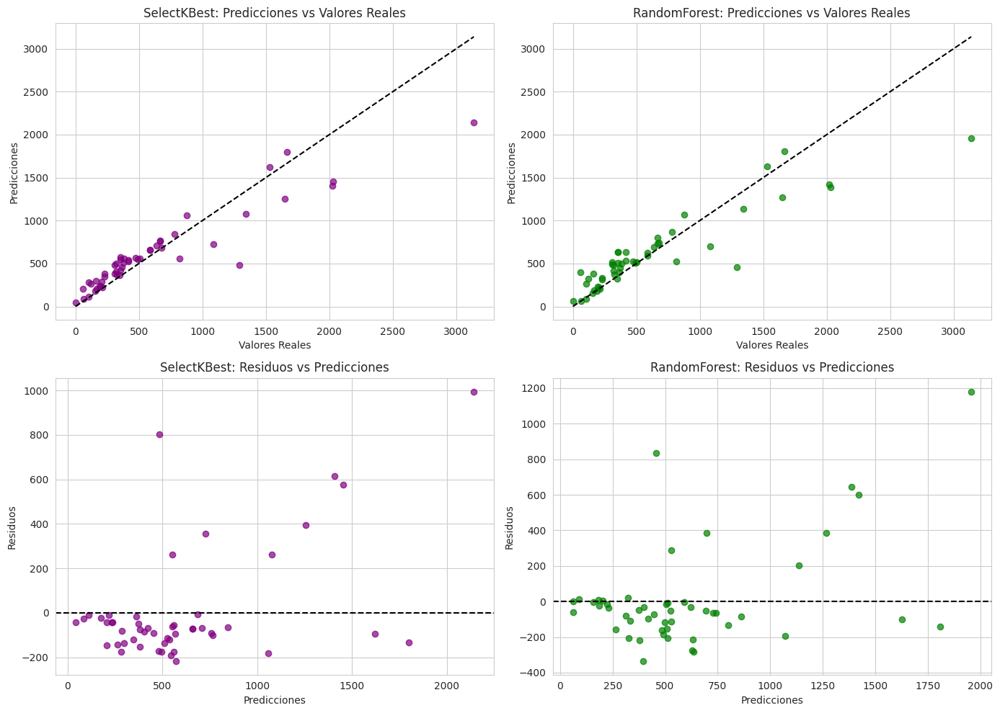

In [ ]:
import matplotlib.pyplot as plt

# --- Calcular residuos ---
residuos_kb = y_test_kb - y_pred_kb
residuos_rf = y_test_rf - y_pred_rf

# --- Crear figuras comparativas ---
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# --- SelectKBest: Predicciones vs Reales ---
axes[0, 0].scatter(y_test_kb, y_pred_kb, color='purple', alpha=0.7, label='SelectKBest')
axes[0, 0].plot([y_test_kb.min(), y_test_kb.max()], [y_test_kb.min(), y_test_kb.max()], 'k--')
axes[0, 0].set_xlabel("Valores Reales")
axes[0, 0].set_ylabel("Predicciones")
axes[0, 0].set_title("SelectKBest: Predicciones vs Valores Reales")

# --- RandomForest: Predicciones vs Reales ---
axes[0, 1].scatter(y_test_rf, y_pred_rf, color='green', alpha=0.7, label='RandomForest')
axes[0, 1].plot([y_test_rf.min(), y_test_rf.max()], [y_test_rf.min(), y_test_rf.max()], 'k--')
axes[0, 1].set_xlabel("Valores Reales")
axes[0, 1].set_ylabel("Predicciones")
axes[0, 1].set_title("RandomForest: Predicciones vs Valores Reales")

# --- SelectKBest: Residuos vs Predicciones ---
axes[1, 0].scatter(y_pred_kb, residuos_kb, color='purple', alpha=0.7)
axes[1, 0].axhline(0, linestyle='--', color='black')
axes[1, 0].set_xlabel("Predicciones")
axes[1, 0].set_ylabel("Residuos")
axes[1, 0].set_title("SelectKBest: Residuos vs Predicciones")

# --- RandomForest: Residuos vs Predicciones ---
axes[1, 1].scatter(y_pred_rf, residuos_rf, color='green', alpha=0.7)
axes[1, 1].axhline(0, linestyle='--', color='black')
axes[1, 1].set_xlabel("Predicciones")
axes[1, 1].set_ylabel("Residuos")
axes[1, 1].set_title("RandomForest: Residuos vs Predicciones")

plt.tight_layout()
plt.show()


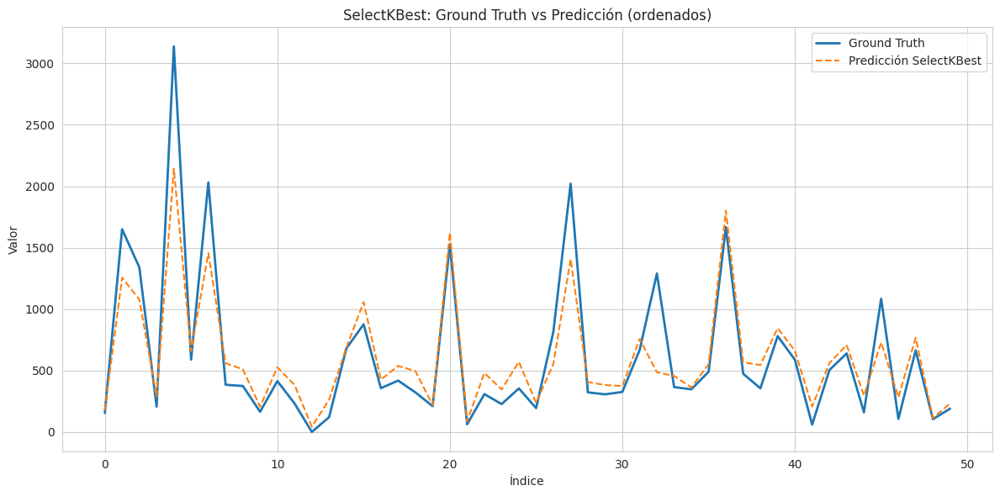

In [ ]:
# --- Crear gráfico de series: Ground Truth vs Predicción (SelectKBest) ---
plt.figure(figsize=(12, 6))
plt.plot(y_test_kb.reset_index(drop=True), label='Ground Truth', linewidth=2)
plt.plot(pd.Series(y_pred_kb).reset_index(drop=True), label='Predicción SelectKBest', linestyle='--')
plt.title("SelectKBest: Ground Truth vs Predicción (ordenados)")
plt.xlabel("Índice")
plt.ylabel("Valor")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


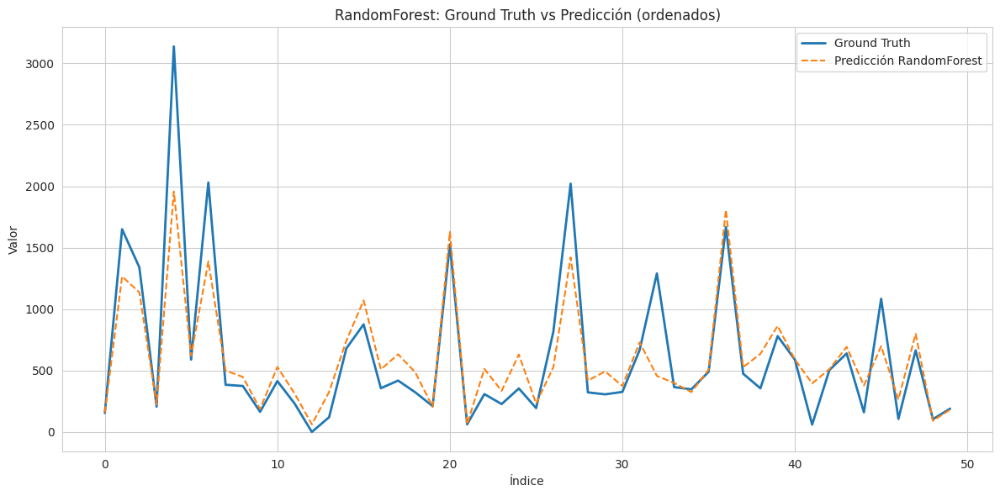

In [ ]:
plt.figure(figsize=(12, 6))
plt.plot(y_test_rf.reset_index(drop=True), label='Ground Truth', linewidth=2)
plt.plot(pd.Series(y_pred_rf).reset_index(drop=True), label='Predicción RandomForest', linestyle='--')
plt.title("RandomForest: Ground Truth vs Predicción (ordenados)")
plt.xlabel("Índice")
plt.ylabel("Valor")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


##Regresion Polinomial


In [ ]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
import numpy as np

# --- Definir Top-5 features según cada método ---
top5_kbest = ordered_kbest[:5]
top5_rf = ordered_rf[:5]

# --- Crear datasets finales ---
X_kbest = X_scaled[top5_kbest]
X_rf = X_imputed[top5_rf]

# --- Transformación polinomial (grado 2) ---
poly = PolynomialFeatures(degree=2, include_bias=False)

X_kbest_poly = poly.fit_transform(X_kbest)
X_rf_poly = poly.fit_transform(X_rf)

# --- Train/test split ---
X_train_kb, X_test_kb, y_train_kb, y_test_kb = train_test_split(X_kbest_poly, y, test_size=0.2, random_state=42)
X_train_rf, X_test_rf, y_train_rf, y_test_rf = train_test_split(X_rf_poly, y, test_size=0.2, random_state=42)

# --- Modelos ---
model_kb = LinearRegression()
model_kb.fit(X_train_kb, y_train_kb)
y_pred_kb = model_kb.predict(X_test_kb)

model_rf = LinearRegression()
model_rf.fit(X_train_rf, y_train_rf)
y_pred_rf = model_rf.predict(X_test_rf)

# --- Métricas ---
r2_kb = r2_score(y_test_kb, y_pred_kb)
rmse_kb = np.sqrt(mean_squared_error(y_test_kb, y_pred_kb))
mae_kb = mean_absolute_error(y_test_kb, y_pred_kb)

r2_rf = r2_score(y_test_rf, y_pred_rf)
rmse_rf = np.sqrt(mean_squared_error(y_test_rf, y_pred_rf))
mae_rf = mean_absolute_error(y_test_rf, y_pred_rf)

# --- Resultados ---
print("\n Modelo de Regresión Polinomial (grado 2) con Top-5 Features\n")

print("SelectKBest:")
print(f"Variables: {top5_kbest}")
print(f"R²   : {r2_kb:.3f}")
print(f"RMSE : {rmse_kb:.2f}")
print(f"MAE  : {mae_kb:.2f}")

print("RandomForest:")
print(f"Variables: {top5_rf}")
print(f"R²   : {r2_rf:.3f}")
print(f"RMSE : {rmse_rf:.2f}")
print(f"MAE  : {mae_rf:.2f}")



 Modelo de Regresión Polinomial (grado 2) con Top-5 Features

SelectKBest:
Variables: ['BFPD_Before', 'BOPD_Increment', 'BOPD_Before', 'Pr (psi)', 'Performance']
R²   : 0.880
RMSE : 213.88
MAE  : 135.38
RandomForest:
Variables: ['BFPD_Before', 'BOPD_Increment', 'BSW_Before', 'Pr (psi)', 'BOPD_Before']
R²   : 0.833
RMSE : 252.83
MAE  : 155.25


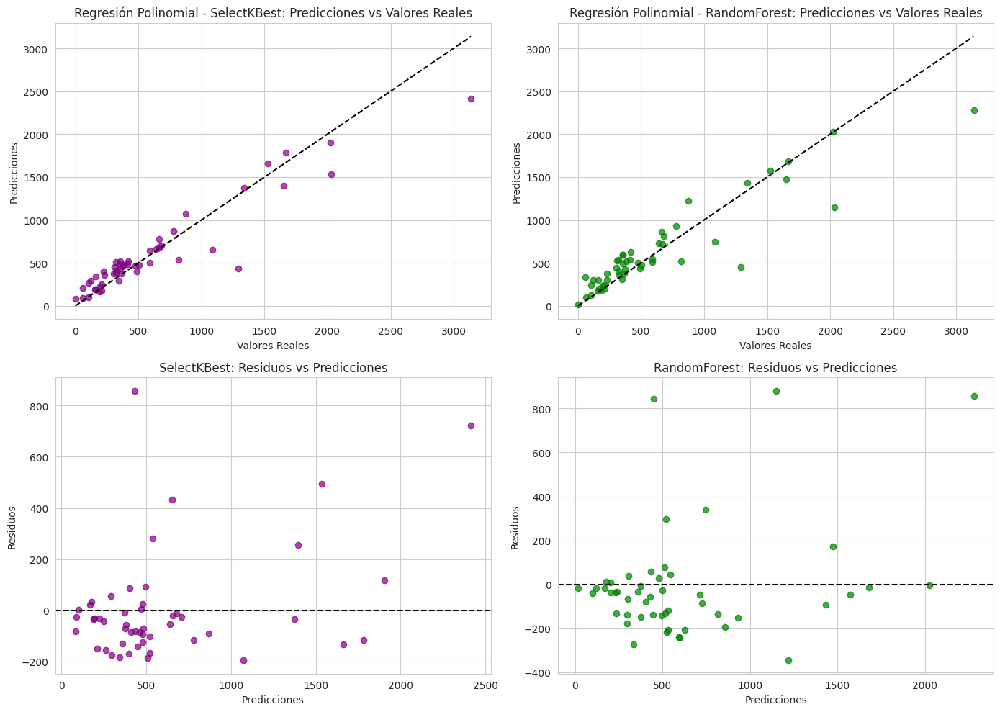

In [ ]:
import matplotlib.pyplot as plt

# --- Calcular residuos ---
residuos_kb = y_test_kb - y_pred_kb
residuos_rf = y_test_rf - y_pred_rf

# --- Crear figuras comparativas ---
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# --- SelectKBest: Predicciones vs Reales ---
axes[0, 0].scatter(y_test_kb, y_pred_kb, color='purple', alpha=0.7)
axes[0, 0].plot([y_test_kb.min(), y_test_kb.max()],
                [y_test_kb.min(), y_test_kb.max()], 'k--')
axes[0, 0].set_xlabel("Valores Reales")
axes[0, 0].set_ylabel("Predicciones")
axes[0, 0].set_title("Regresión Polinomial - SelectKBest: Predicciones vs Valores Reales")

# --- RandomForest: Predicciones vs Reales ---
axes[0, 1].scatter(y_test_rf, y_pred_rf, color='green', alpha=0.7)
axes[0, 1].plot([y_test_rf.min(), y_test_rf.max()],
                [y_test_rf.min(), y_test_rf.max()], 'k--')
axes[0, 1].set_xlabel("Valores Reales")
axes[0, 1].set_ylabel("Predicciones")
axes[0, 1].set_title("Regresión Polinomial - RandomForest: Predicciones vs Valores Reales")

# --- SelectKBest: Residuos vs Predicciones ---
axes[1, 0].scatter(y_pred_kb, residuos_kb, color='purple', alpha=0.7)
axes[1, 0].axhline(0, linestyle='--', color='black')
axes[1, 0].set_xlabel("Predicciones")
axes[1, 0].set_ylabel("Residuos")
axes[1, 0].set_title("SelectKBest: Residuos vs Predicciones")

# --- RandomForest: Residuos vs Predicciones ---
axes[1, 1].scatter(y_pred_rf, residuos_rf, color='green', alpha=0.7)
axes[1, 1].axhline(0, linestyle='--', color='black')
axes[1, 1].set_xlabel("Predicciones")
axes[1, 1].set_ylabel("Residuos")
axes[1, 1].set_title("RandomForest: Residuos vs Predicciones")

plt.tight_layout()
plt.show()


## RandomForestRegressor

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.ensemble import RandomForestRegressor
import numpy as np

# --- Usar top 10 features del Random Forest ---
top5_features = rf_importances['Feature'].head(5).tolist()

# Filtrar X con solo esas variables
X_top5 = X_imputed[top5_features]  # usaremos la versión imputada (sin NaNs)

# --- Dividir dataset en entrenamiento y prueba ---
X_train, X_test, y_train, y_test = train_test_split(X_top5, y, test_size=0.2, random_state=42)

# --- Entrenar modelo ---
model = RandomForestRegressor(n_estimators=200, random_state=42)
model.fit(X_train, y_train)

# --- Predicción ---
y_pred = model.predict(X_test)

# --- Métricas de evaluación ---
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

# --- Mostrar resultados ---
print("Evaluación del modelo con Top 5 features:")
print(f"R² Score      : {r2:.3f}")
print(f"MAE           : {mae:.2f}")
print(f"RMSE          : {rmse:.2f}")


Evaluación del modelo con Top 5 features:
R² Score      : 0.682
MAE           : 183.34
RMSE          : 348.57


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np



# Calcular residuos
residuos = y_test - y_pred

# Configurar estilo de los gráficos
sns.set(style="whitegrid", font_scale=1.2)

# Crear figura con dos subgráficos
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Gráfico 1: Predicciones vs. Valores Reales
sns.scatterplot(x=y_test, y=y_pred, ax=axes[0], color='blue', edgecolor='w', s=70)
axes[0].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
axes[0].set_title('Predicciones vs. Valores Reales')
axes[0].set_xlabel('Valores Reales')
axes[0].set_ylabel('Predicciones')

# Gráfico 2: Residuos vs. Predicciones
sns.scatterplot(x=y_pred, y=residuos, ax=axes[1], color='red', edgecolor='w', s=70)
axes[1].axhline(0, color='black', linestyle='--', lw=2)
axes[1].set_title('Residuos vs. Predicciones')
axes[1].set_xlabel('Predicciones')
axes[1].set_ylabel('Residuos')

plt.tight_layout()
plt.show()


## RandomForestRegressor | Versión Mejorada con log-transform aplicada a y

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# --- Usar top 10 features del Random Forest ---
top10_features = rf_importances['Feature'].head(10).tolist()
X_top10 = X_imputed[top10_features]

# --- Log-transform a la variable objetivo ---
y_log = np.log1p(y)  # log1p(x) = log(1 + x)

# --- División entrenamiento / prueba ---
X_train, X_test, y_train_log, y_test_log = train_test_split(X_top10, y_log, test_size=0.2, random_state=42)

# --- Entrenamiento del modelo ---
model = RandomForestRegressor(n_estimators=200, random_state=42)
model.fit(X_train, y_train_log)

# --- Predicciones (en log) y revertir transformación ---
y_pred_log = model.predict(X_test)
y_pred = np.expm1(y_pred_log)        # Revertir log1p
y_test = np.expm1(y_test_log)        # Revertir para comparar con los reales

# --- Evaluación del modelo ---
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

print("Evaluación del modelo con log-transform:")
print(f"R² Score      : {r2:.3f}")
print(f"MAE           : {mae:.2f}")
print(f"RMSE          : {rmse:.2f}")


OJO , ESTE **LOG TRANSFORM** SE DEBE APLICAR A LA ENTRADA Y NO A LA SALIDA REVISAR Y CORREGIR

In [ ]:
# Calcular residuos
residuos = y_test - y_pred

# Estilo
sns.set(style="whitegrid", font_scale=1.2)
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Gráfico 1: Predicciones vs. Valores Reales
sns.scatterplot(x=y_test, y=y_pred, ax=axes[0], color='blue', edgecolor='w', s=70)
axes[0].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
axes[0].set_title('Predicciones vs. Valores Reales (con log-transform)')
axes[0].set_xlabel('Valores Reales')
axes[0].set_ylabel('Predicciones')

# Gráfico 2: Residuos vs. Predicciones
sns.scatterplot(x=y_pred, y=residuos, ax=axes[1], color='red', edgecolor='w', s=70)
axes[1].axhline(0, color='black', linestyle='--', lw=2)
axes[1].set_title('Residuos vs. Predicciones (con log-transform)')
axes[1].set_xlabel('Predicciones')
axes[1].set_ylabel('Residuos')

plt.tight_layout()
plt.show()


## XGBoostRegressor

In [ ]:
!pip install xgboost


In [ ]:
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Usar top 5 features del Random Forest
top10_features = rf_importances['Feature'].head(5).tolist()
X_top10 = X_imputed[top10_features]

# Log-transform de la variable objetivo OJO ESTO HAY QUE CAMBIARLO Y REVISAR
y_log = np.log1p(y)

# División entrenamiento / prueba
X_train, X_test, y_train_log, y_test_log = train_test_split(X_top10, y_log, test_size=0.2, random_state=42)

# Entrenar modelo XGBoost
model_xgb = XGBRegressor(n_estimators=200, learning_rate=0.1, random_state=42)
model_xgb.fit(X_train, y_train_log)

# Predicciones y revertir log-transform
y_pred_log = model_xgb.predict(X_test)
y_pred = np.expm1(y_pred_log)
y_test = np.expm1(y_test_log)

# Métricas
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

print("Evaluación del modelo XGBoost con log-transform:")
print(f"R² Score      : {r2:.3f}")
print(f"MAE           : {mae:.2f}")
print(f"RMSE          : {rmse:.2f}")
